# Connect Forest Management Model with Forest Carbon Budget Model

In [1]:
import numpy as np
import math
import matplotlib.pyplot as plt
import pandas as pd
import ipywidgets as widgets
from IPython.display import display
import ws3.forest
import time
import gurobipy as grb
import pickle
import libcbm
import os
from util_opt import compile_events, cbm_report, compile_scenario_maxstock, plot_scenario_maxstock, run_cbm_emissionstock, run_scenario, plugin_c_curves, plugin_c_curves_both, cbm_report_both, compare_ws3_cbm, compare_ws3_cbm_both, track_system_stock, track_system_emission, compile_scenario_minemission, plot_scenario_minemission, kpi_age, kpi_species, cmp_c_ss, cmp_c_se, results_scenarios, bootstrap_ogi, compare_kpi_age

In [2]:
base_year = 2020
horizon = 10
period_length = 10
max_age = 1000
n_steps = 100
tvy_name = 'totvol'
max_harvest = 1.0

In [3]:
# Define scenario options based on case study
scenario_options = {
    'redchris': ['no_cons','evenflow_cons', 'redchrs_AAC_90%', 'redchrs_AAC_80%', 'redchrs_AAC_70%', 'redchrs_AAC_60%', 'redchrs_AAC_50%', 'redchrs_AAC_40%', 'redchrs_AAC_30%', 'redchrs_AAC_20%', 'redchrs_AAC_10%' ],
    'goldenbear': ['no_cons', 'evenflow_cons', 'gldbr_AAC_90%', 'gldbr_AAC_80%', 'gldbr_AAC_70%', 'gldbr_AAC_60%', 'gldbr_AAC_50%', 'gldbr_AAC_40%', 'gldbr_AAC_30%', 'gldbr_AAC_20%', 'gldbr_AAC_10%'],
    'equitysilver': [ 'no_cons','evenflow_cons', 'eqtslvr_AAC_90%', 'eqtslvr_AAC_80%', 'eqtslvr_AAC_70%', 'eqtslvr_AAC_60%', 'eqtslvr_AAC_50%', 'eqtslvr_AAC_40%', 'eqtslvr_AAC_30%', 'eqtslvr_AAC_20%', 'eqtslvr_AAC_10%'],
    'test': ['no_cons', 'evenflow_cons', 'bau_redchrs']
}

# Function to handle case study selection and update scenario dropdown
def select_case_study(case_study):
    print(f"Selected case study: {case_study}")
    # Update the scenario dropdown based on the selected case study
    scenario_dropdown.options = scenario_options.get(case_study, [])
    scenario_dropdown.value = scenario_options[case_study][0]  # Set a default value

# Case study dropdown
case_study_dropdown = widgets.Dropdown(
    options=['redchris', 'goldenbear', 'equitysilver', 'test'],
    value='equitysilver',
    description='Case Study:'
)
case_study_dropdown.observe(lambda change: select_case_study(change['new']), names='value')
display(case_study_dropdown)

# Function to handle scenario selection
def select_scenario(scenario_name):
    print(f"Selected scenario: {scenario_name}")

# Scenario dropdown
scenario_dropdown = widgets.Dropdown(
    options=scenario_options['redchris'],  # Set initial options based on default case study
    value=scenario_options['redchris'][1],  # Set initial value
    description='Scenario:'
)
scenario_dropdown.observe(lambda change: select_scenario(change['new']), names='value')
display(scenario_dropdown)

# Function to handle objective functon
def select_obj(obj_mode):
    print(f"Selected objective: {obj_mode}")
obj_dropdown = widgets.Dropdown(
    options=['max_hv', 'min_ha', 'max_st', 'min_em'],
    value='min_ha',
    description='Objective:'
)
display(obj_dropdown)
obj_dropdown.observe(lambda change: select_obj(change['new']), names='value')

Dropdown(description='Case Study:', index=2, options=('redchris', 'goldenbear', 'equitysilver', 'test'), value…

Dropdown(description='Scenario:', index=1, options=('no_cons', 'evenflow_cons', 'redchrs_AAC_90%', 'redchrs_AA…

Dropdown(description='Objective:', index=1, options=('max_hv', 'min_ha', 'max_st', 'min_em'), value='min_ha')

In [4]:
# Initialize main widget components 
hwp_pool_effect = widgets.FloatSlider(min=0, max=1, step=1, description='HWP_effect', value=1, layout=widgets.Layout(margin='10px 0'))
release_immediately = widgets.FloatSlider(min=0, max=1, step=1, description='Release immediately', value=1, layout=widgets.Layout(margin='10px 0'))
displacement_effect = widgets.FloatSlider(min=0, max=1, step=1, description='Displacement', value=1, layout=widgets.Layout(margin='10px 0'))
clt_percentage = widgets.FloatSlider(min=0, max=1, step=0.1, description='CLT_percent:', value=0.5, layout=widgets.Layout(margin='10px 0'))
credibility = widgets.FloatSlider(min=0, max=1, step=0.1, description='Credibility:', value=1, layout=widgets.Layout(margin='10px 0'))
# max_harvest = widgets.FloatSlider(min=0, max=1, step=0.05, description='Max_harvest:', value=1.0, layout=widgets.Layout(margin='10px 0'))
budget_input = widgets.FloatText(value=10000000, description='Budget:', layout=widgets.Layout(margin='10px 0'))

release_immediately.layout.display = 'none' if hwp_pool_effect.value != 0 else 'block'
displacement_effect.layout.display = 'block' if hwp_pool_effect.value != 0 else 'none'
clt_percentage.layout.display = 'block' if hwp_pool_effect.value != 0 and displacement_effect.value != 0 else 'none'
credibility.layout.display = 'block' if hwp_pool_effect.value != 0 and displacement_effect.value != 0 else 'none'

container = widgets.VBox([
    hwp_pool_effect, release_immediately, displacement_effect, clt_percentage, credibility, budget_input  
    # ,max_harvest
])

display(container)

def update_widgets(change):
    hwp_pool_effect_value = hwp_pool_effect.value
    displacement_effect_value = displacement_effect.value

    release_immediately.layout.display = 'block' if hwp_pool_effect_value == 0 else 'none'
    displacement_effect.layout.display = 'block' if hwp_pool_effect_value != 0 else 'none'

    clt_percentage.layout.display = 'block' if hwp_pool_effect_value != 0 and displacement_effect_value != 0 else 'none'
    credibility.layout.display = 'block' if hwp_pool_effect_value != 0 and displacement_effect_value != 0 else 'none'

hwp_pool_effect.observe(update_widgets, names='value')
displacement_effect.observe(update_widgets, names='value')

In [5]:
#Start Calculating the Running Time
Start = time.time()

In [6]:
case_study = case_study_dropdown.value
scenario_name = scenario_dropdown.value
obj_mode = obj_dropdown.value
hwp_pool_effect_value = hwp_pool_effect.value
release_immediately_value = release_immediately.value if hwp_pool_effect_value == 0 else 0
displacement_effect = displacement_effect.value if hwp_pool_effect_value != 0 else 0
clt_percentage = clt_percentage.value if displacement_effect != 0 else 0
credibility = credibility.value if displacement_effect != 0 else 0
# max_harvest = max_harvest.value
budget_input = budget_input.value

In [7]:
# Define case study mappings and retrieve model details based on case study
case_study_options = {
    'redchris': {
        'model_name': 'redchris',
        'model_path': './data/woodstock_model_files_redchris'
    },
    'goldenbear': {
        'model_name': 'goldenbear',
        'model_path': './data/woodstock_model_files_goldenbear'
    },
    'equitysilver': {
        'model_name': 'equitysilver',
        'model_path': './data/woodstock_model_files_equitysilver'
    },
    'test': {
        'model_name': 'redchris',
        'model_path': './data/woodstock_model_files_redchris_test'
    }
}

model_info = case_study_options.get(case_study)

if model_info:
    model_name = model_info['model_name']
    model_path = model_info['model_path']
else:
    print('The case study name is not valid')


In [8]:
# Create and Run `ForestModel` instance
fm = ws3.forest.ForestModel(model_name=model_name,
                            model_path=model_path,
                            base_year=base_year,
                            horizon=horizon,
                            period_length=period_length,
                            max_age=max_age)
fm.import_landscape_section()
fm.import_areas_section()
fm.import_yields_section()
fm.import_actions_section()
fm.import_transitions_section()
fm.initialize_areas()
fm.add_null_action()
fm.reset_actions()
fm.grow()

In [9]:
# Flag 'harvest' as a harvesting action in the ws3 model
harvest_acode='harvest'
fm.actions[harvest_acode].is_harvest = True

In [10]:
# Read curves
file_directory = "./inputs/curves"
file_names = [f"{case_study}_c_curves_p.pkl", f"{case_study}_c_curves_f.pkl"]
loaded_data = {}

for filename in file_names:
    file_path = os.path.join(file_directory, filename)
    with open(file_path, 'rb') as file:
        loaded_data[filename] = pickle.load(file)
    print(f"Loaded data from {file_path}")

c_curves_p = loaded_data.get(f"{case_study}_c_curves_p.pkl")
c_curves_f = loaded_data.get(f"{case_study}_c_curves_f.pkl")

Loaded data from ./inputs/curves/equitysilver_c_curves_p.pkl
Loaded data from ./inputs/curves/equitysilver_c_curves_f.pkl


In [11]:
# Plug carbon and old groth yield curves into forest model
plugin_c_curves_both(fm, c_curves_p, c_curves_f)
bootstrap_ogi(fm)

Running for equitysilver_min_ha_no_cons...
running no_cons scenario
Set parameter Username
Academic license - for non-commercial use only - expires 2025-01-09
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17023 rows, 83258 columns and 83258 nonzeros
Model fingerprint: 0x6bae0ea1
Coefficient statistics:
  Matrix range     [1e+00, 1e+00]
  Objective range  [1e-01, 3e+03]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+00]
Presolve removed 17023 rows and 83258 columns
Presolve time: 0.05s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.07 seconds (0.02 work units)
Optimal objective  0.000000000e+00


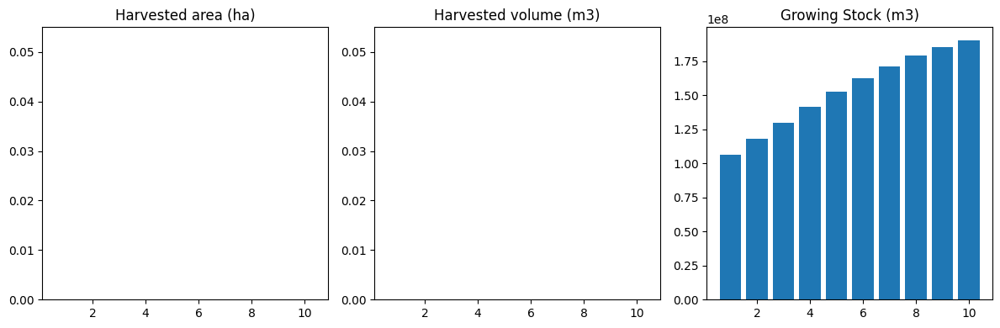

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_no_cons_scheduling.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  0
The economic indicator (the provincial government revenues) is:  0
------------------------------------------------
Saved cbm_output_1 and cbm_output_2 as pickle files.


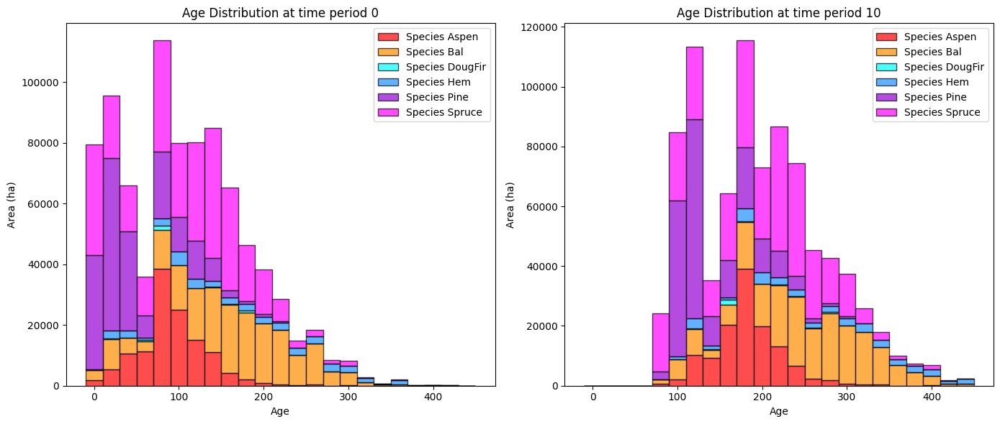

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_no_cons_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0             10     Difference
Hem      19152.127229   32688.964561   13536.837333
DougFir    947.047810    2749.298212    1802.250402
Bal      59315.970469  157689.747715   98373.777247
Spruce   36410.744598  198358.607639  161947.863041
Aspen    29632.731169  118345.834248   88713.103079
Pine      7432.733686   70671.811755   63239.078069

Overall diversity has **increased** by 427612.91 hectares from time period 0 to time period 10.


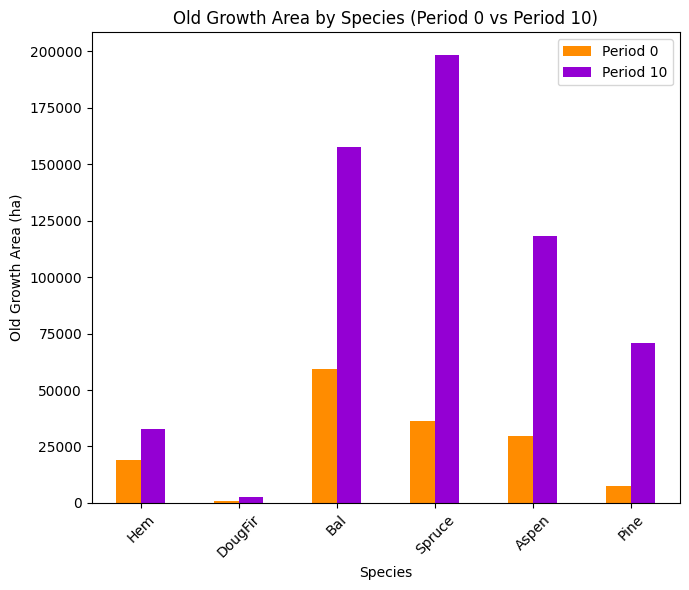

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_no_cons_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7457

Diversity has **decreased** by 1.35% from time 0 to time 10.


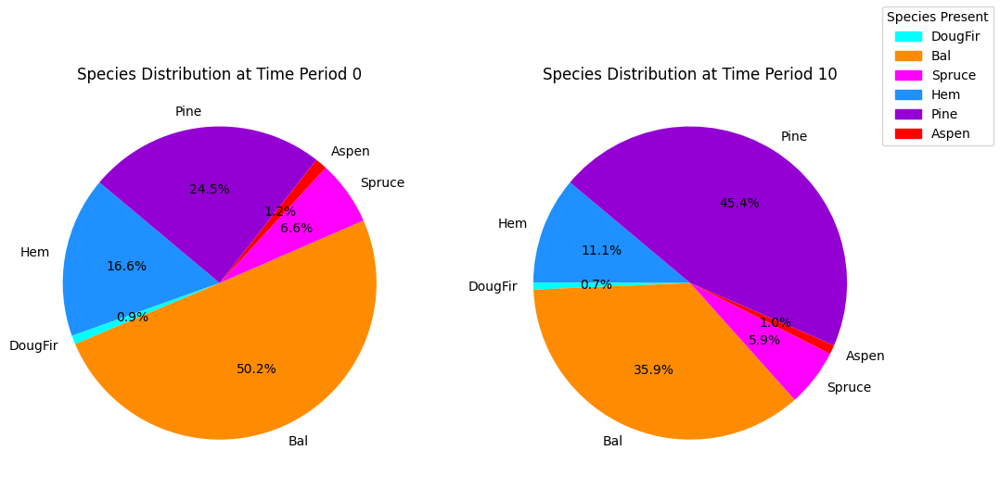

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_ha_no_cons_species_pie.pdf
running business as usual scenario for the Equity Silver mining site
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0x1149349b
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [1e-01, 3e+03]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8907 columns
Presolve time: 0.33s
Presolved: 8375 rows, 74352 columns, 536195 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Ordering t

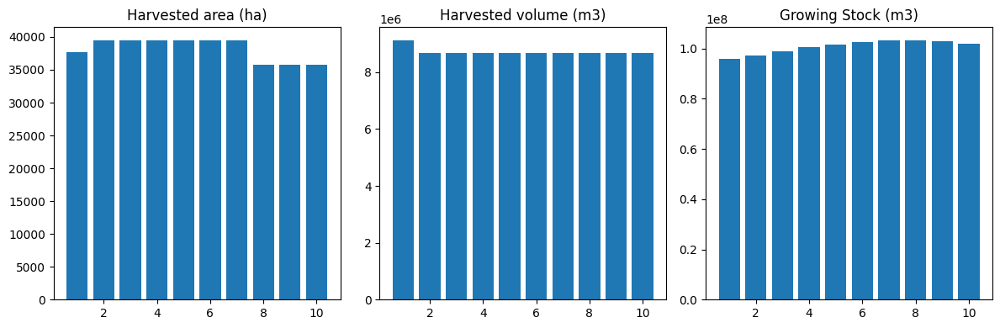

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_scheduling.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  92157
The economic indicator (the provincial government revenues) is:  3142756
------------------------------------------------
Saved cbm_output_3 and cbm_output_4 as pickle files.


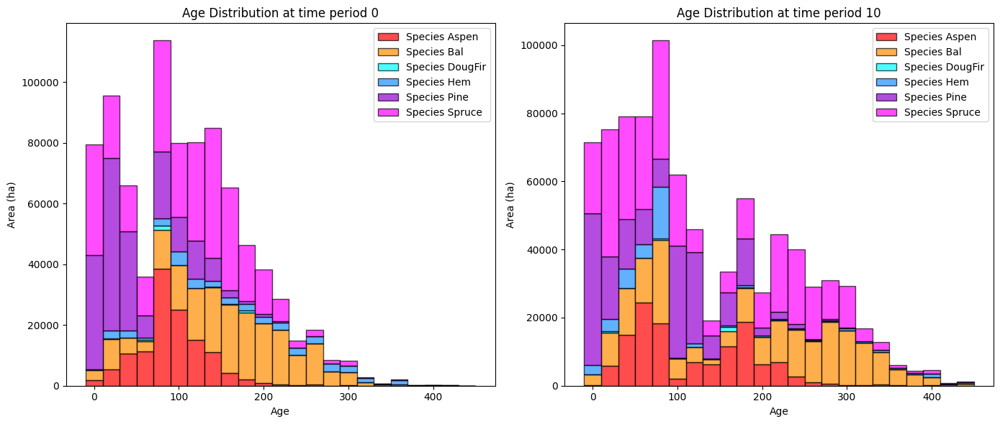

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0             10    Difference
Hem      19152.127229    6181.406415 -12970.720813
DougFir    947.047810    1826.436329    879.388519
Bal      59315.970469  103190.283054  43874.312585
Spruce   36410.744598  106090.302348  69679.557750
Aspen    29632.731169   57543.448439  27910.717270
Pine      7432.733686   28846.602045  21413.868359

Overall diversity has **increased** by 150787.12 hectares from time period 0 to time period 10.


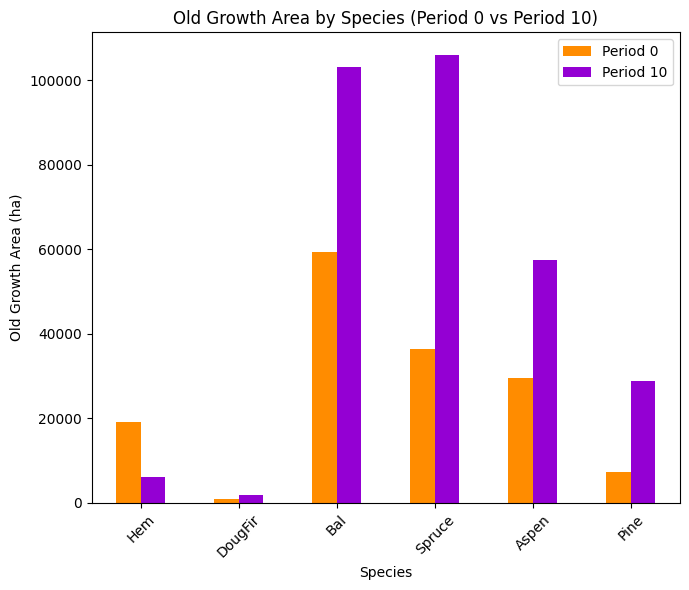

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7543

Diversity has **decreased** by 0.49% from time 0 to time 10.


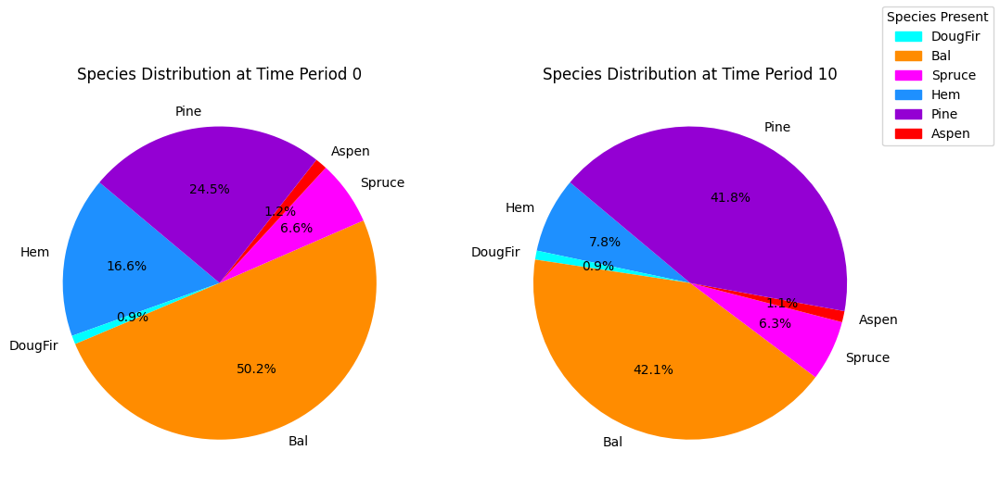

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_species_pie.pdf


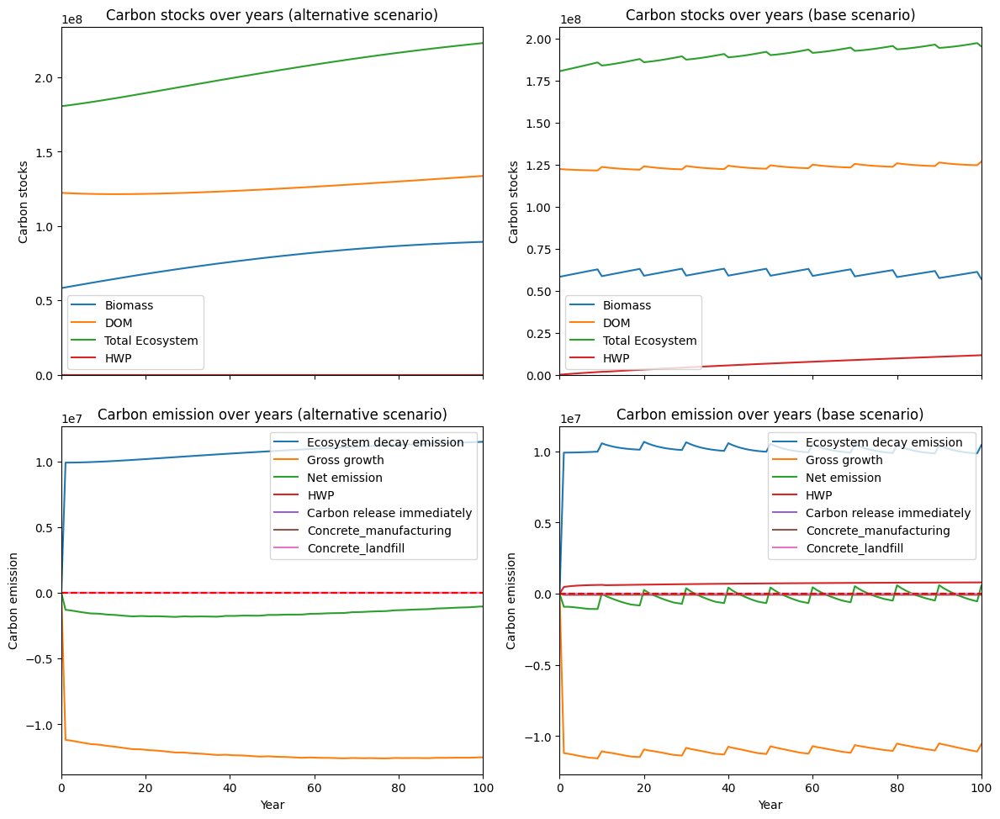

---------------------------------------------------------------------------------------
Net emission difference -25121662.22818869
Net emission base scenario -39533774.029656515
Net emission alternative scenario -14412111.801467825
dollar_per_ton is:  0.3980628315581415
Comparison of Old Growth Areas (Alternative - Base)
           0            10    Difference
Hem      0.0  26507.558146  26507.558146
DougFir  0.0    922.861883    922.861883
Bal      0.0  54499.464661  54499.464661
Spruce   0.0  92268.305291  92268.305291
Aspen    0.0  60802.385809  60802.385809
Pine     0.0  41825.209710  41825.209710

Overall, the old growth area has **increased** by 276825.79 hectares in the alternative scenario compared to the base scenario.


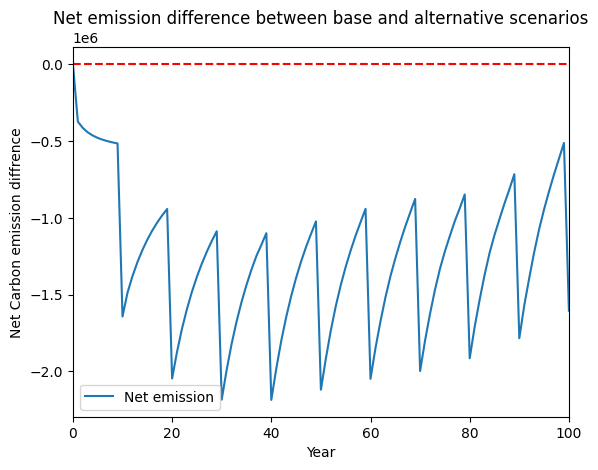

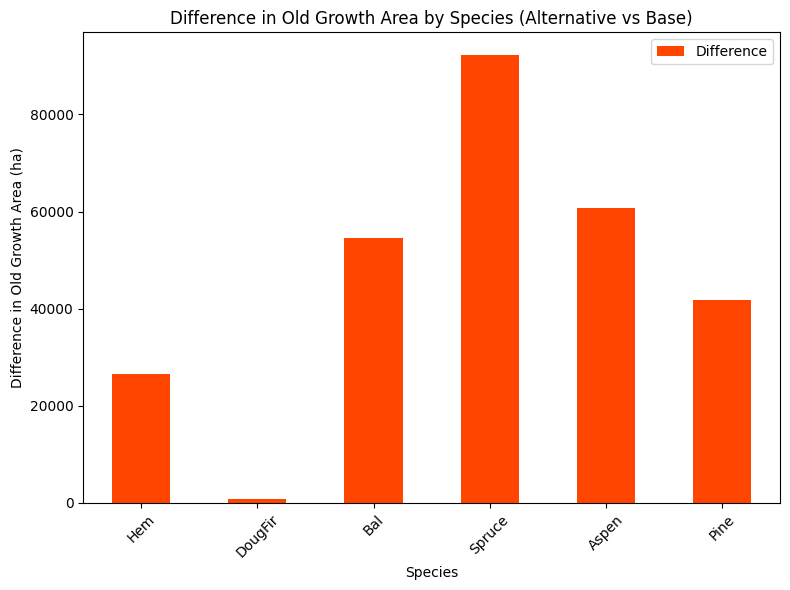

<Figure size 640x480 with 0 Axes>

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_kpi_age_difference.pdf


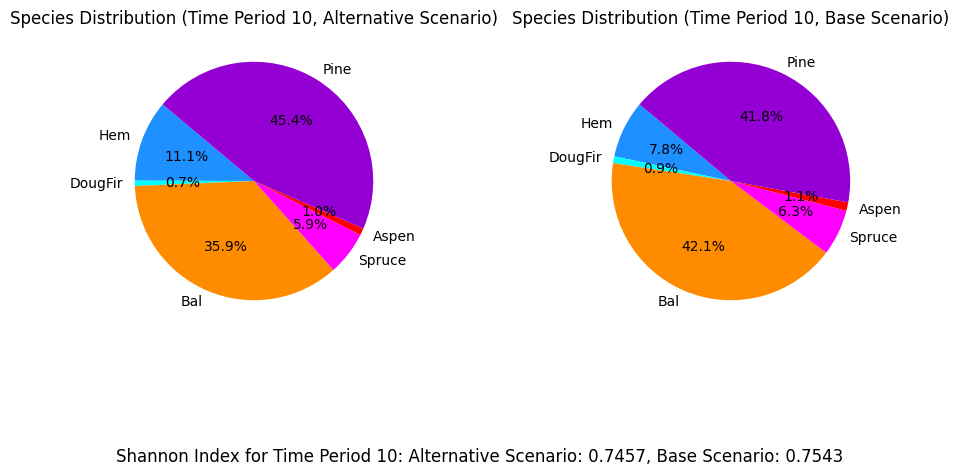

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_ha_kpi_species_difference_pie.pdf
---------------------------------------------------------------------------------------
Running for equitysilver_min_ha_evenflow_cons...
running even flow constraints scenario
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17063 rows, 83258 columns and 514878 nonzeros
Model fingerprint: 0x39f56859
Coefficient statistics:
  Matrix range     [5e-03, 6e+05]
  Objective range  [1e-01, 3e+03]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+00]
Presolve removed 17063 rows and 83258 columns
Presolve time: 0.07s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.0000

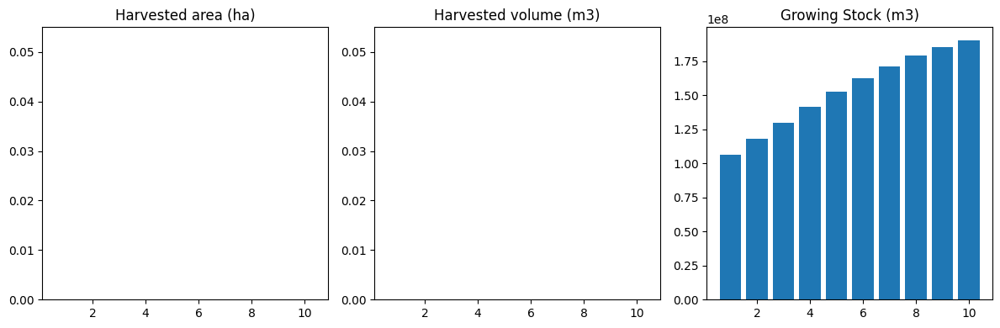

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_evenflow_cons_scheduling.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  0
The economic indicator (the provincial government revenues) is:  0
------------------------------------------------
Saved cbm_output_1 and cbm_output_2 as pickle files.


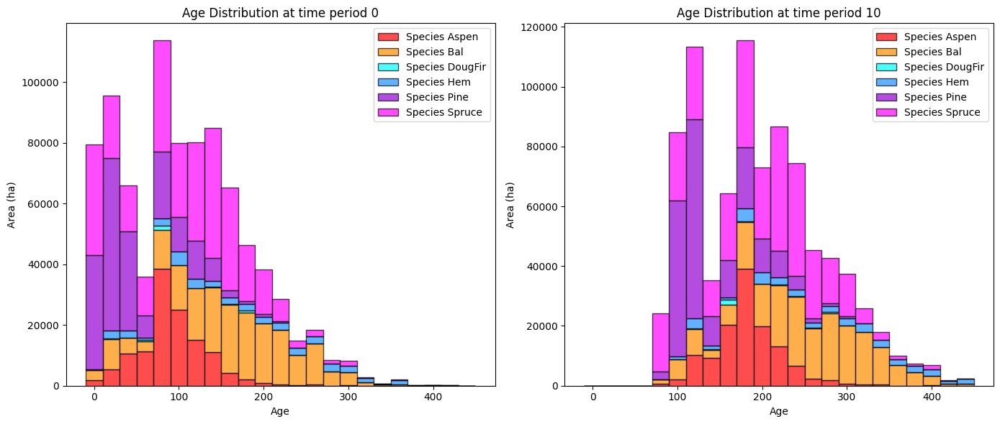

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_evenflow_cons_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0             10     Difference
Hem      19152.127229   32688.964561   13536.837333
DougFir    947.047810    2749.298212    1802.250402
Bal      59315.970469  157689.747715   98373.777247
Spruce   36410.744598  198358.607639  161947.863041
Aspen    29632.731169  118345.834248   88713.103079
Pine      7432.733686   70671.811755   63239.078069

Overall diversity has **increased** by 427612.91 hectares from time period 0 to time period 10.


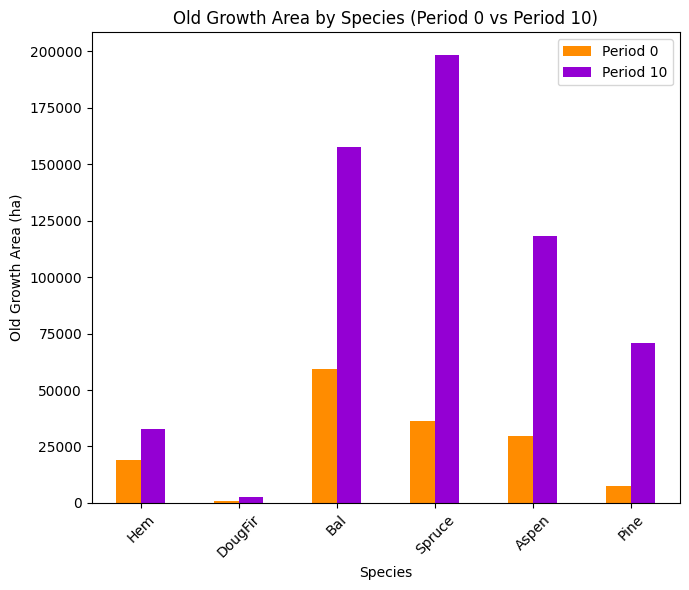

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_evenflow_cons_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7457

Diversity has **decreased** by 1.35% from time 0 to time 10.


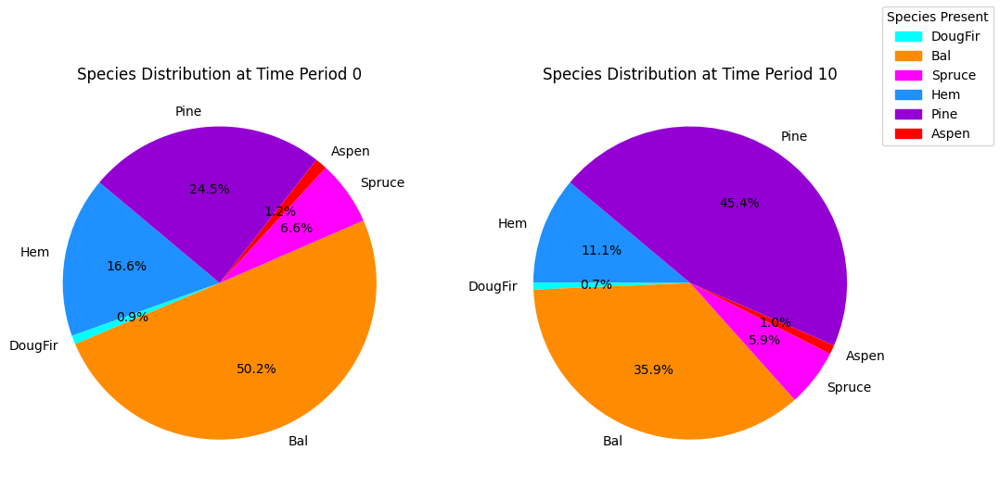

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_ha_evenflow_cons_species_pie.pdf
running business as usual scenario for the Equity Silver mining site
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0x1149349b
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [1e-01, 3e+03]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8907 columns
Presolve time: 0.40s
Presolved: 8375 rows, 74352 columns, 536195 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Orde

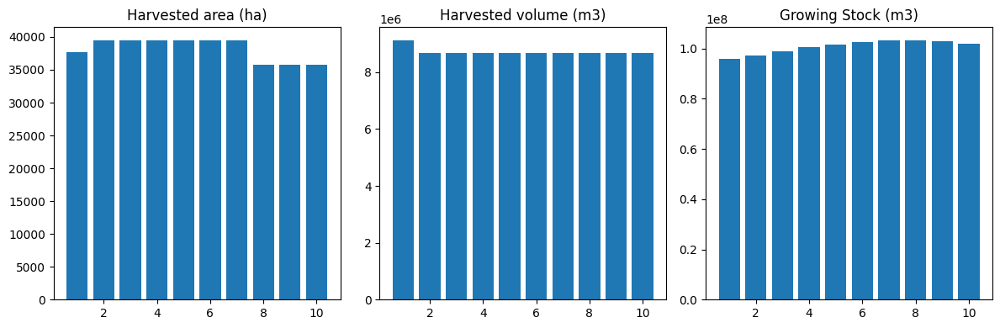

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_scheduling.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  92157
The economic indicator (the provincial government revenues) is:  3142756
------------------------------------------------
Saved cbm_output_3 and cbm_output_4 as pickle files.


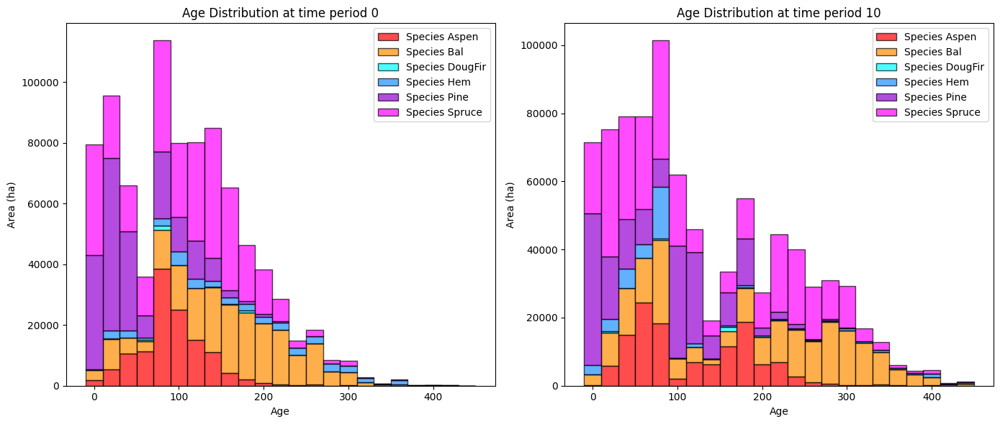

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0             10    Difference
Hem      19152.127229    6181.406415 -12970.720813
DougFir    947.047810    1826.436329    879.388519
Bal      59315.970469  103190.283054  43874.312585
Spruce   36410.744598  106090.302348  69679.557750
Aspen    29632.731169   57543.448439  27910.717270
Pine      7432.733686   28846.602045  21413.868359

Overall diversity has **increased** by 150787.12 hectares from time period 0 to time period 10.


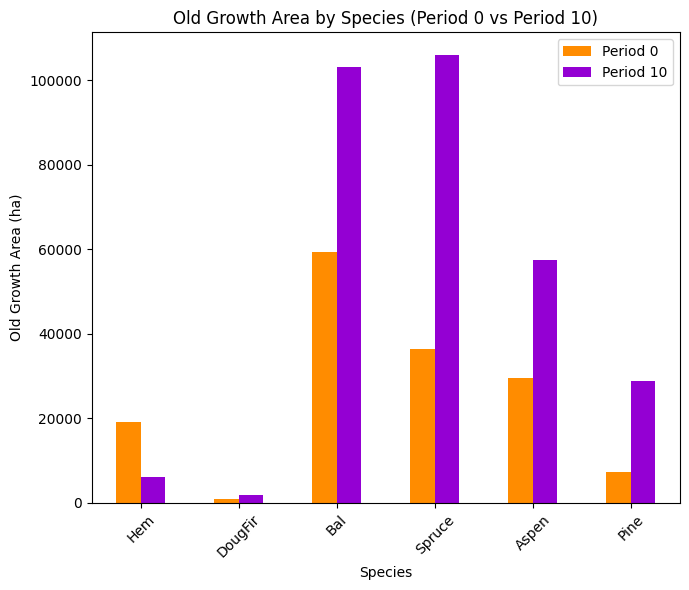

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7543

Diversity has **decreased** by 0.49% from time 0 to time 10.


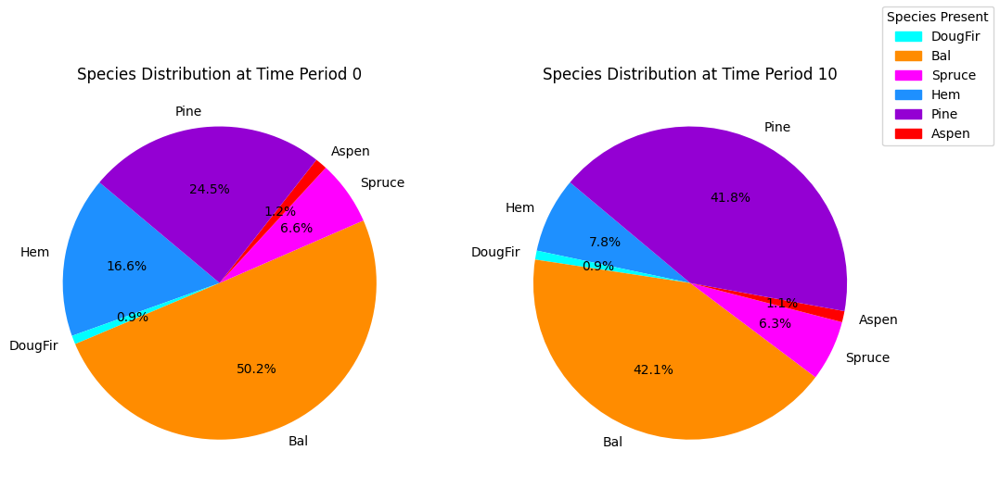

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_species_pie.pdf


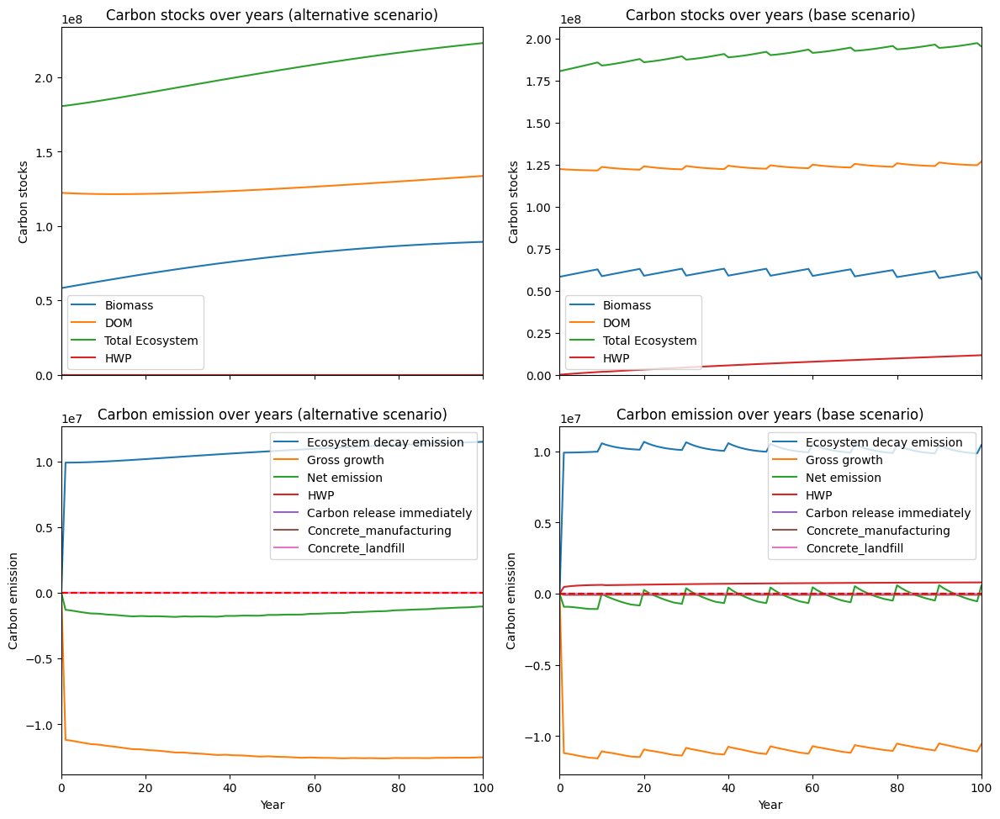

---------------------------------------------------------------------------------------
Net emission difference -25121662.22818869
Net emission base scenario -39533774.029656515
Net emission alternative scenario -14412111.801467825
dollar_per_ton is:  0.3980628315581415
Comparison of Old Growth Areas (Alternative - Base)
           0            10    Difference
Hem      0.0  26507.558146  26507.558146
DougFir  0.0    922.861883    922.861883
Bal      0.0  54499.464661  54499.464661
Spruce   0.0  92268.305291  92268.305291
Aspen    0.0  60802.385809  60802.385809
Pine     0.0  41825.209710  41825.209710

Overall, the old growth area has **increased** by 276825.79 hectares in the alternative scenario compared to the base scenario.


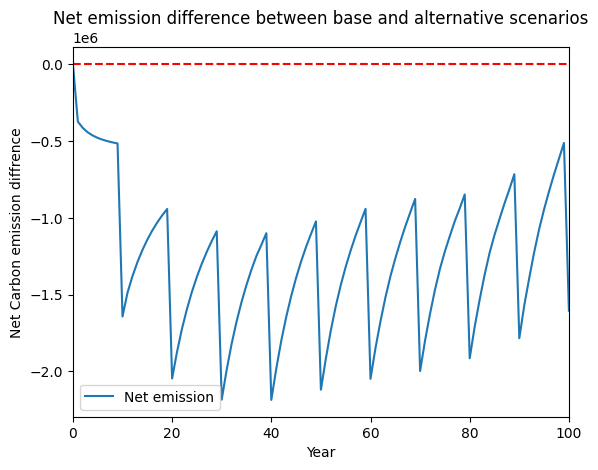

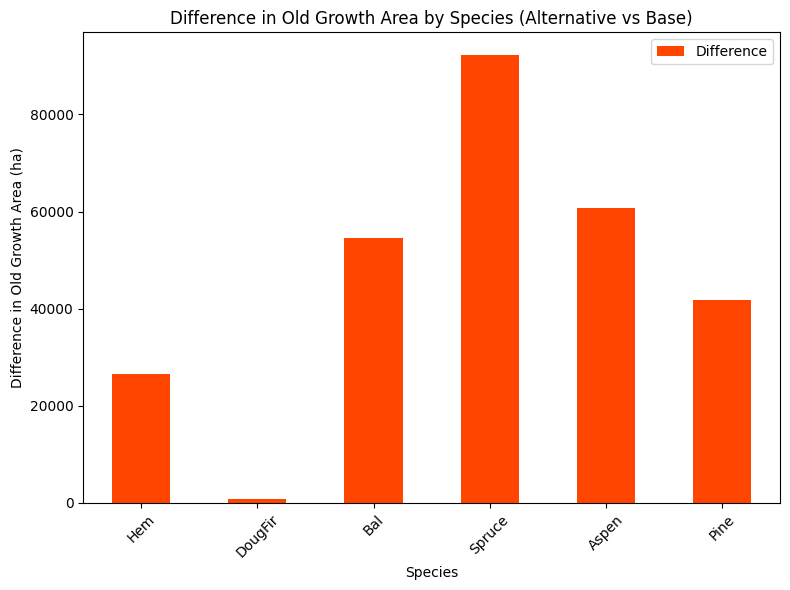

<Figure size 640x480 with 0 Axes>

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_kpi_age_difference.pdf


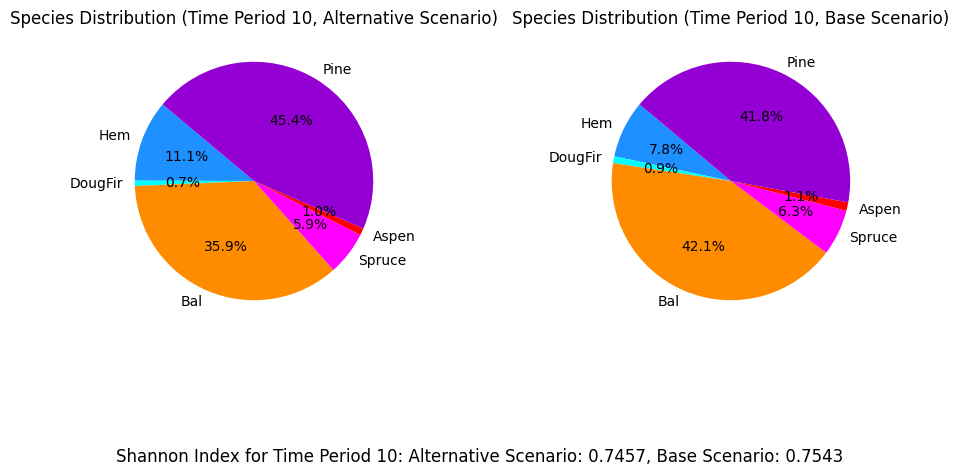

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_ha_kpi_species_difference_pie.pdf
---------------------------------------------------------------------------------------
Running for equitysilver_min_ha_bau_eqtslvr...
running business as usual scenario for the Equity Silver mining site
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0x1149349b
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [1e-01, 3e+03]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8907 columns
Presolve time: 0.48s
Presolved: 8375 ro

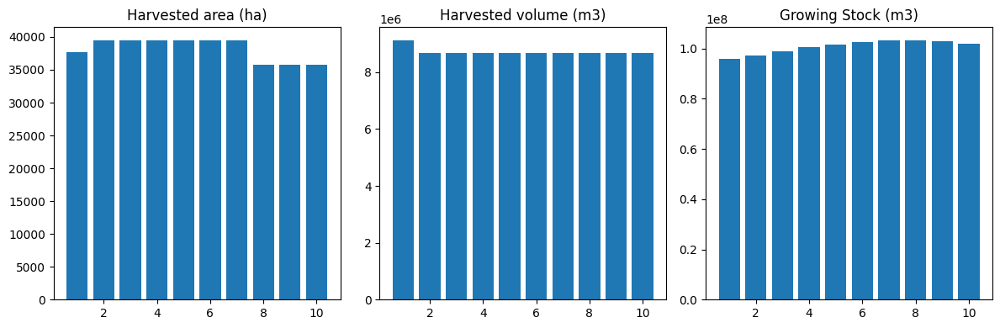

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_scheduling.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  92157
The economic indicator (the provincial government revenues) is:  3142756
------------------------------------------------
Saved cbm_output_1 and cbm_output_2 as pickle files.


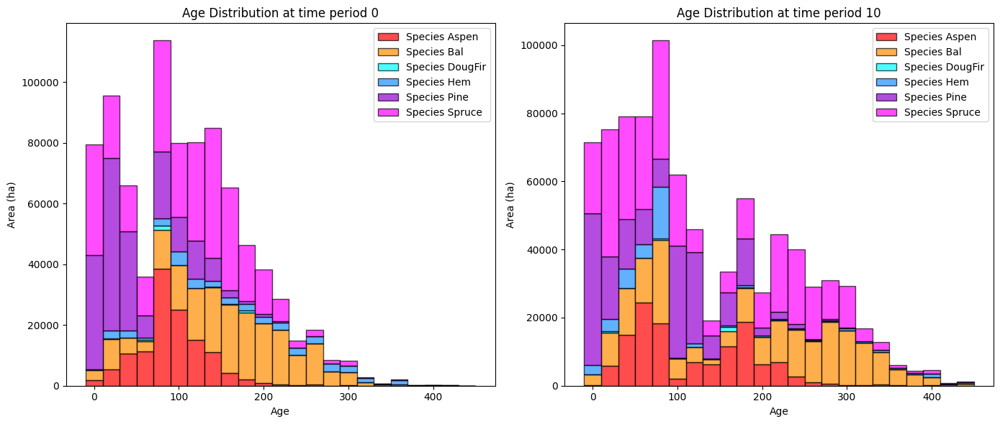

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0             10    Difference
Hem      19152.127229    6181.406415 -12970.720813
DougFir    947.047810    1826.436329    879.388519
Bal      59315.970469  103190.283054  43874.312585
Spruce   36410.744598  106090.302348  69679.557750
Aspen    29632.731169   57543.448439  27910.717270
Pine      7432.733686   28846.602045  21413.868359

Overall diversity has **increased** by 150787.12 hectares from time period 0 to time period 10.


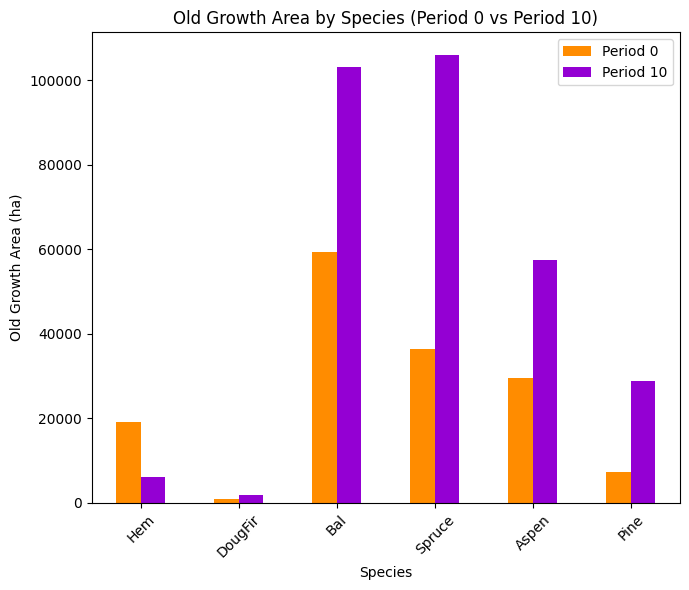

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7543

Diversity has **decreased** by 0.49% from time 0 to time 10.


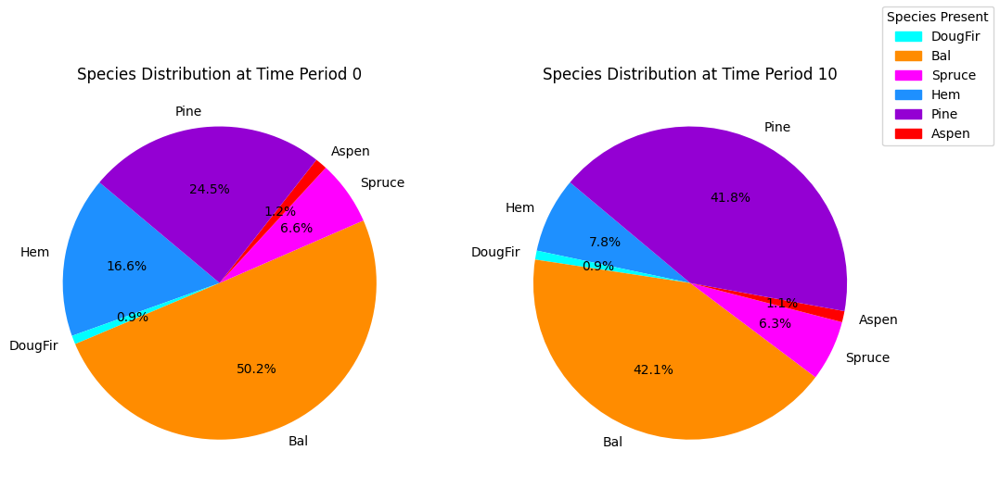

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_species_pie.pdf
running business as usual scenario for the Equity Silver mining site
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0x1149349b
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [1e-01, 3e+03]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8907 columns
Presolve time: 0.38s
Presolved: 8375 rows, 74352 columns, 536195 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Orderi

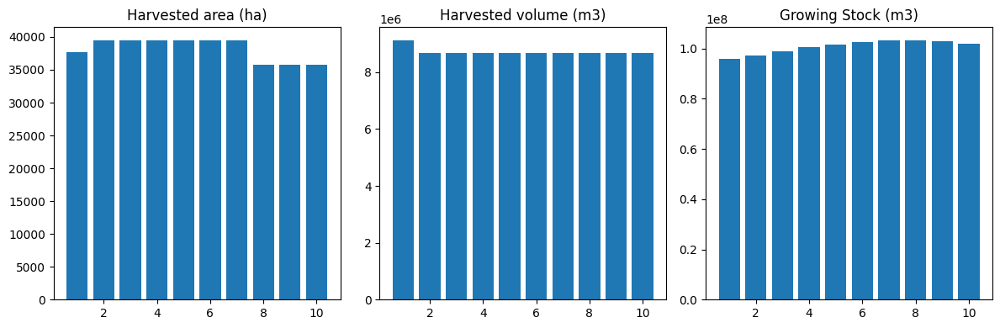

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_scheduling.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  92157
The economic indicator (the provincial government revenues) is:  3142756
------------------------------------------------
Saved cbm_output_3 and cbm_output_4 as pickle files.


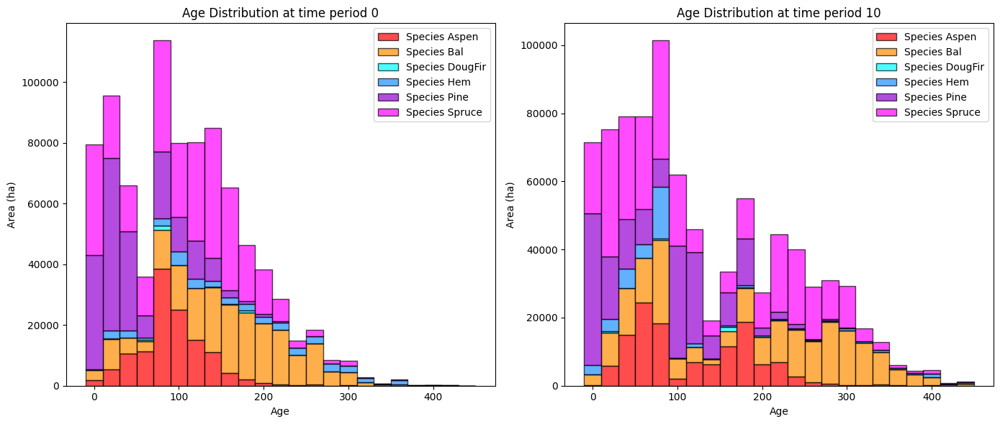

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0             10    Difference
Hem      19152.127229    6181.406415 -12970.720813
DougFir    947.047810    1826.436329    879.388519
Bal      59315.970469  103190.283054  43874.312585
Spruce   36410.744598  106090.302348  69679.557750
Aspen    29632.731169   57543.448439  27910.717270
Pine      7432.733686   28846.602045  21413.868359

Overall diversity has **increased** by 150787.12 hectares from time period 0 to time period 10.


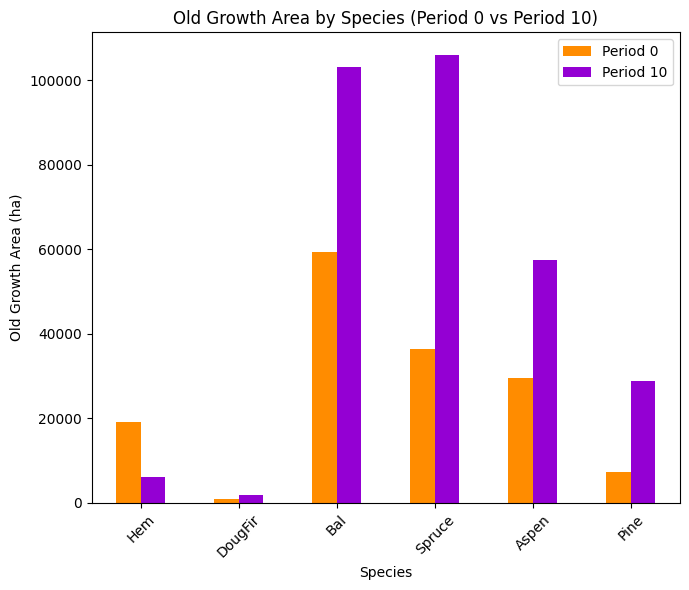

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7543

Diversity has **decreased** by 0.49% from time 0 to time 10.


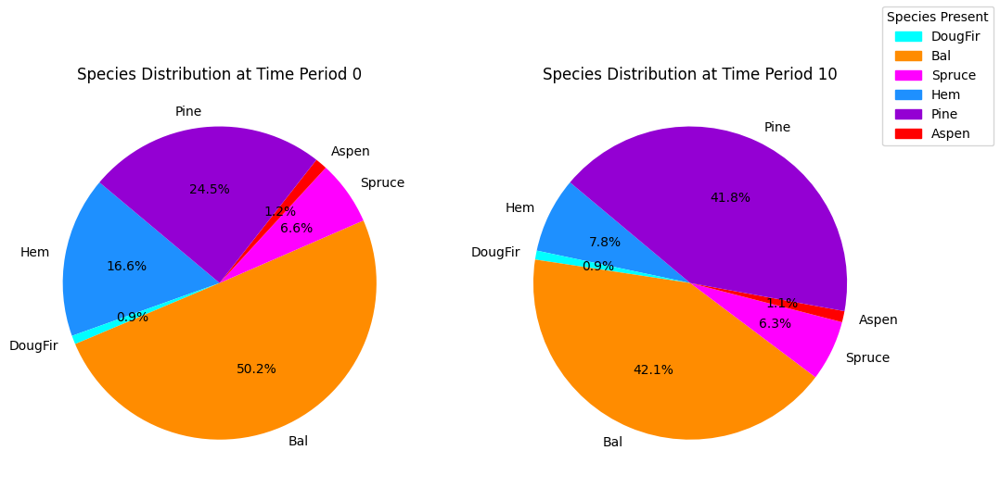

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_species_pie.pdf


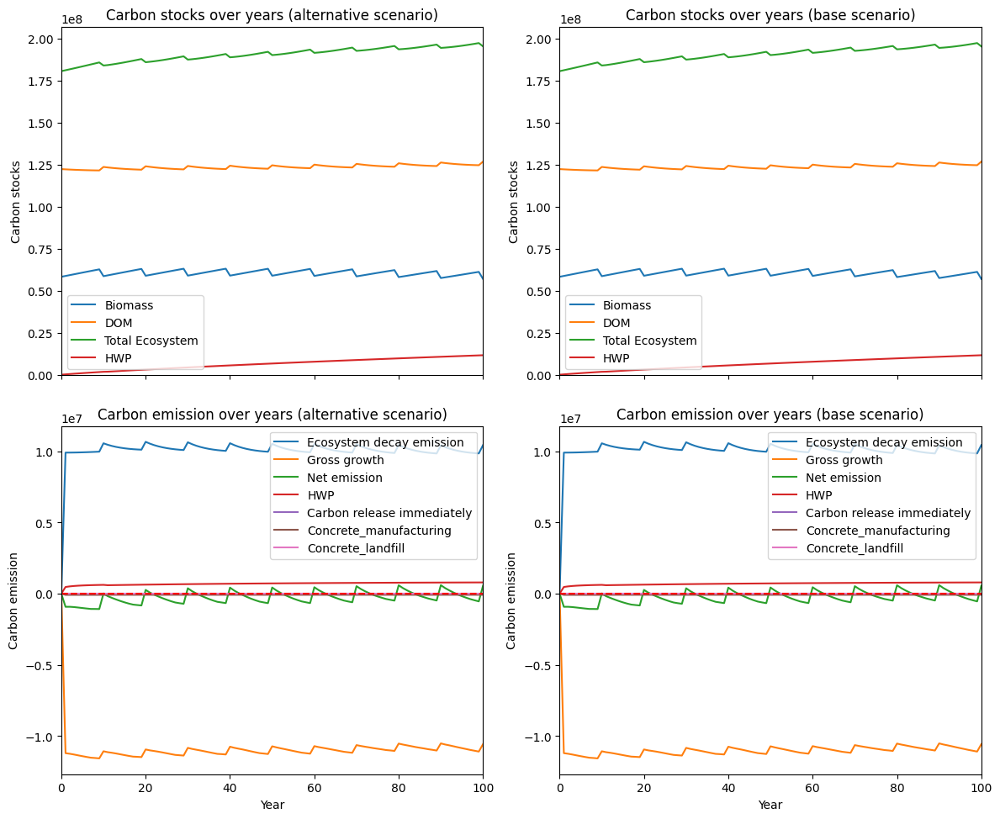

---------------------------------------------------------------------------------------
Net emission difference 0.0
Net emission base scenario -14412111.801467825
Net emission alternative scenario -14412111.801467825
dollar_per_ton is:  inf
Comparison of Old Growth Areas (Alternative - Base)
           0   10  Difference
Hem      0.0  0.0         0.0
DougFir  0.0  0.0         0.0
Bal      0.0  0.0         0.0
Spruce   0.0  0.0         0.0
Aspen    0.0  0.0         0.0
Pine     0.0  0.0         0.0

Overall, the old growth area has **increased** by 0.00 hectares in the alternative scenario compared to the base scenario.


/media/data/project/eghasemi/nbds_mining/util_opt.py:1211: RuntimeWarning: divide by zero encountered in scalar divide
  dollar_per_ton = abs(budget_input / dif_scenario.iloc[:25]['Net emission'].sum())


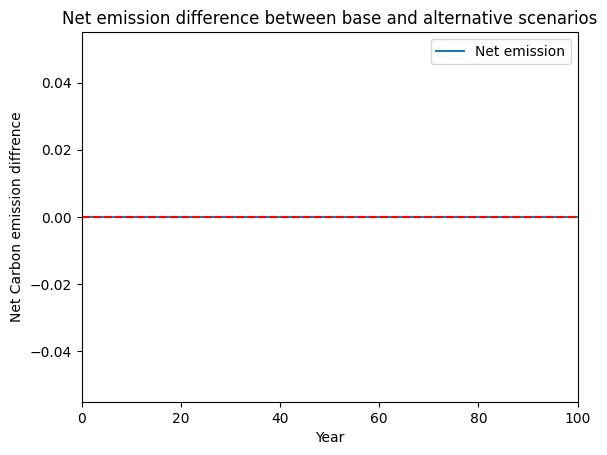

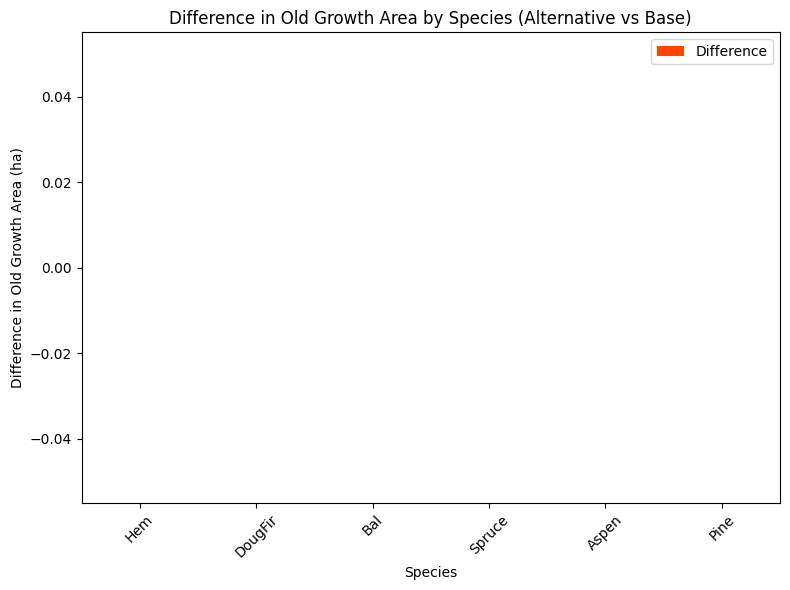

<Figure size 640x480 with 0 Axes>

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_kpi_age_difference.pdf


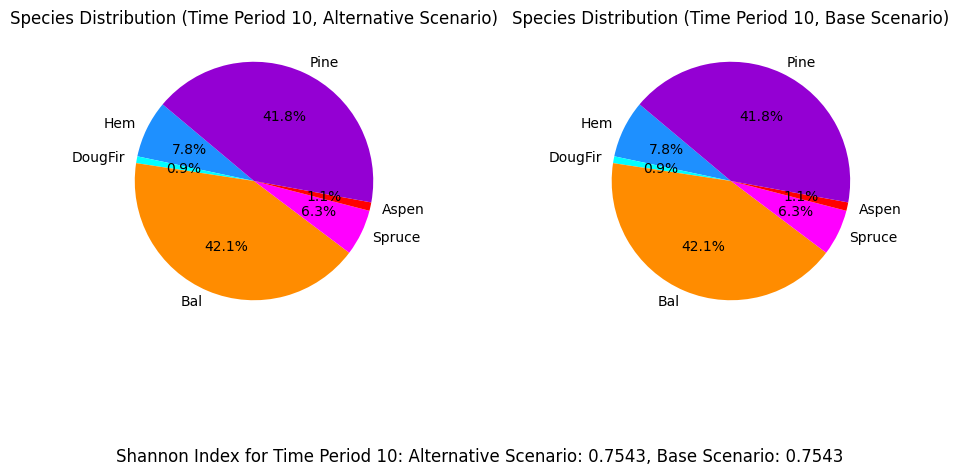

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_ha_kpi_species_difference_pie.pdf
---------------------------------------------------------------------------------------
Running for equitysilver_min_ha_eqtslvr_AAC_90%...
running the scenario for the Equity Silver mining site (90%_AAC),
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0x4d318b7a
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [1e-01, 3e+03]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8907 columns
Presolve time: 0.35s
Presolved: 8375 r

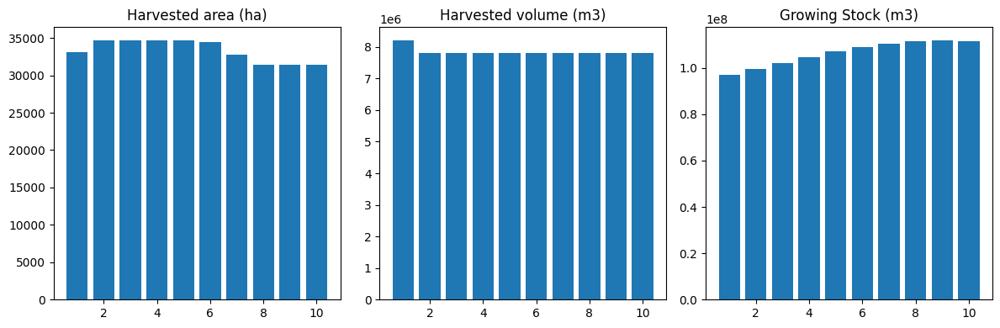

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_eqtslvr_AAC_90%_scheduling.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  82941
The economic indicator (the provincial government revenues) is:  2828481
------------------------------------------------
Saved cbm_output_1 and cbm_output_2 as pickle files.


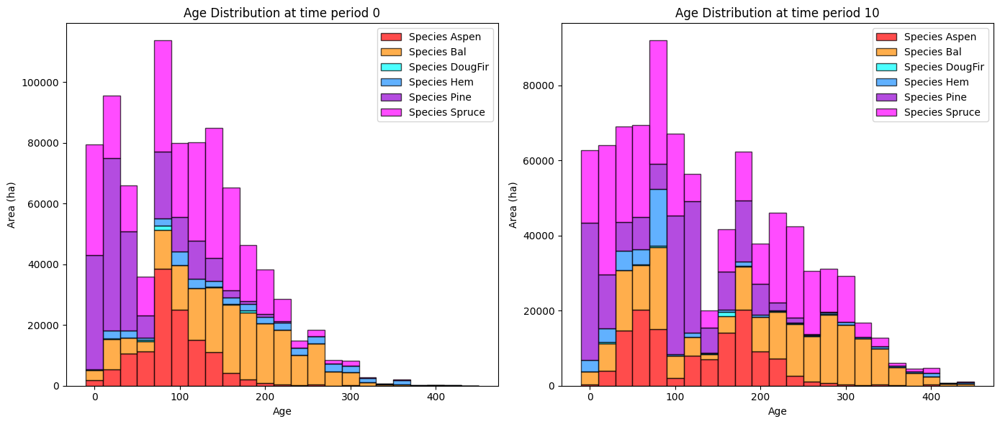

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_eqtslvr_AAC_90%_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0             10    Difference
Hem      19152.127229    6315.395648 -12836.731581
DougFir    947.047810    1856.189930    909.142120
Bal      59315.970469  104994.913434  45678.942965
Spruce   36410.744598  115326.314941  78915.570343
Aspen    29632.731169   66193.584782  36560.853613
Pine      7432.733686   39389.265716  31956.532030

Overall diversity has **increased** by 181184.31 hectares from time period 0 to time period 10.


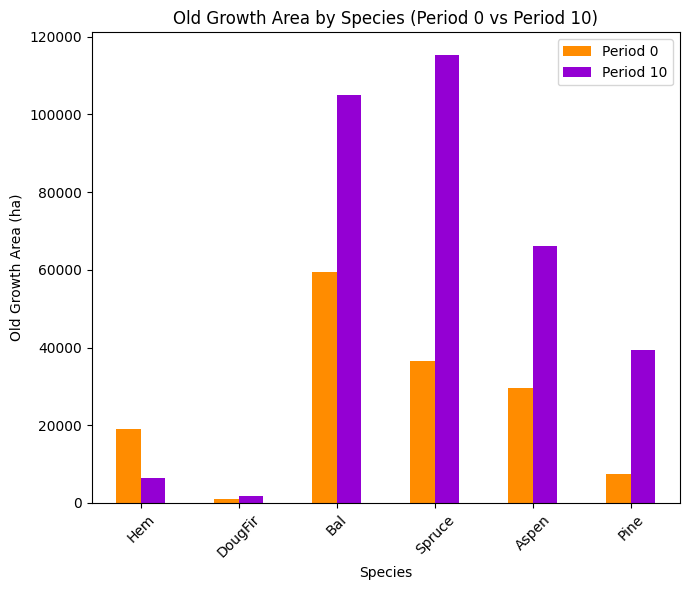

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_eqtslvr_AAC_90%_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7534

Diversity has **decreased** by 0.58% from time 0 to time 10.


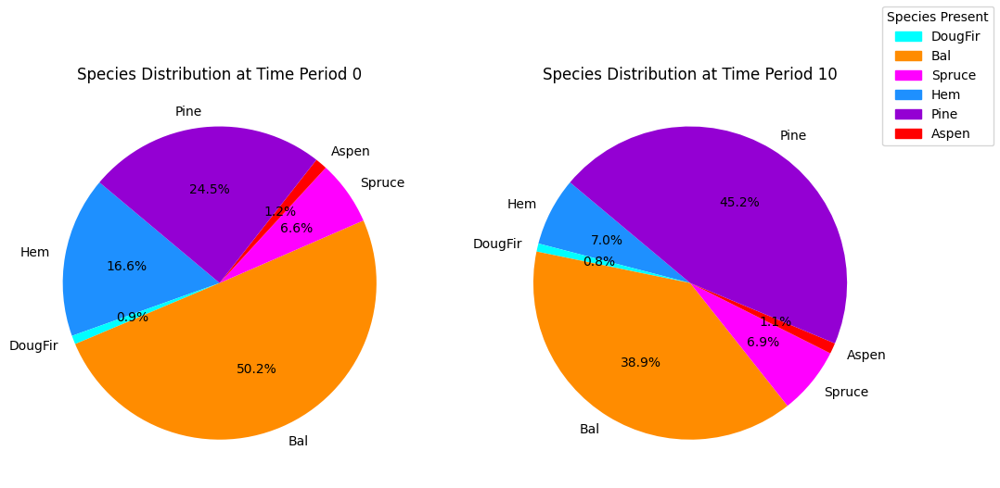

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_ha_eqtslvr_AAC_90%_species_pie.pdf
running business as usual scenario for the Equity Silver mining site
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0x1149349b
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [1e-01, 3e+03]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8907 columns
Presolve time: 0.29s
Presolved: 8375 rows, 74352 columns, 536195 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Or

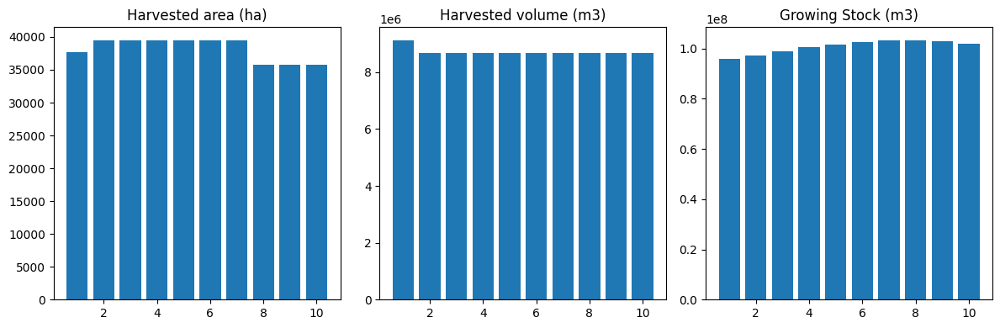

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_scheduling.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  92157
The economic indicator (the provincial government revenues) is:  3142756
------------------------------------------------
Saved cbm_output_3 and cbm_output_4 as pickle files.


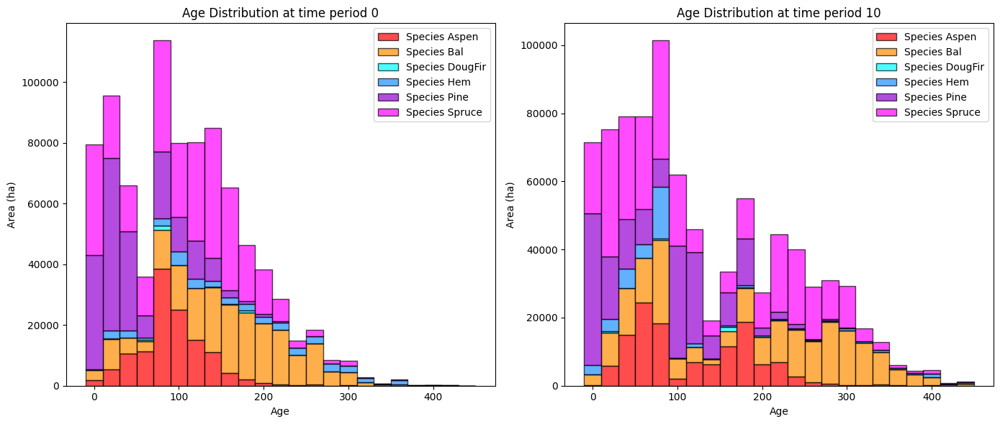

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0             10    Difference
Hem      19152.127229    6181.406415 -12970.720813
DougFir    947.047810    1826.436329    879.388519
Bal      59315.970469  103190.283054  43874.312585
Spruce   36410.744598  106090.302348  69679.557750
Aspen    29632.731169   57543.448439  27910.717270
Pine      7432.733686   28846.602045  21413.868359

Overall diversity has **increased** by 150787.12 hectares from time period 0 to time period 10.


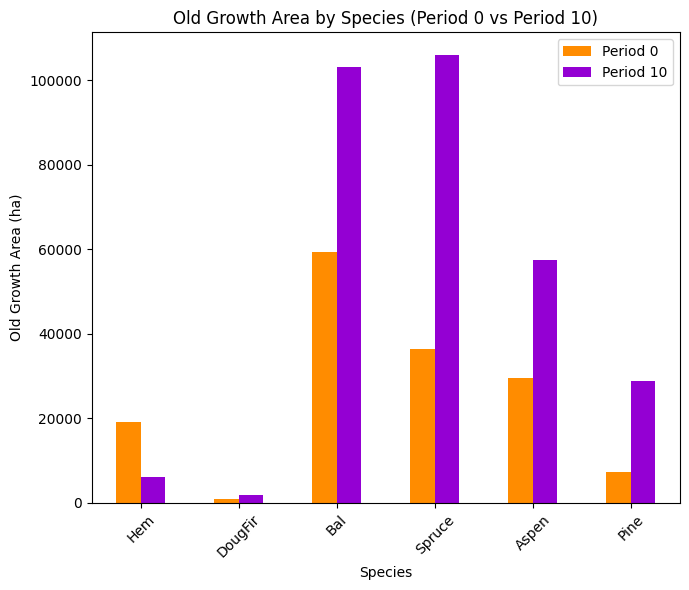

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7543

Diversity has **decreased** by 0.49% from time 0 to time 10.


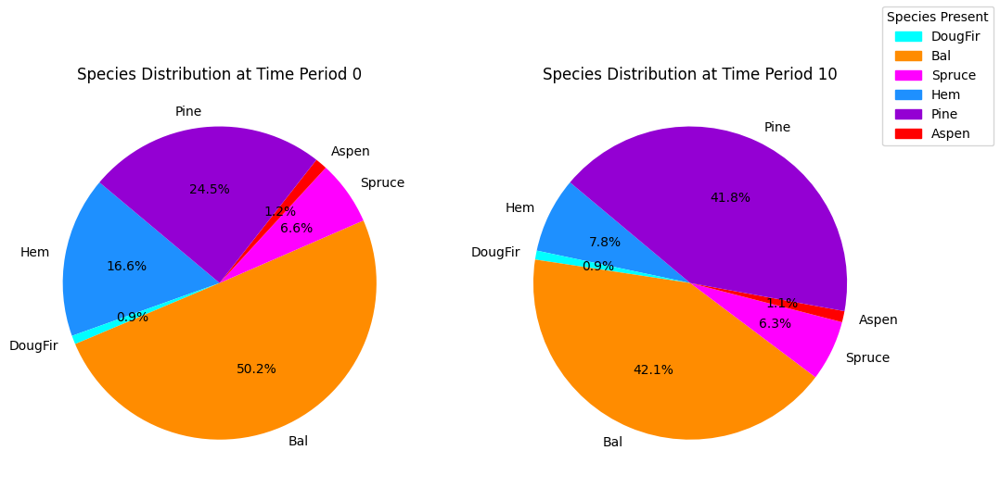

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_species_pie.pdf


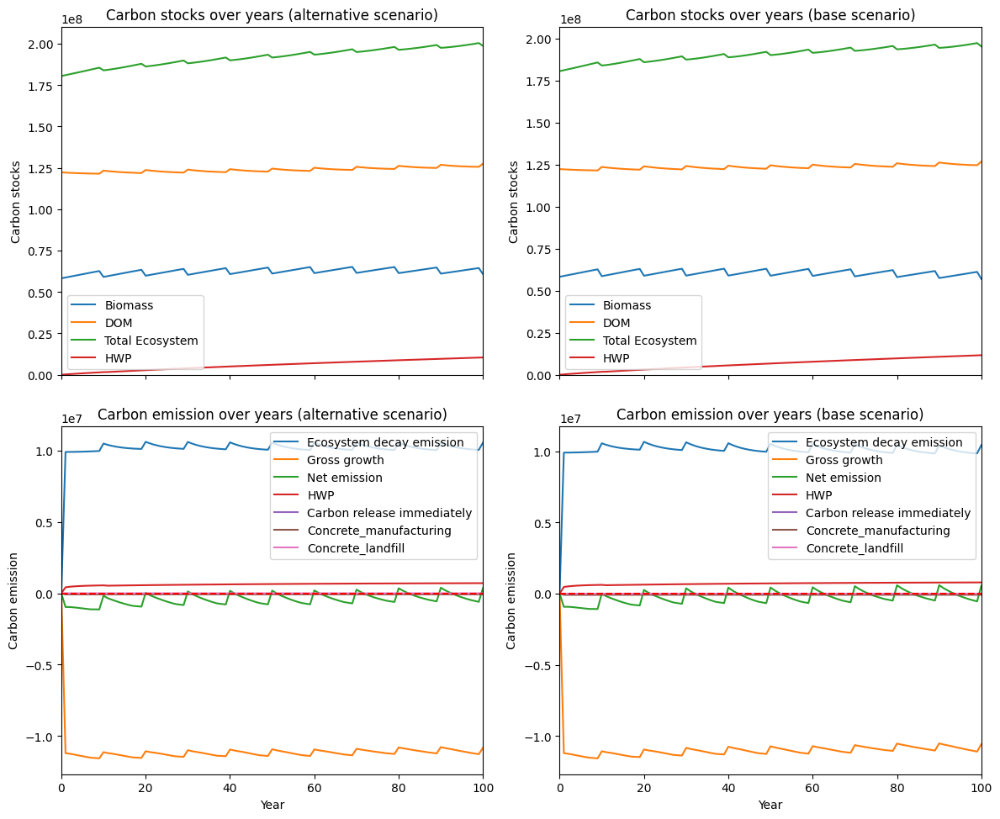

---------------------------------------------------------------------------------------
Net emission difference -2728703.8352501513
Net emission base scenario -17140815.636717975
Net emission alternative scenario -14412111.801467825
dollar_per_ton is:  3.6647436305901846
Comparison of Old Growth Areas (Alternative - Base)
           0            10    Difference
Hem      0.0    133.989233    133.989233
DougFir  0.0     29.753601     29.753601
Bal      0.0   1804.630379   1804.630379
Spruce   0.0   9236.012593   9236.012593
Aspen    0.0   8650.136343   8650.136343
Pine     0.0  10542.663671  10542.663671

Overall, the old growth area has **increased** by 30397.19 hectares in the alternative scenario compared to the base scenario.


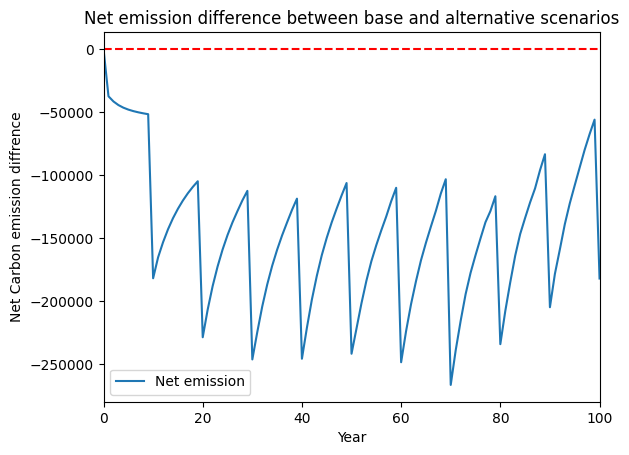

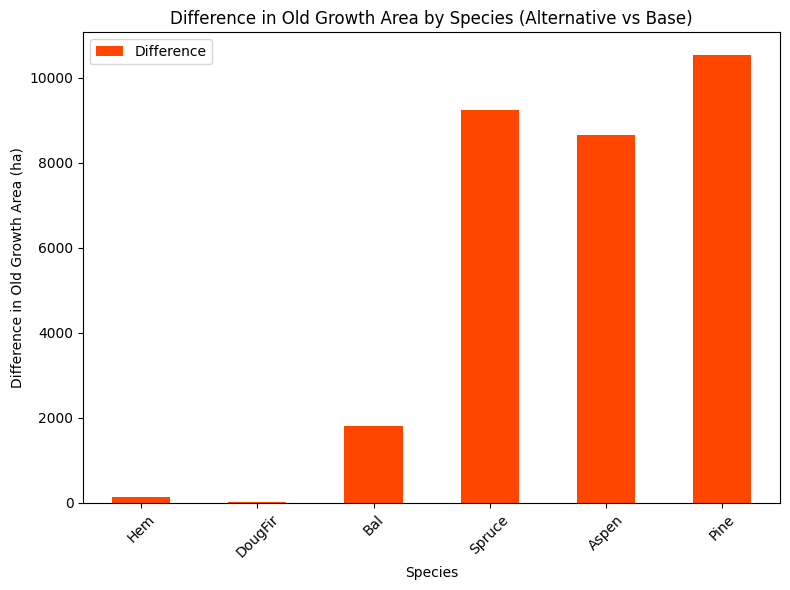

<Figure size 640x480 with 0 Axes>

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_kpi_age_difference.pdf


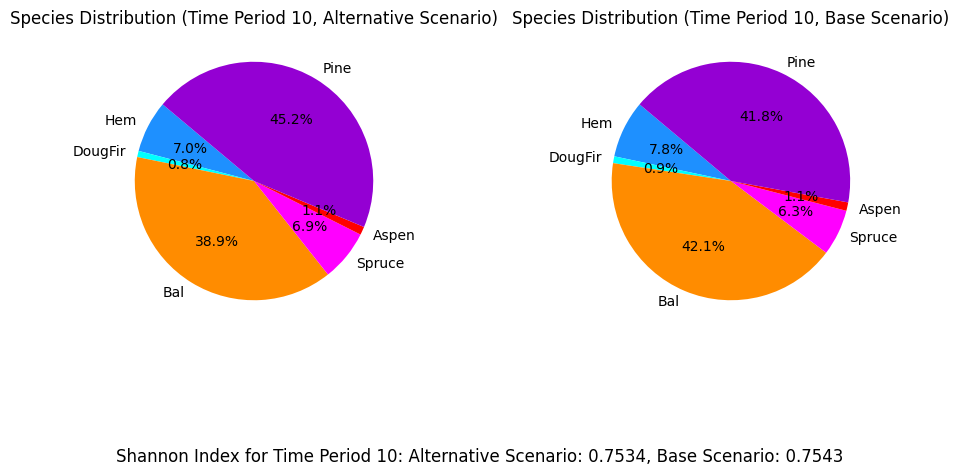

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_ha_kpi_species_difference_pie.pdf
---------------------------------------------------------------------------------------
Running for equitysilver_min_ha_eqtslvr_AAC_80%...
running the scenario for the Equity Silver mining site (80%_AAC),
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0x215d1912
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [1e-01, 3e+03]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8907 columns
Presolve time: 0.31s
Presolved: 8375 r

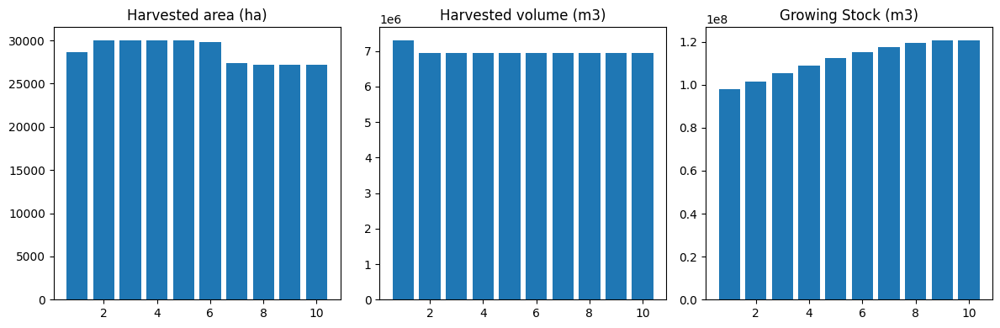

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_eqtslvr_AAC_80%_scheduling.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  73725
The economic indicator (the provincial government revenues) is:  2514205
------------------------------------------------
Saved cbm_output_1 and cbm_output_2 as pickle files.


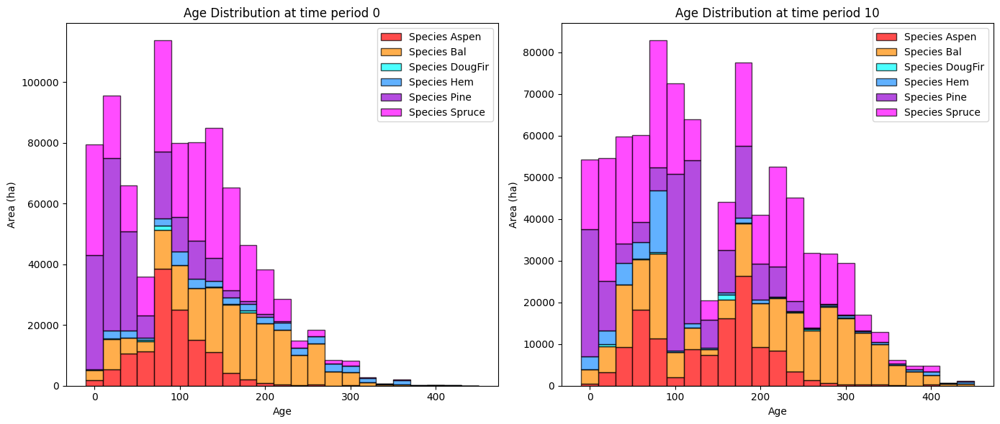

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_eqtslvr_AAC_80%_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0             10    Difference
Hem      19152.127229    6472.196091 -12679.931138
DougFir    947.047810    1873.331440    926.283630
Bal      59315.970469  107170.785202  47854.814734
Spruce   36410.744598  123251.756637  86841.012039
Aspen    29632.731169   77638.313359  48005.582190
Pine      7432.733686   48243.989153  40811.255467

Overall diversity has **increased** by 211759.02 hectares from time period 0 to time period 10.


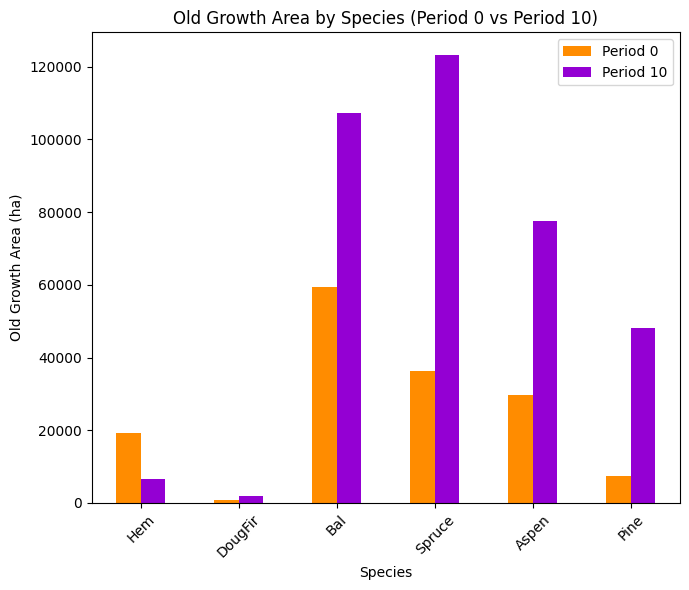

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_eqtslvr_AAC_80%_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7491

Diversity has **decreased** by 1.01% from time 0 to time 10.


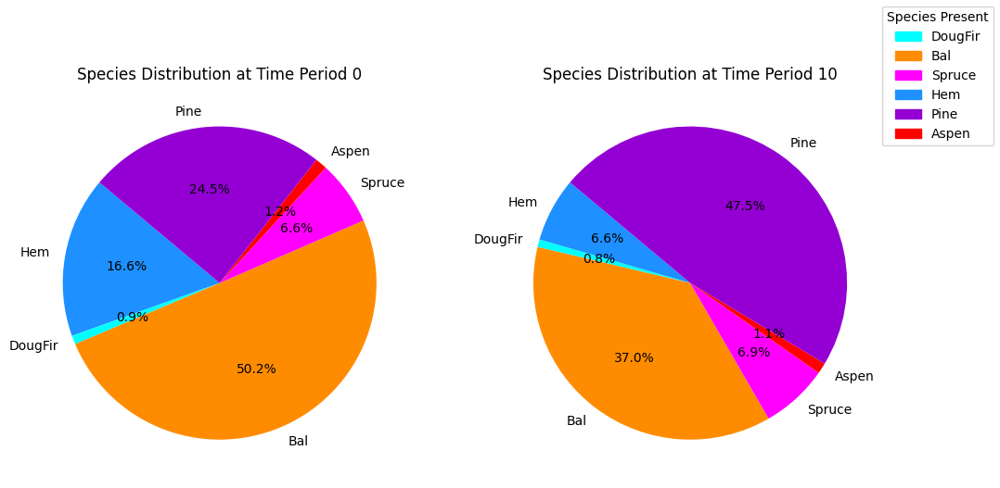

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_ha_eqtslvr_AAC_80%_species_pie.pdf
running business as usual scenario for the Equity Silver mining site
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0x1149349b
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [1e-01, 3e+03]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8907 columns
Presolve time: 0.33s
Presolved: 8375 rows, 74352 columns, 536195 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Or

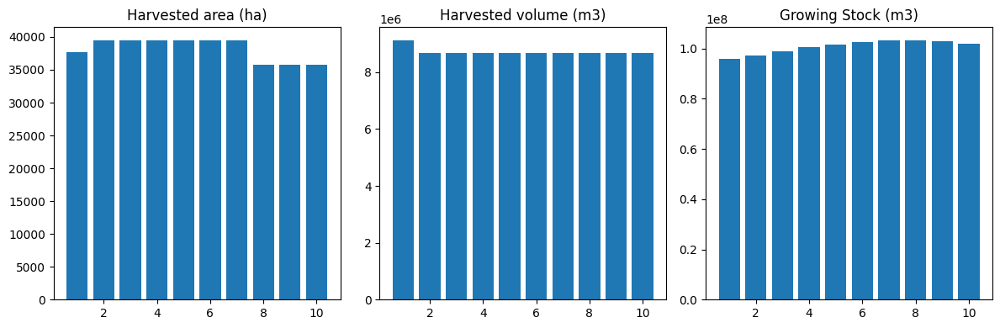

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_scheduling.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  92157
The economic indicator (the provincial government revenues) is:  3142756
------------------------------------------------
Saved cbm_output_3 and cbm_output_4 as pickle files.


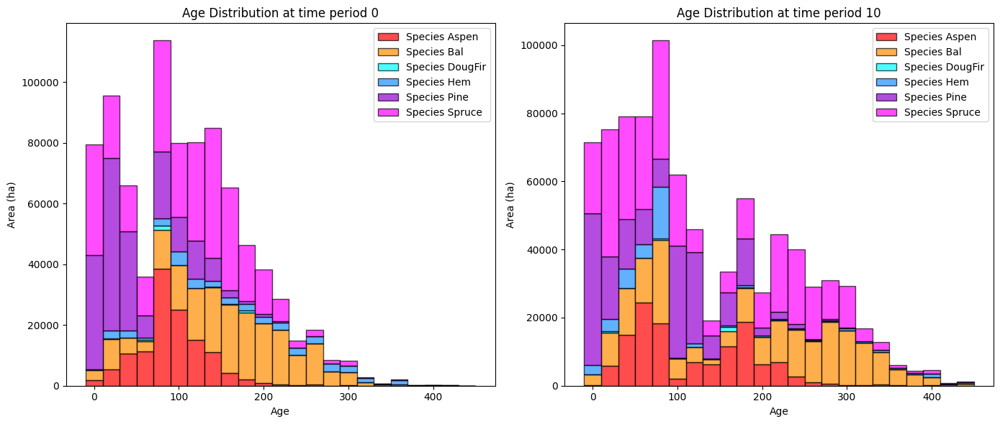

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0             10    Difference
Hem      19152.127229    6181.406415 -12970.720813
DougFir    947.047810    1826.436329    879.388519
Bal      59315.970469  103190.283054  43874.312585
Spruce   36410.744598  106090.302348  69679.557750
Aspen    29632.731169   57543.448439  27910.717270
Pine      7432.733686   28846.602045  21413.868359

Overall diversity has **increased** by 150787.12 hectares from time period 0 to time period 10.


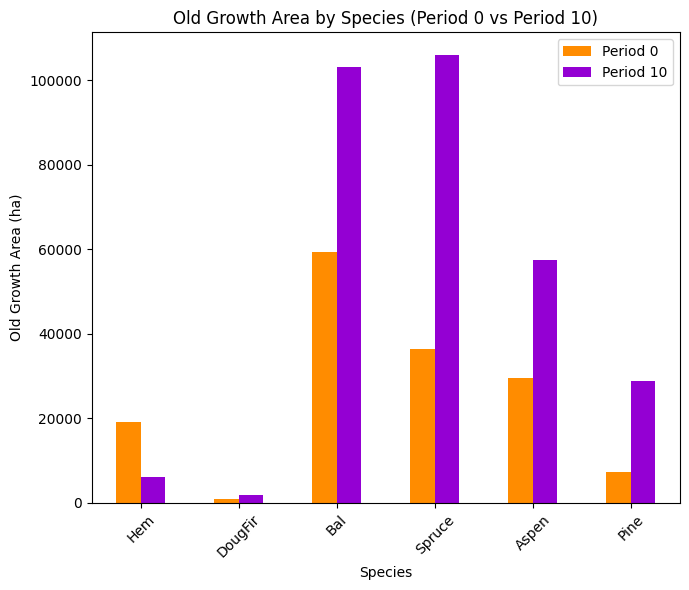

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7543

Diversity has **decreased** by 0.49% from time 0 to time 10.


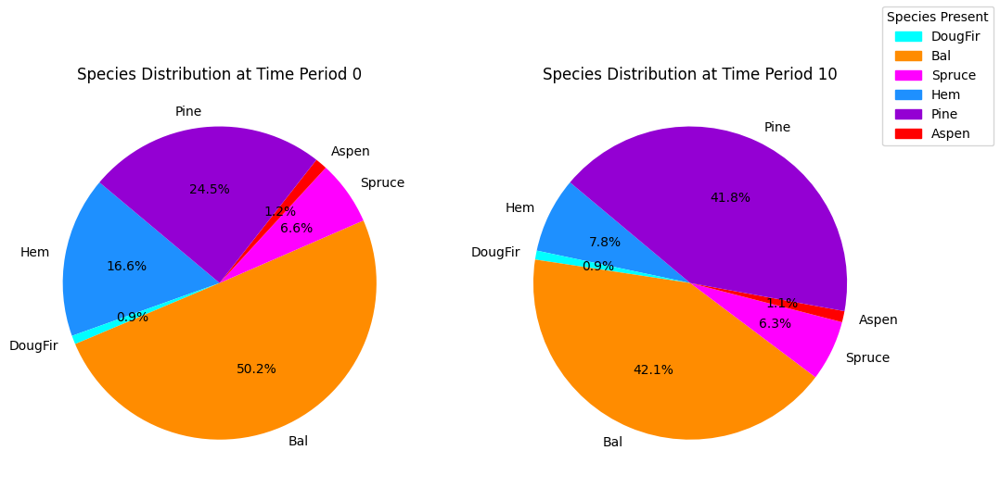

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_species_pie.pdf


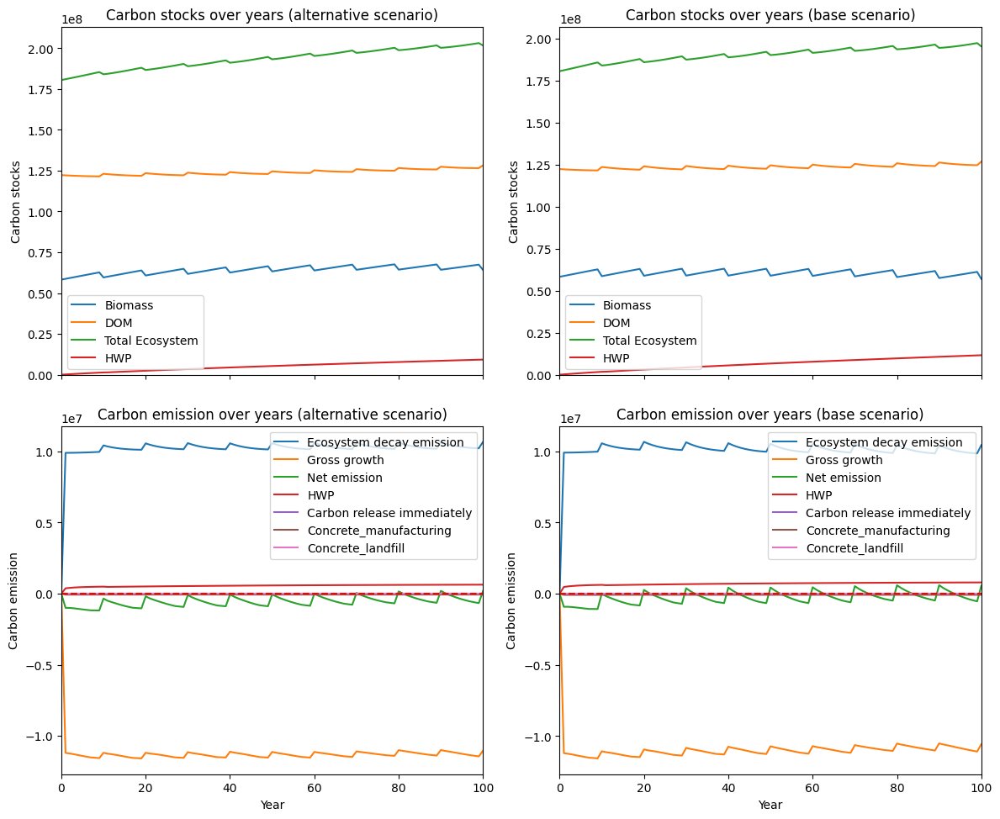

---------------------------------------------------------------------------------------
Net emission difference -5395390.340453701
Net emission base scenario -19807502.141921528
Net emission alternative scenario -14412111.801467825
dollar_per_ton is:  1.853434018484582
Comparison of Old Growth Areas (Alternative - Base)
           0            10    Difference
Hem      0.0    290.789676    290.789676
DougFir  0.0     46.895111     46.895111
Bal      0.0   3980.502148   3980.502148
Spruce   0.0  17161.454289  17161.454289
Aspen    0.0  20094.864920  20094.864920
Pine     0.0  19397.387108  19397.387108

Overall, the old growth area has **increased** by 60971.89 hectares in the alternative scenario compared to the base scenario.


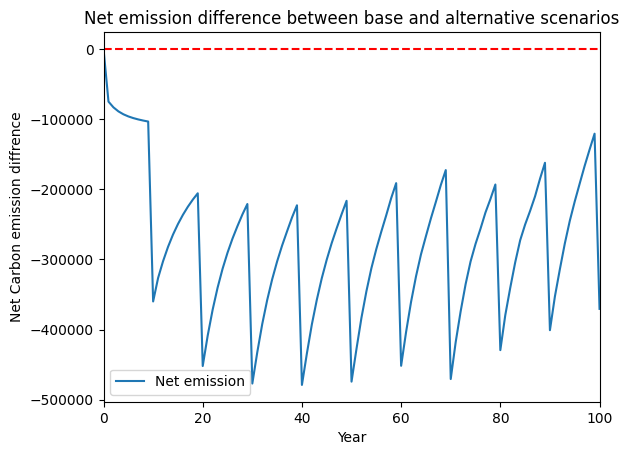

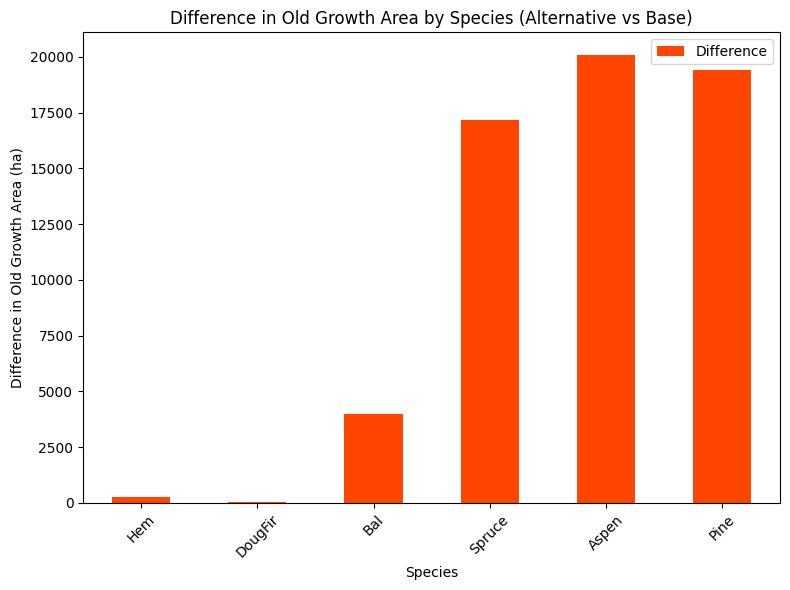

<Figure size 640x480 with 0 Axes>

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_kpi_age_difference.pdf


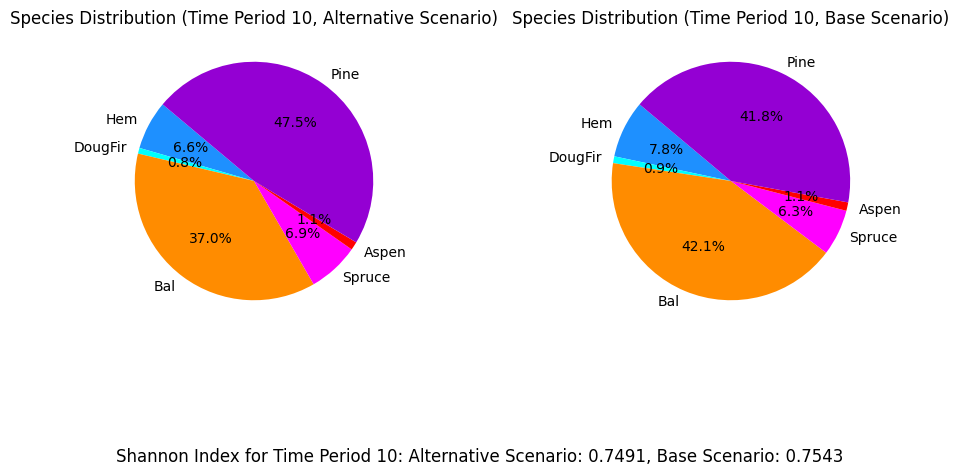

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_ha_kpi_species_difference_pie.pdf
---------------------------------------------------------------------------------------
Running for equitysilver_min_ha_eqtslvr_AAC_70%...
running the scenario for the Equity Silver mining site (70%_AAC),
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0x3b42711f
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [1e-01, 3e+03]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8907 columns
Presolve time: 0.30s
Presolved: 8375 r

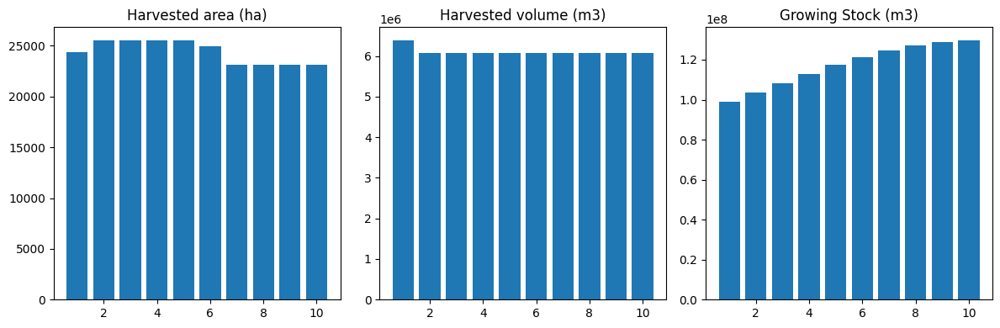

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_eqtslvr_AAC_70%_scheduling.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  64510
The economic indicator (the provincial government revenues) is:  2199929
------------------------------------------------
Saved cbm_output_1 and cbm_output_2 as pickle files.


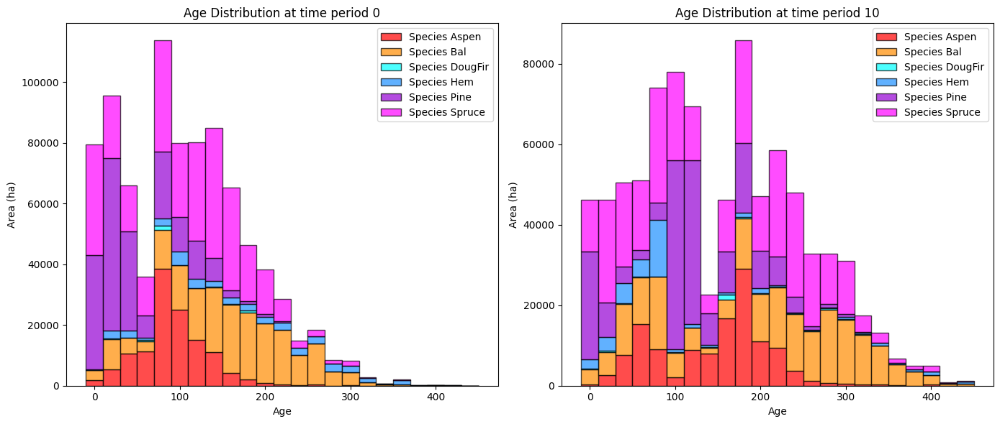

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_eqtslvr_AAC_70%_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0             10    Difference
Hem      19152.127229    6888.735092 -12263.392137
DougFir    947.047810    2041.396629   1094.348819
Bal      59315.970469  111684.294706  52368.324238
Spruce   36410.744598  134978.756695  98568.012097
Aspen    29632.731169   84936.829575  55304.098406
Pine      7432.733686   53154.742701  45722.009014

Overall diversity has **increased** by 240793.40 hectares from time period 0 to time period 10.


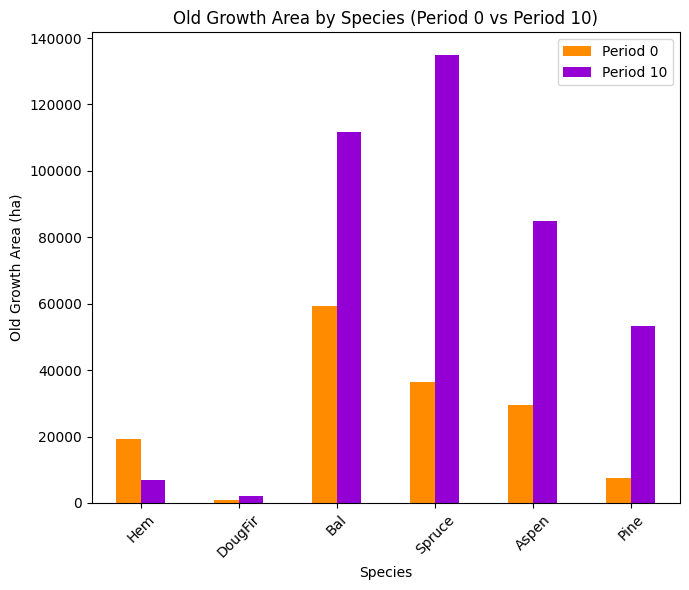

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_eqtslvr_AAC_70%_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7466

Diversity has **decreased** by 1.26% from time 0 to time 10.


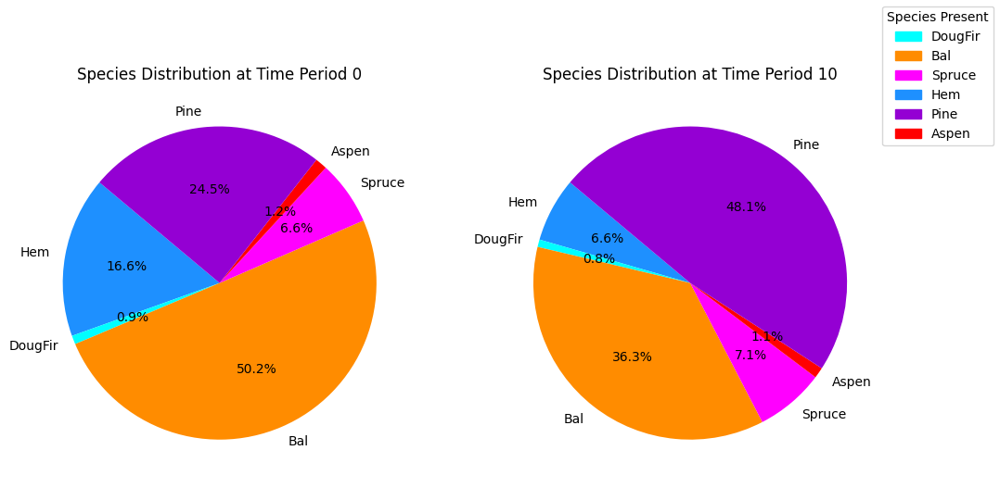

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_ha_eqtslvr_AAC_70%_species_pie.pdf
running business as usual scenario for the Equity Silver mining site
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0x1149349b
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [1e-01, 3e+03]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8907 columns
Presolve time: 0.29s
Presolved: 8375 rows, 74352 columns, 536195 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Or

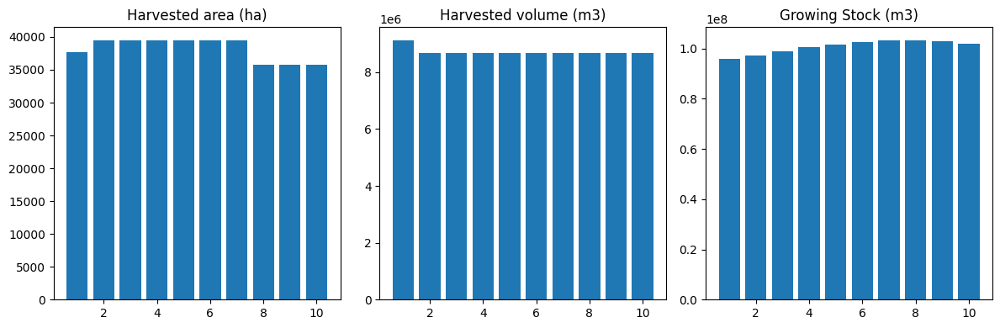

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_scheduling.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  92157
The economic indicator (the provincial government revenues) is:  3142756
------------------------------------------------
Saved cbm_output_3 and cbm_output_4 as pickle files.


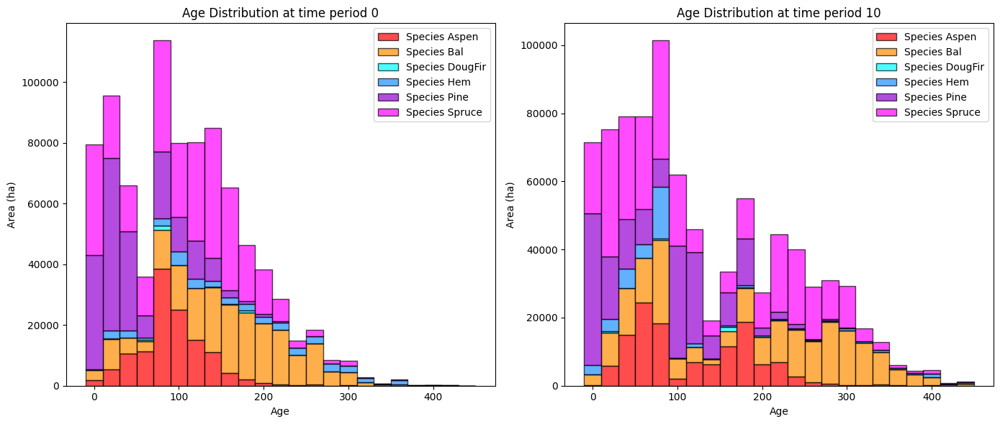

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0             10    Difference
Hem      19152.127229    6181.406415 -12970.720813
DougFir    947.047810    1826.436329    879.388519
Bal      59315.970469  103190.283054  43874.312585
Spruce   36410.744598  106090.302348  69679.557750
Aspen    29632.731169   57543.448439  27910.717270
Pine      7432.733686   28846.602045  21413.868359

Overall diversity has **increased** by 150787.12 hectares from time period 0 to time period 10.


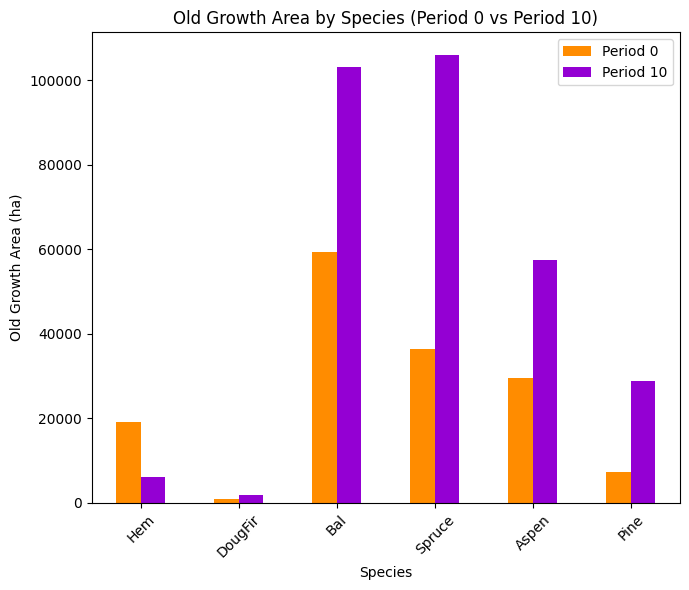

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7543

Diversity has **decreased** by 0.49% from time 0 to time 10.


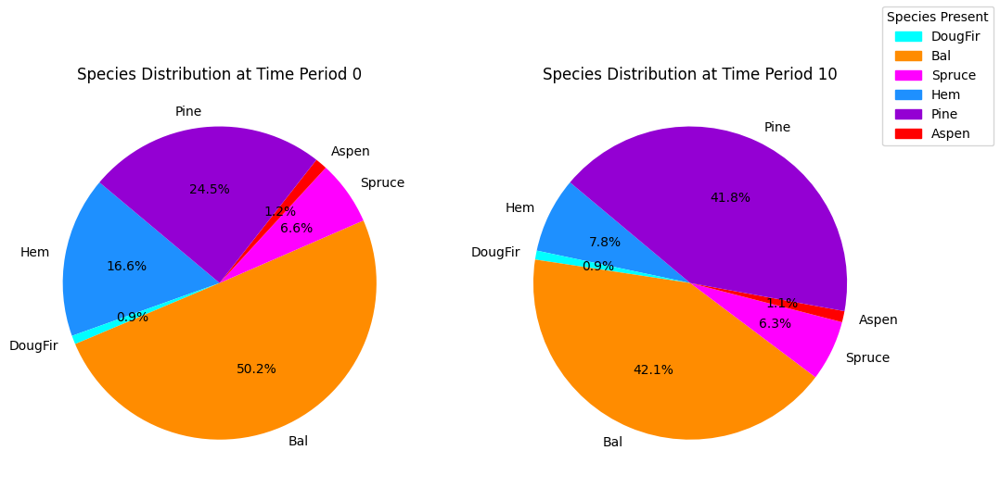

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_species_pie.pdf


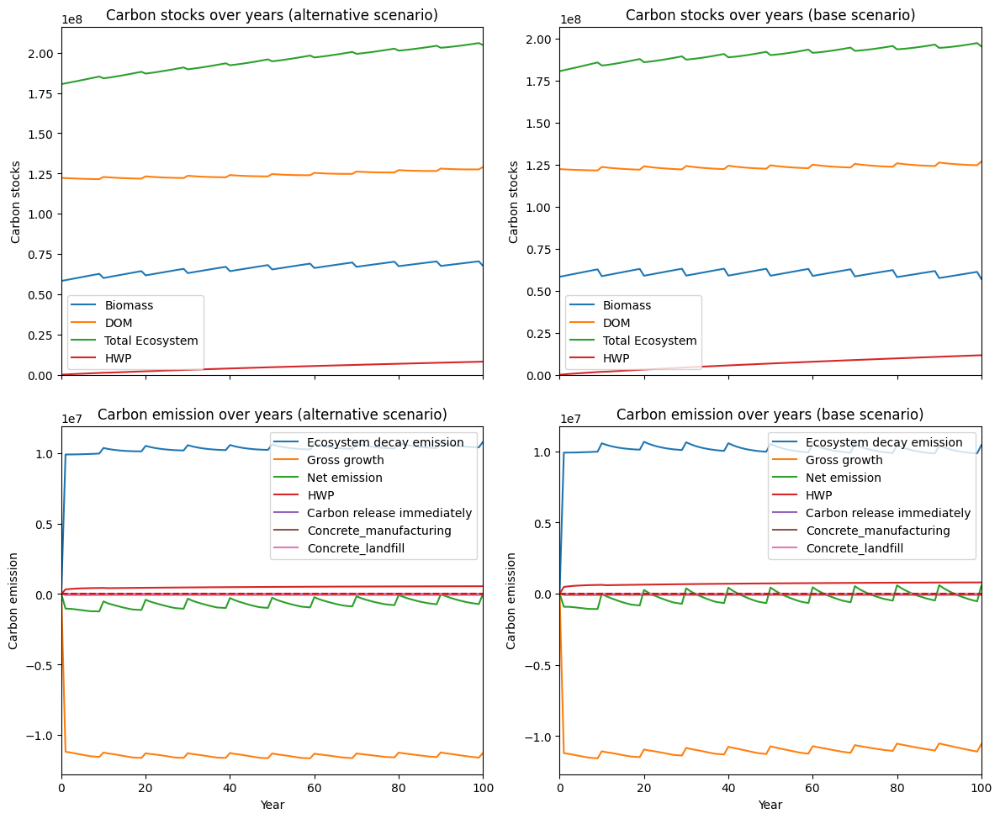

---------------------------------------------------------------------------------------
Net emission difference -8001604.346449542
Net emission base scenario -22413716.14791737
Net emission alternative scenario -14412111.801467825
dollar_per_ton is:  1.2497493711292014
Comparison of Old Growth Areas (Alternative - Base)
           0            10    Difference
Hem      0.0    707.328676    707.328676
DougFir  0.0    214.960300    214.960300
Bal      0.0   8494.011652   8494.011652
Spruce   0.0  28888.454348  28888.454348
Aspen    0.0  27393.381136  27393.381136
Pine     0.0  24308.140655  24308.140655

Overall, the old growth area has **increased** by 90006.28 hectares in the alternative scenario compared to the base scenario.


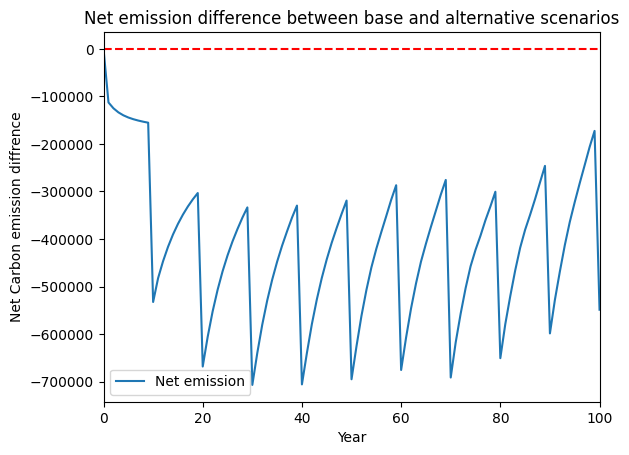

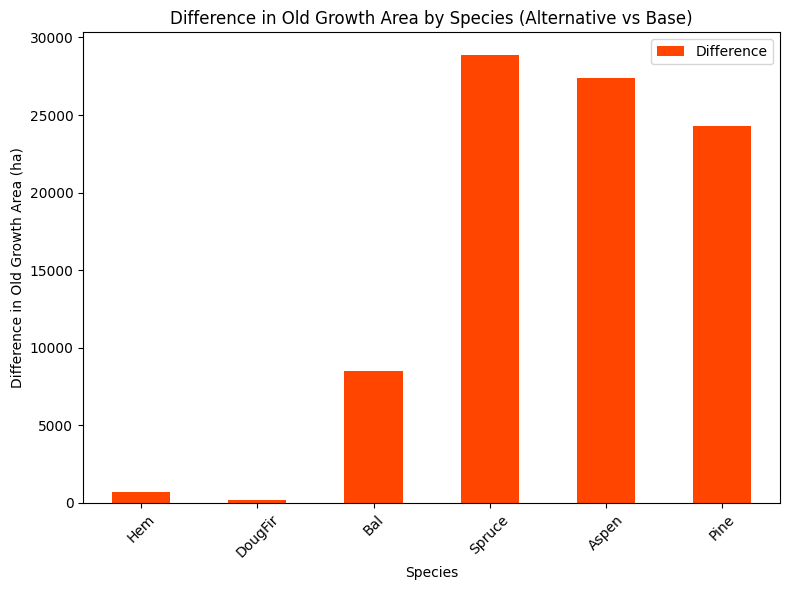

<Figure size 640x480 with 0 Axes>

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_kpi_age_difference.pdf


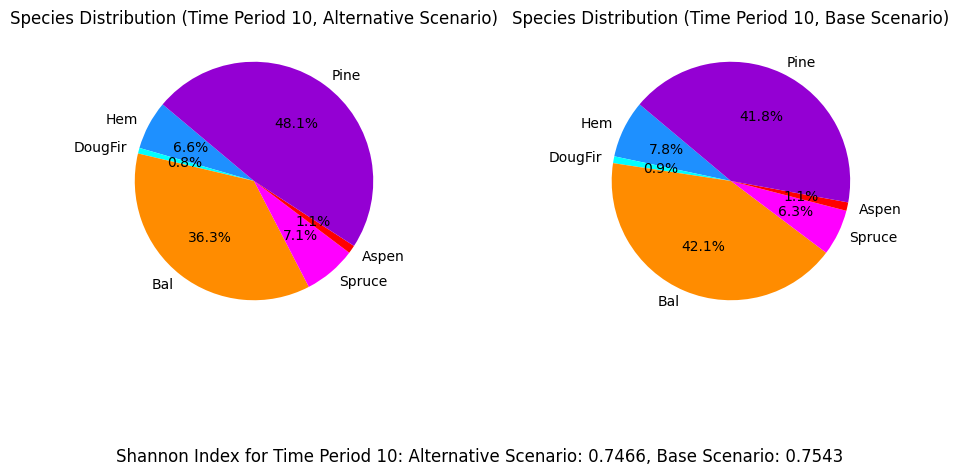

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_ha_kpi_species_difference_pie.pdf
---------------------------------------------------------------------------------------
Running for equitysilver_min_ha_eqtslvr_AAC_60%...
running the scenario for the Equity Silver mining site (60%_AAC),
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0x8f1b1a05
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [1e-01, 3e+03]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8907 columns
Presolve time: 0.29s
Presolved: 8375 r

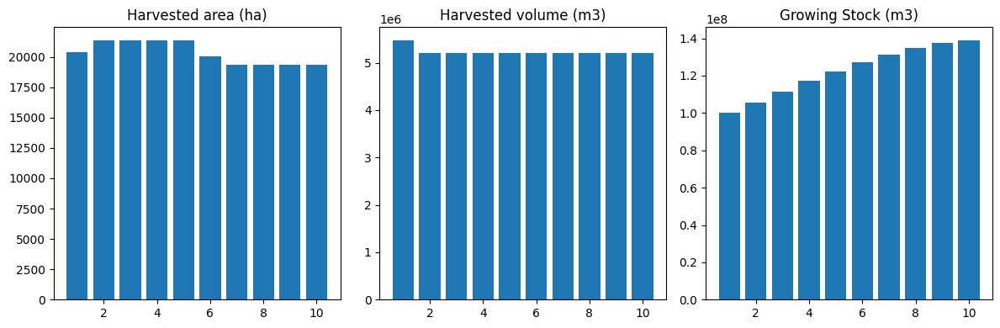

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_eqtslvr_AAC_60%_scheduling.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  55294
The economic indicator (the provincial government revenues) is:  1885654
------------------------------------------------
Saved cbm_output_1 and cbm_output_2 as pickle files.


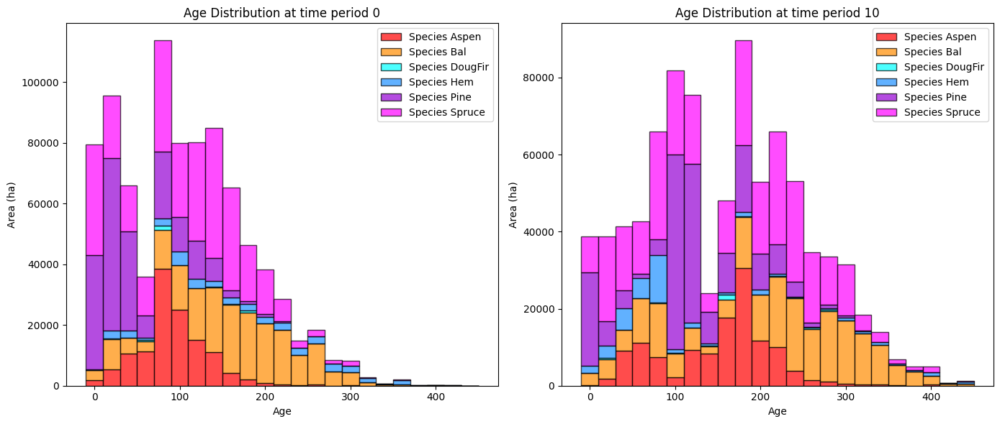

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_eqtslvr_AAC_60%_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0             10     Difference
Hem      19152.127229    7254.987583  -11897.139646
DougFir    947.047810    2329.596842    1382.549032
Bal      59315.970469  123495.237323   64179.266854
Spruce   36410.744598  145332.628768  108921.884170
Aspen    29632.731169   90080.634293   60447.903124
Pine      7432.733686   54573.074231   47140.340545

Overall diversity has **increased** by 270174.80 hectares from time period 0 to time period 10.


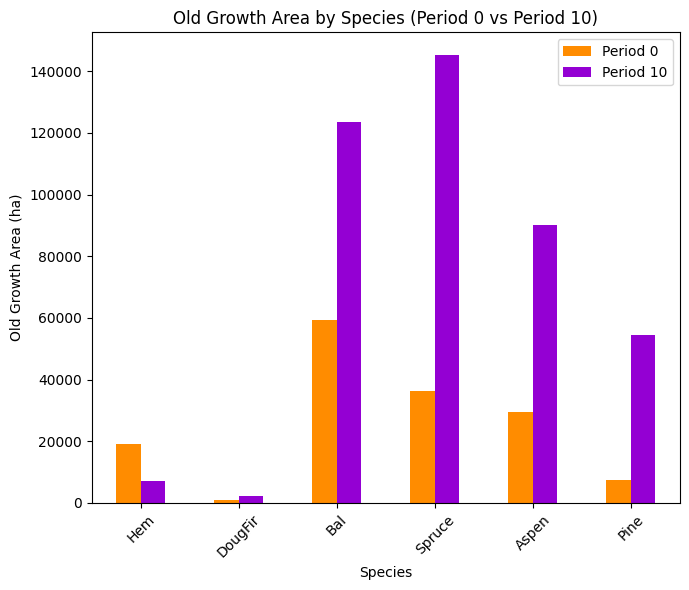

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_eqtslvr_AAC_60%_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7443

Diversity has **decreased** by 1.49% from time 0 to time 10.


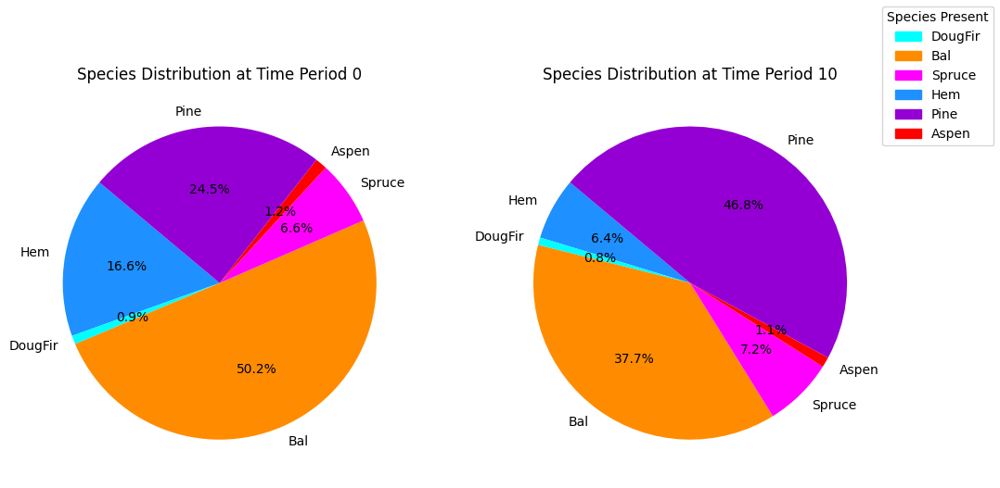

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_ha_eqtslvr_AAC_60%_species_pie.pdf
running business as usual scenario for the Equity Silver mining site
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0x1149349b
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [1e-01, 3e+03]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8907 columns
Presolve time: 0.29s
Presolved: 8375 rows, 74352 columns, 536195 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Or

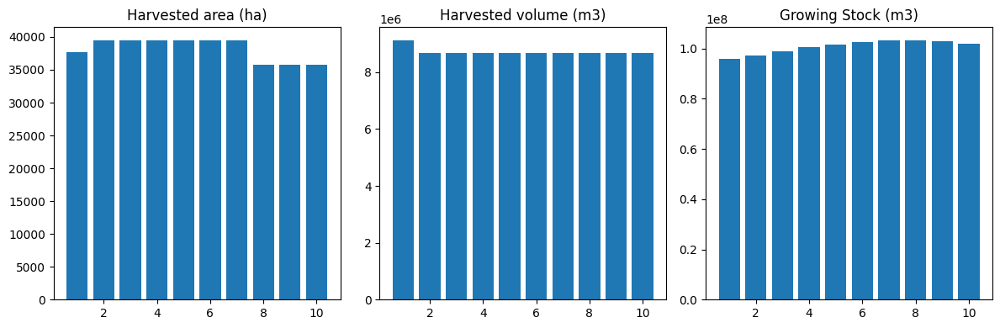

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_scheduling.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  92157
The economic indicator (the provincial government revenues) is:  3142756
------------------------------------------------
Saved cbm_output_3 and cbm_output_4 as pickle files.


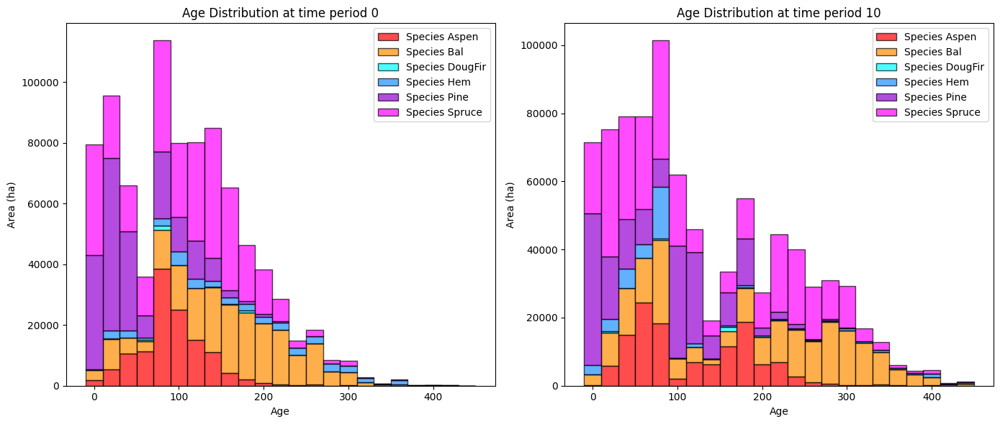

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0             10    Difference
Hem      19152.127229    6181.406415 -12970.720813
DougFir    947.047810    1826.436329    879.388519
Bal      59315.970469  103190.283054  43874.312585
Spruce   36410.744598  106090.302348  69679.557750
Aspen    29632.731169   57543.448439  27910.717270
Pine      7432.733686   28846.602045  21413.868359

Overall diversity has **increased** by 150787.12 hectares from time period 0 to time period 10.


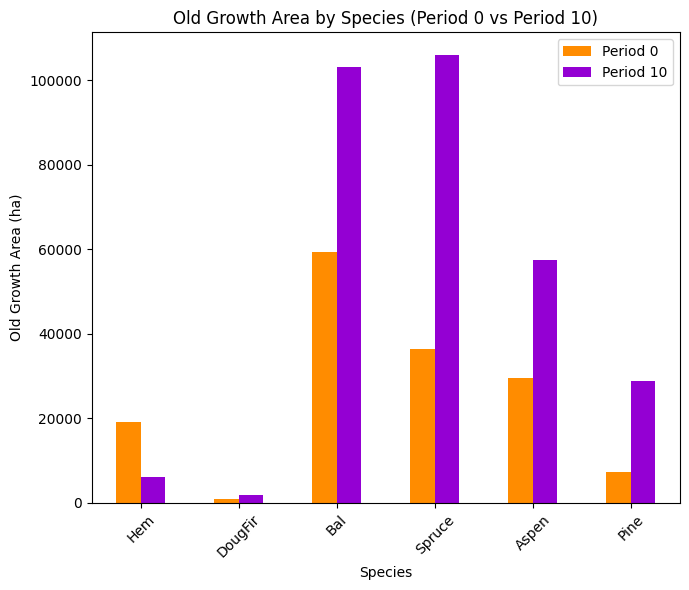

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7543

Diversity has **decreased** by 0.49% from time 0 to time 10.


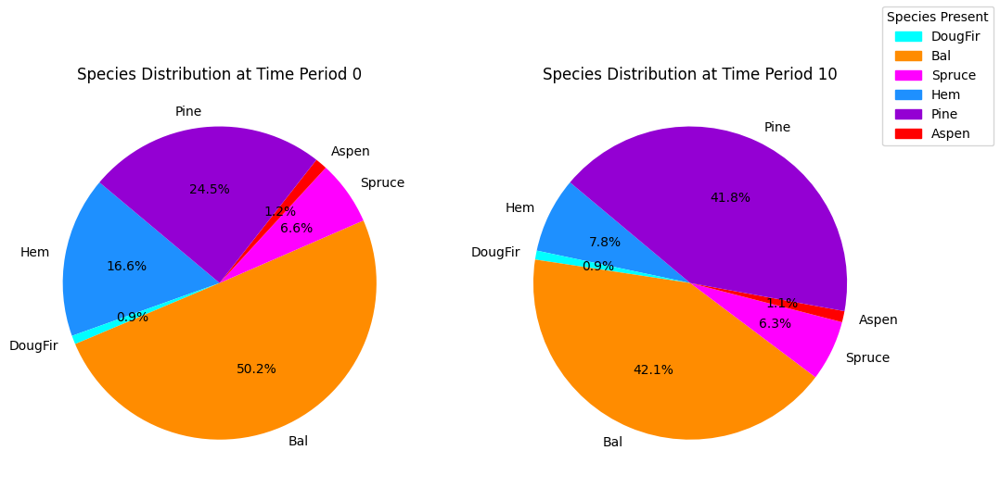

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_species_pie.pdf


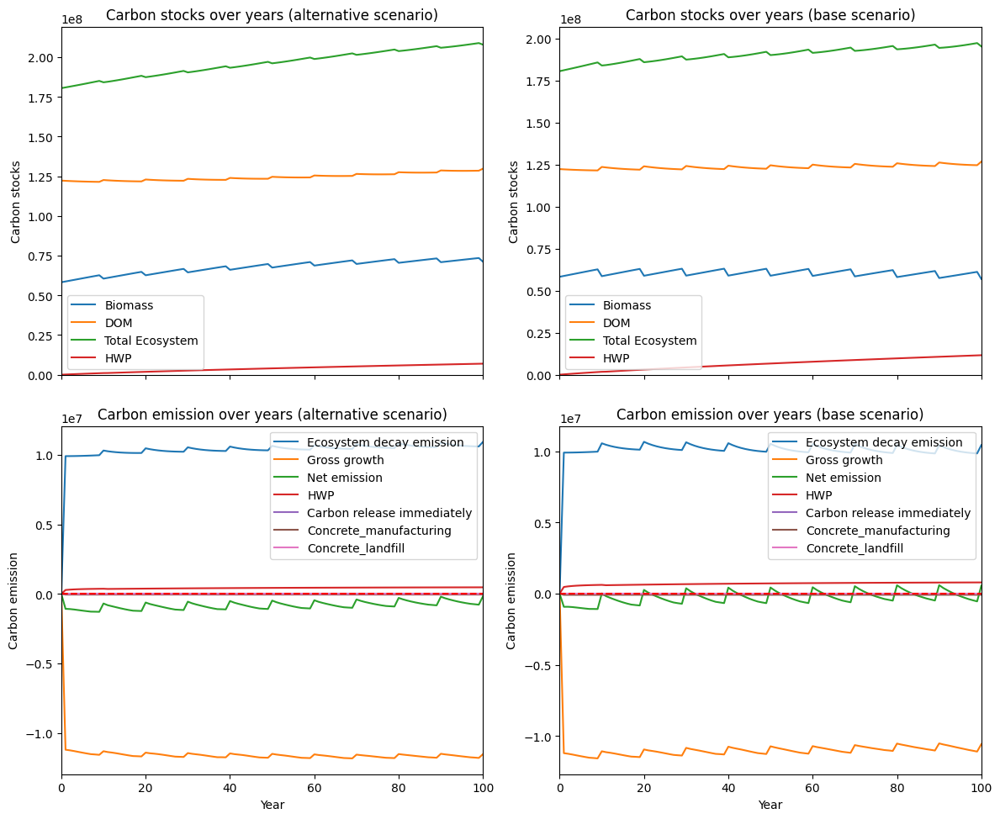

---------------------------------------------------------------------------------------
Net emission difference -10583120.02583053
Net emission base scenario -24995231.827298358
Net emission alternative scenario -14412111.801467825
dollar_per_ton is:  0.9449009342795611
Comparison of Old Growth Areas (Alternative - Base)
           0            10    Difference
Hem      0.0   1073.581167   1073.581167
DougFir  0.0    503.160513    503.160513
Bal      0.0  20304.954269  20304.954269
Spruce   0.0  39242.326420  39242.326420
Aspen    0.0  32537.185854  32537.185854
Pine     0.0  25726.472185  25726.472185

Overall, the old growth area has **increased** by 119387.68 hectares in the alternative scenario compared to the base scenario.


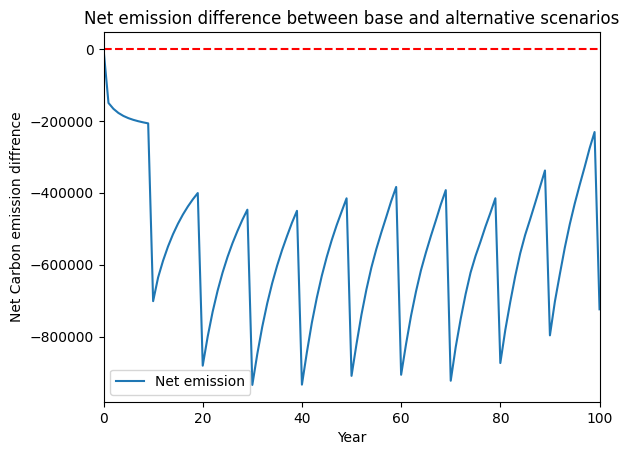

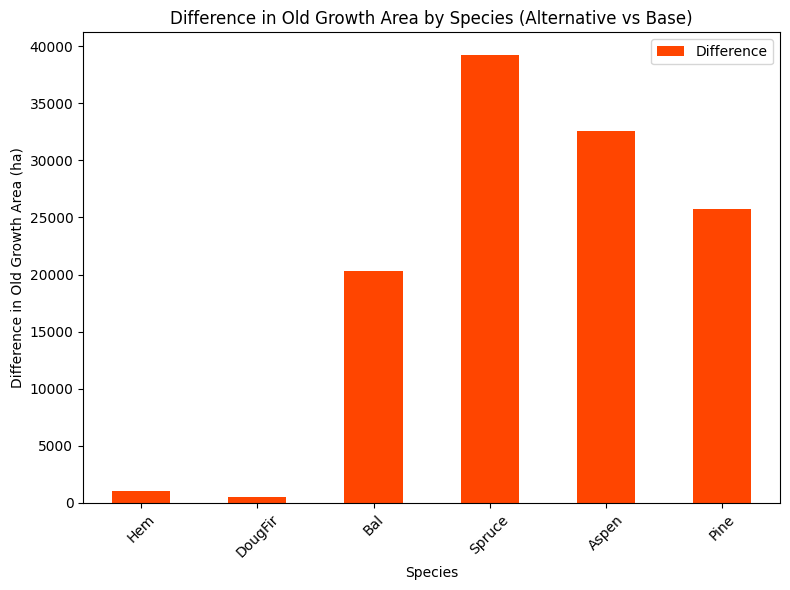

<Figure size 640x480 with 0 Axes>

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_kpi_age_difference.pdf


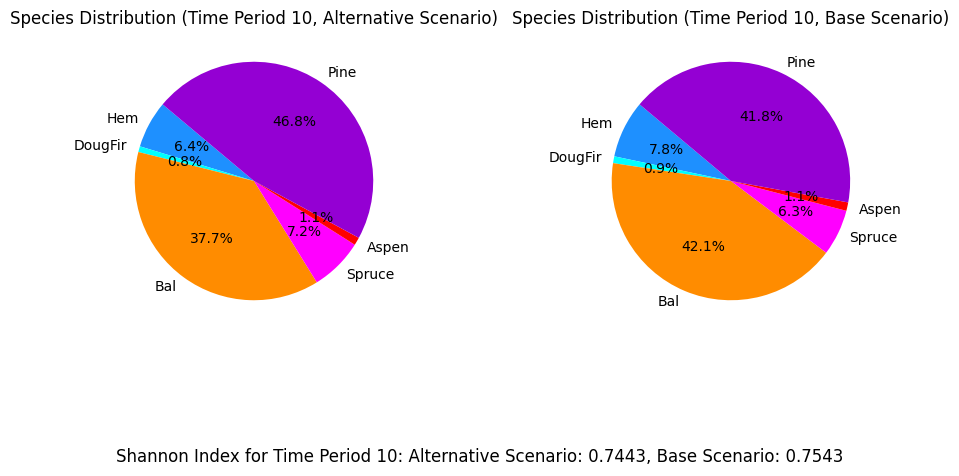

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_ha_kpi_species_difference_pie.pdf
---------------------------------------------------------------------------------------
Running for equitysilver_min_ha_eqtslvr_AAC_50%...
running the scenario for the Equity Silver mining site (50%_AAC),
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0x7ba2a5f1
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [1e-01, 3e+03]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8231 rows and 8227 columns
Presolve time: 0.05s

Solved in 0 iter

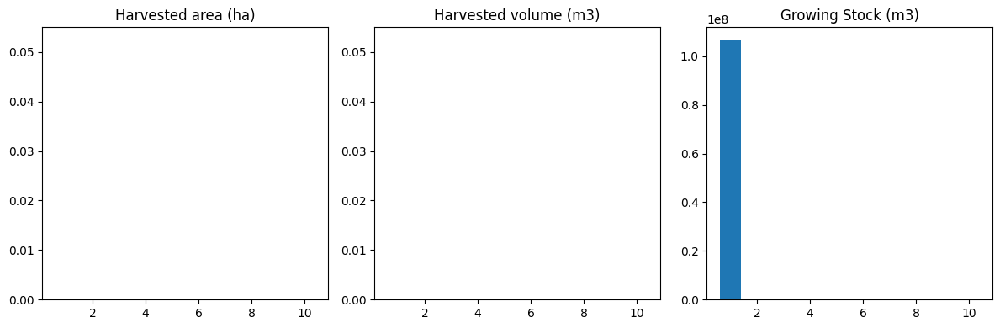

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_eqtslvr_AAC_50%_scheduling.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  0
The economic indicator (the provincial government revenues) is:  0
------------------------------------------------


UnboundLocalError: local variable 'sch' referenced before assignment

In [12]:
Start = time.time()
scenario_names = scenario_options.get(case_study, [])
for scenario_name in scenario_names:
    print(f"Running for {case_study}_{obj_mode}_{scenario_name}...")
    results_scenarios(fm, 
                      clt_percentage, 
                      credibility, 
                      budget_input, 
                      n_steps, 
                      max_harvest, 
                      scenario_name, 
                      displacement_effect, 
                      hwp_pool_effect_value, 
                      release_immediately_value, 
                      case_study, 
                      obj_mode,                   
                      pickle_output_base=False, 
                      pickle_output_alter=False)
print('It took', round((time.time() - Start) / 60, 1), "minutes to run all scenarios.")

Running for equitysilver_min_ha_eqtslvr_AAC_50%...
running the scenario for the Equity Silver mining site (50%_AAC),
Set parameter Username
Academic license - for non-commercial use only - expires 2025-01-09
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0x21aec74c
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [1e-01, 3e+03]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8907 columns
Presolve time: 0.34s
Presolved: 8375 rows, 74352 columns, 536195 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier l

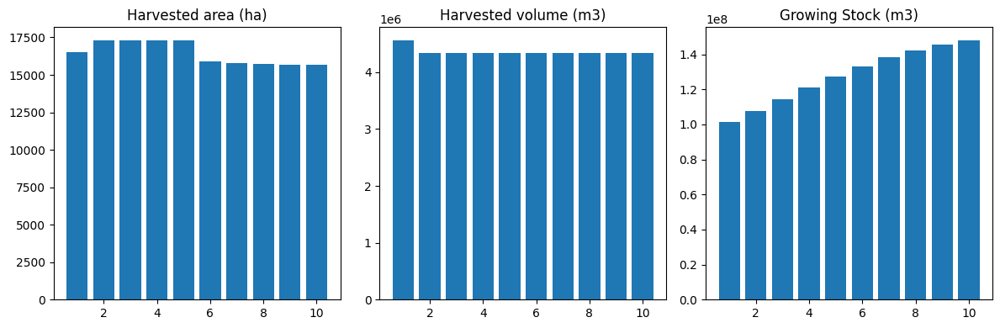

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_eqtslvr_AAC_50%_scheduling.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  46078
The economic indicator (the provincial government revenues) is:  1571378
------------------------------------------------
Saved cbm_output_1 and cbm_output_2 as pickle files.


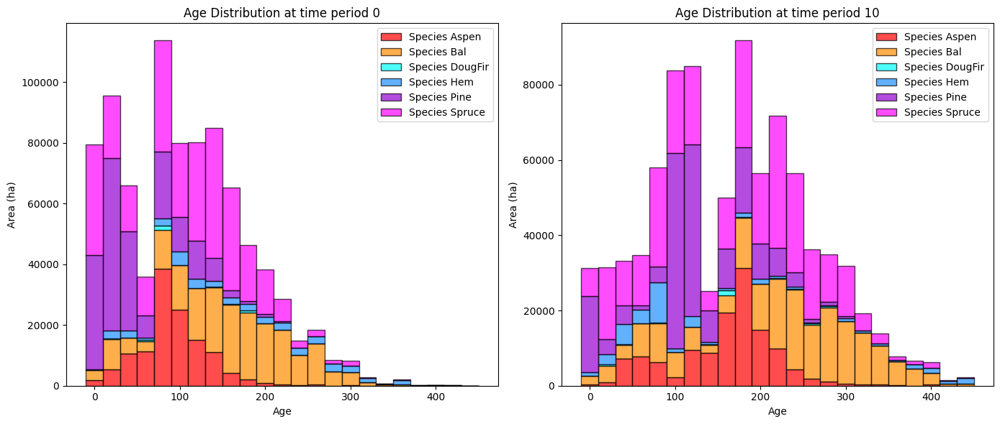

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_eqtslvr_AAC_50%_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0             10     Difference
Hem      19152.127229   10859.931907   -8292.195322
DougFir    947.047810    2329.596842    1382.549032
Bal      59315.970469  132331.618812   73015.648343
Spruce   36410.744598  152981.253080  116570.508482
Aspen    29632.731169   96919.518118   67286.786949
Pine      7432.733686   55784.626958   48351.893272

Overall diversity has **increased** by 298315.19 hectares from time period 0 to time period 10.


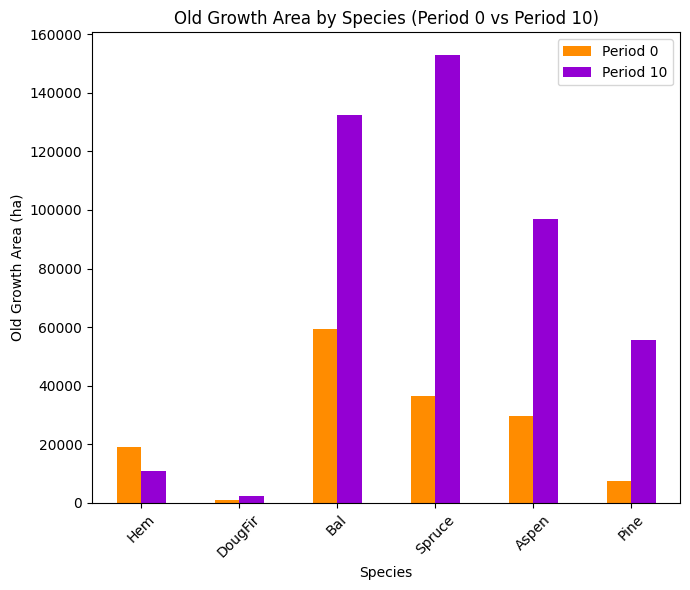

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_eqtslvr_AAC_50%_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7456

Diversity has **decreased** by 1.36% from time 0 to time 10.


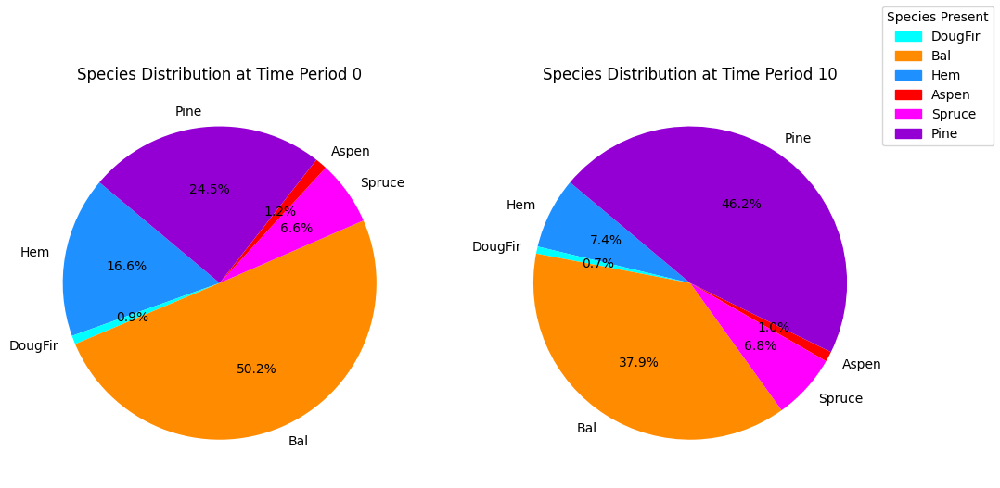

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_ha_eqtslvr_AAC_50%_species_pie.pdf
running business as usual scenario for the Equity Silver mining site
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0x1149349b
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [1e-01, 3e+03]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8907 columns
Presolve time: 0.32s
Presolved: 8375 rows, 74352 columns, 536195 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Or

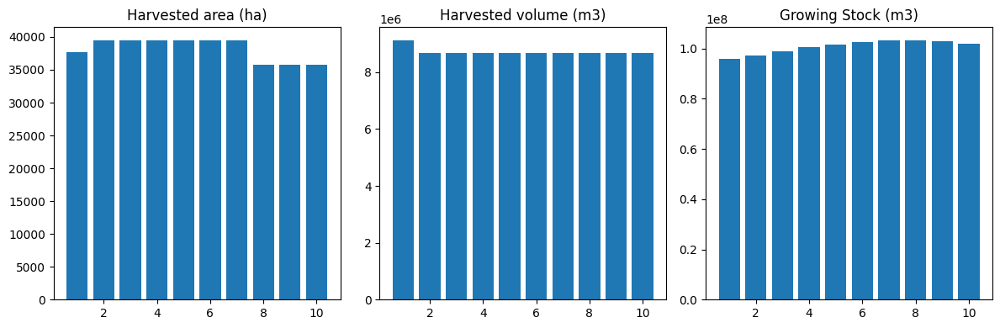

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_scheduling.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  92157
The economic indicator (the provincial government revenues) is:  3142756
------------------------------------------------
Saved cbm_output_3 and cbm_output_4 as pickle files.


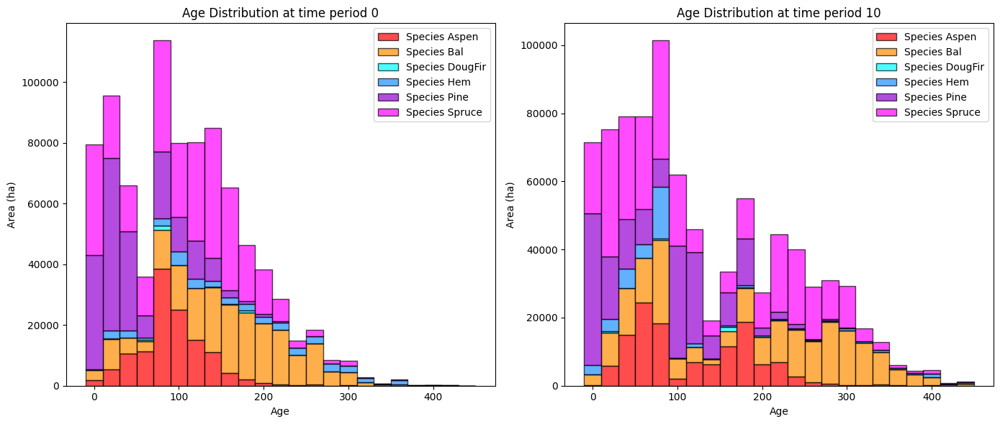

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0             10    Difference
Hem      19152.127229    6181.406415 -12970.720813
DougFir    947.047810    1826.436329    879.388519
Bal      59315.970469  103190.283054  43874.312585
Spruce   36410.744598  106090.302348  69679.557750
Aspen    29632.731169   57543.448439  27910.717270
Pine      7432.733686   28846.602045  21413.868359

Overall diversity has **increased** by 150787.12 hectares from time period 0 to time period 10.


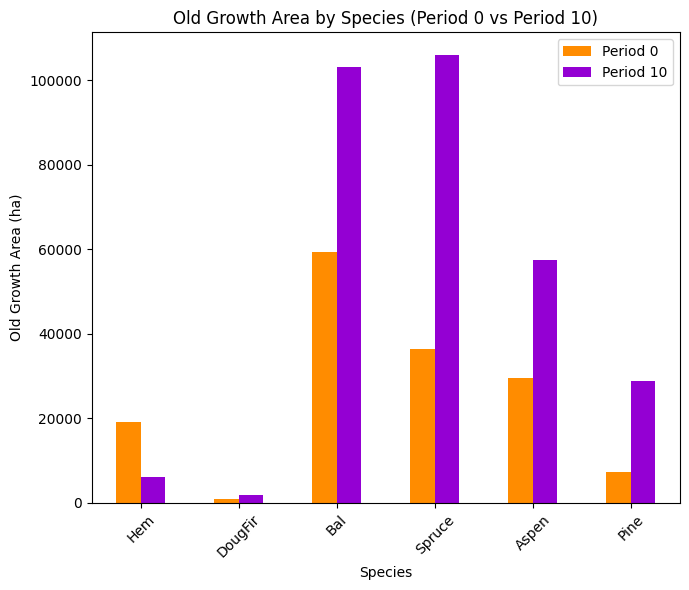

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7543

Diversity has **decreased** by 0.49% from time 0 to time 10.


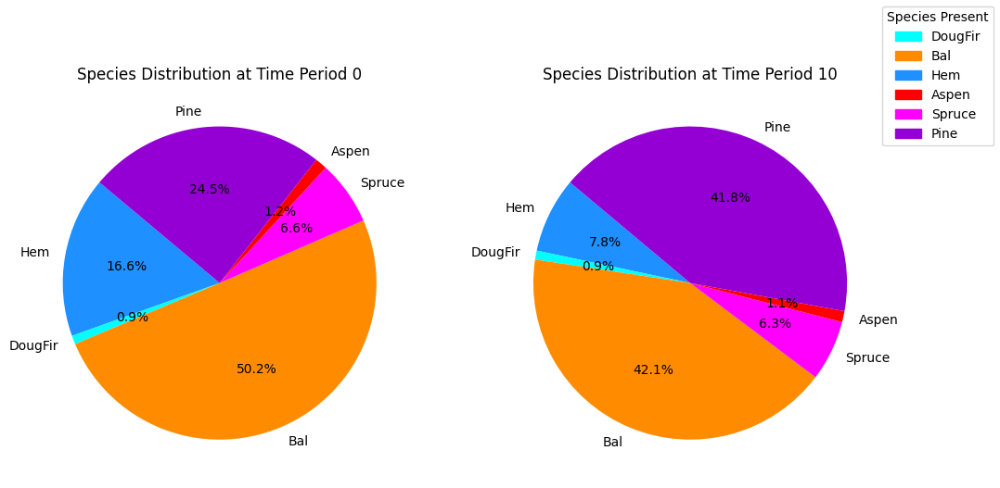

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_species_pie.pdf


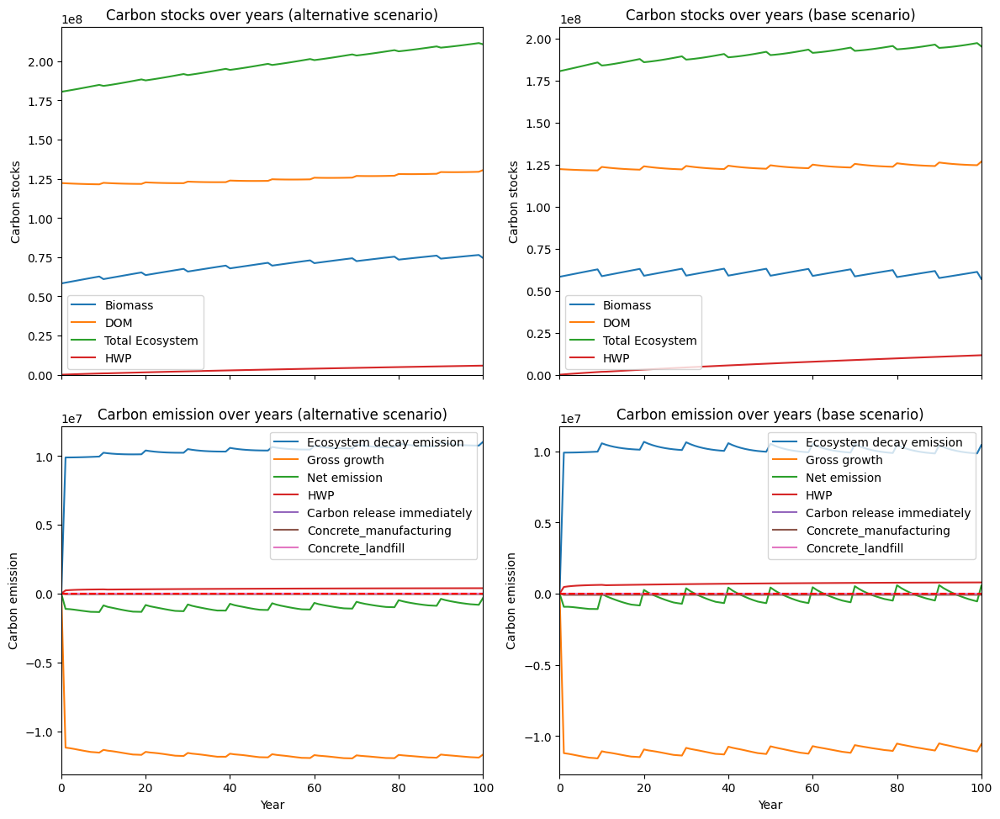

---------------------------------------------------------------------------------------
Net emission difference -13139973.022618746
Net emission base scenario -27552084.824086573
Net emission alternative scenario -14412111.801467825
dollar_per_ton is:  0.7610365700741019
Comparison of Old Growth Areas (Alternative - Base)
           0            10    Difference
Hem      0.0   4678.525491   4678.525491
DougFir  0.0    503.160513    503.160513
Bal      0.0  29141.335758  29141.335758
Spruce   0.0  46890.950732  46890.950732
Aspen    0.0  39376.069679  39376.069679
Pine     0.0  26938.024913  26938.024913

Overall, the old growth area has **increased** by 147528.07 hectares in the alternative scenario compared to the base scenario.


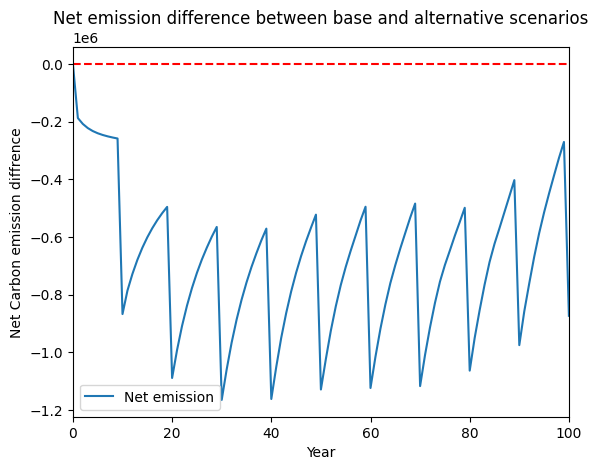

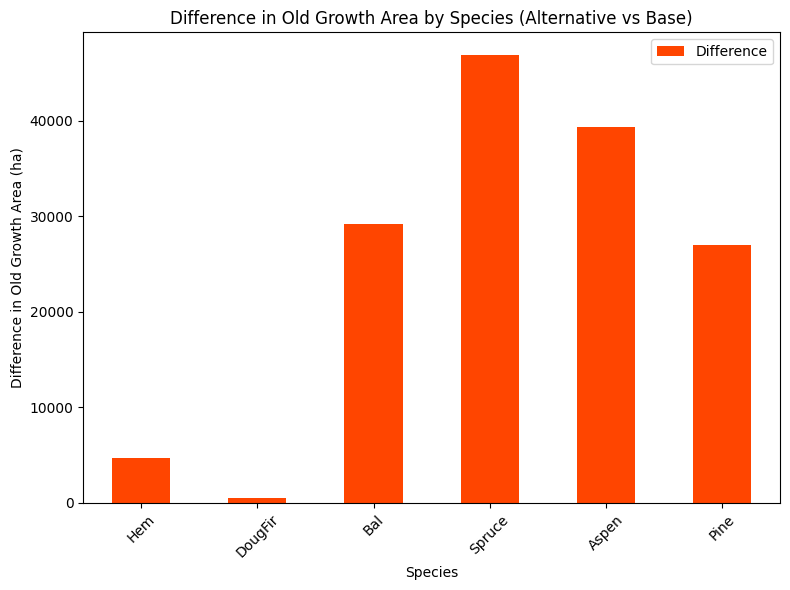

<Figure size 640x480 with 0 Axes>

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_kpi_age_difference.pdf


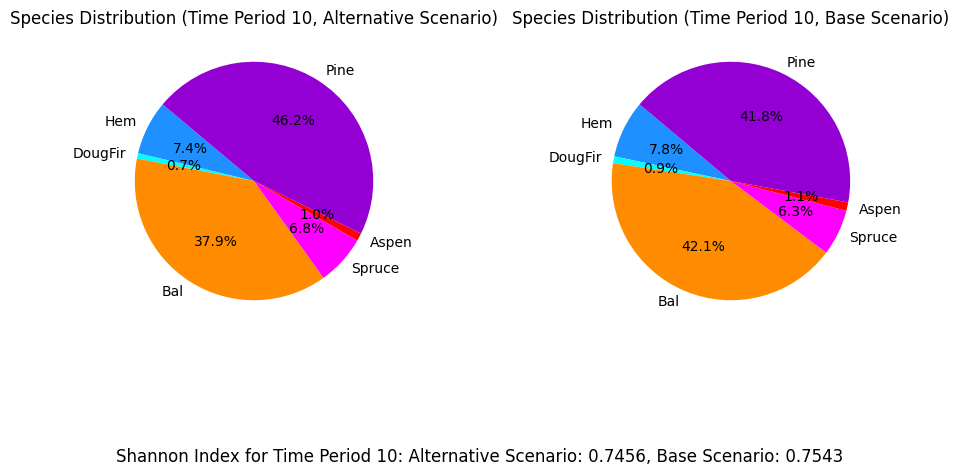

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_ha_kpi_species_difference_pie.pdf
---------------------------------------------------------------------------------------
Running for equitysilver_min_ha_eqtslvr_AAC_40%...
running the scenario for the Equity Silver mining site (40%_AAC),
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0x73a87f99
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [1e-01, 3e+03]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8907 columns
Presolve time: 0.36s
Presolved: 8375 r

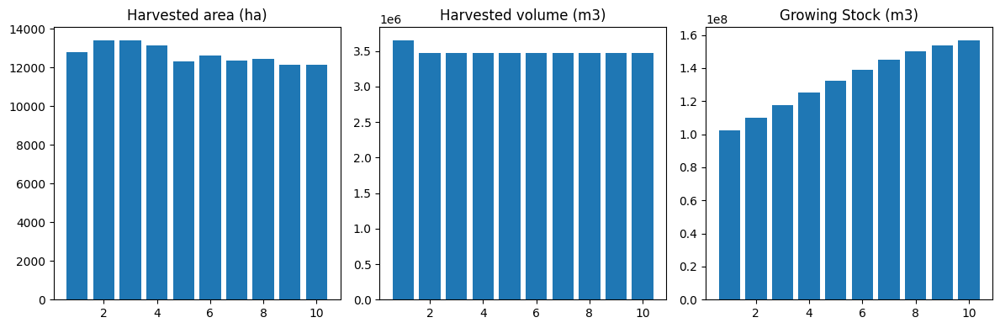

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_eqtslvr_AAC_40%_scheduling.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  36862
The economic indicator (the provincial government revenues) is:  1257102
------------------------------------------------
Saved cbm_output_1 and cbm_output_2 as pickle files.


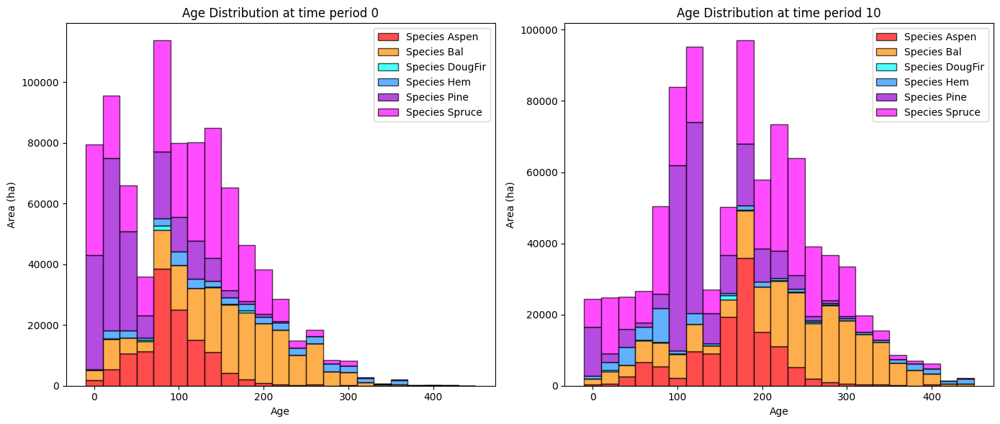

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_eqtslvr_AAC_40%_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0             10     Difference
Hem      19152.127229   12537.453266   -6614.673963
DougFir    947.047810    2329.596842    1382.549032
Bal      59315.970469  139668.538812   80352.568344
Spruce   36410.744598  163201.541143  126790.796546
Aspen    29632.731169  103959.649871   74326.918701
Pine      7432.733686   57657.739102   50225.005416

Overall diversity has **increased** by 326463.16 hectares from time period 0 to time period 10.


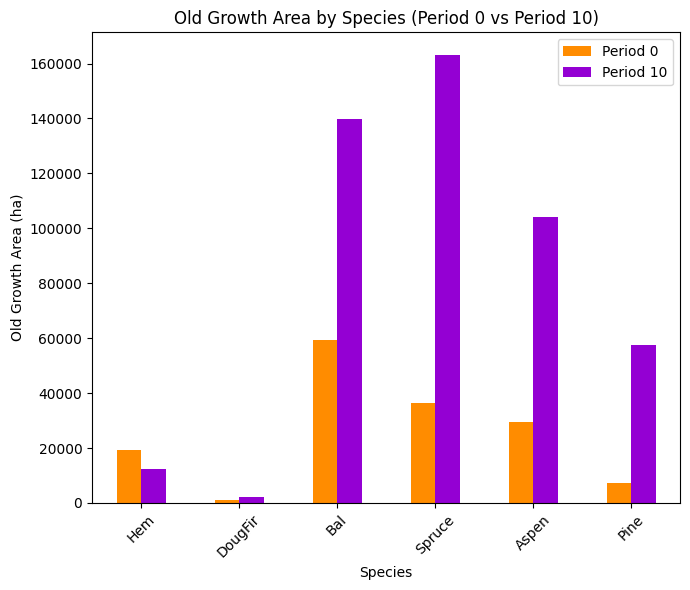

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_eqtslvr_AAC_40%_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7431

Diversity has **decreased** by 1.60% from time 0 to time 10.


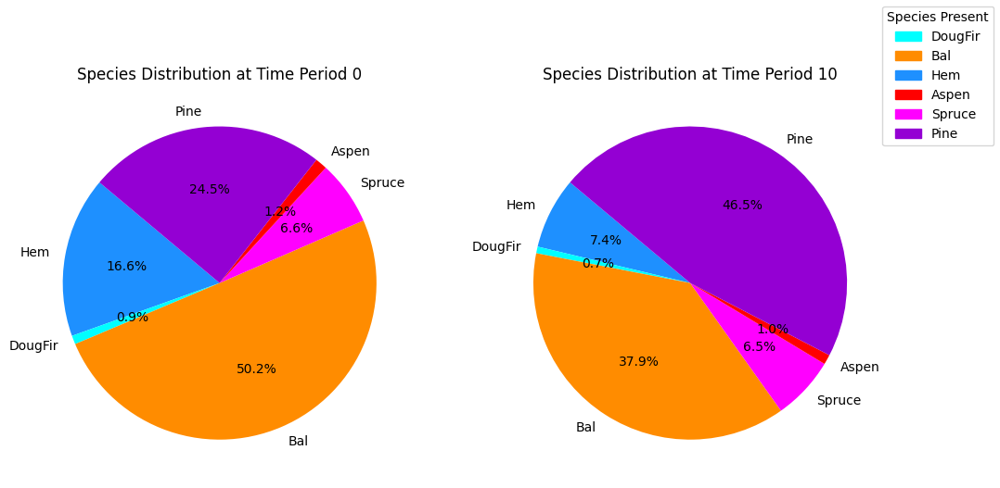

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_ha_eqtslvr_AAC_40%_species_pie.pdf
running business as usual scenario for the Equity Silver mining site
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0x1149349b
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [1e-01, 3e+03]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8907 columns
Presolve time: 0.37s
Presolved: 8375 rows, 74352 columns, 536195 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Or

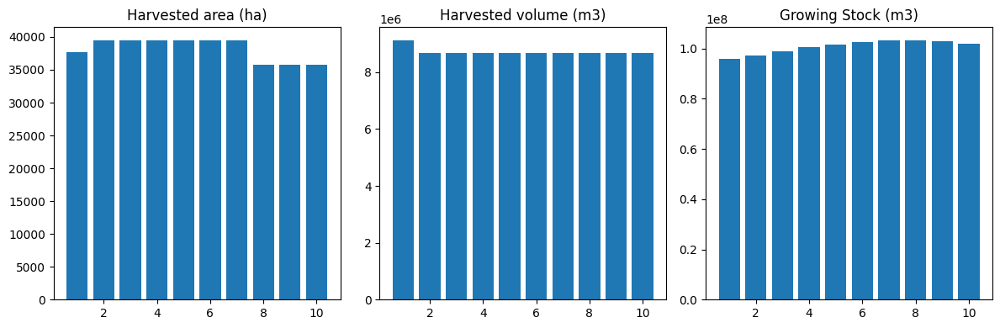

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_scheduling.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  92157
The economic indicator (the provincial government revenues) is:  3142756
------------------------------------------------
Saved cbm_output_3 and cbm_output_4 as pickle files.


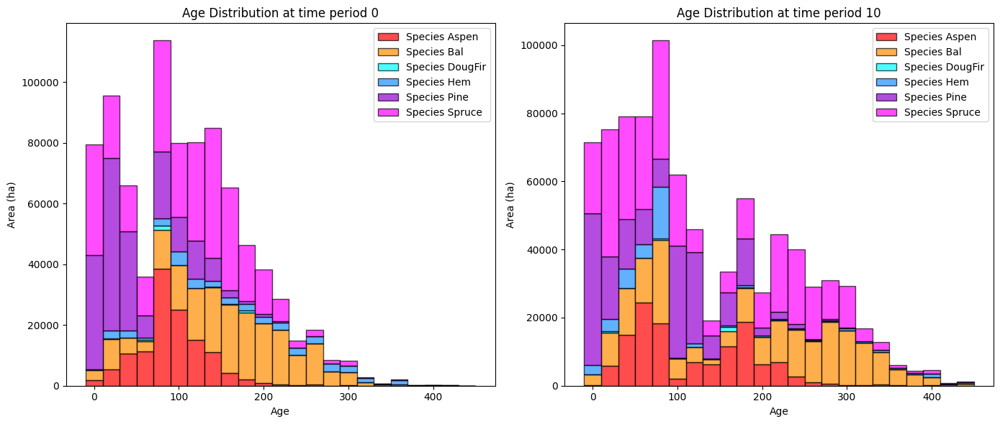

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0             10    Difference
Hem      19152.127229    6181.406415 -12970.720813
DougFir    947.047810    1826.436329    879.388519
Bal      59315.970469  103190.283054  43874.312585
Spruce   36410.744598  106090.302348  69679.557750
Aspen    29632.731169   57543.448439  27910.717270
Pine      7432.733686   28846.602045  21413.868359

Overall diversity has **increased** by 150787.12 hectares from time period 0 to time period 10.


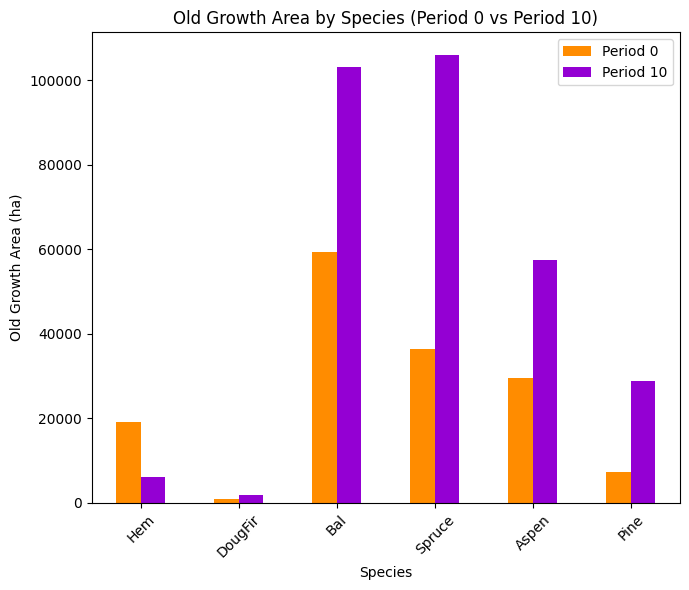

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7543

Diversity has **decreased** by 0.49% from time 0 to time 10.


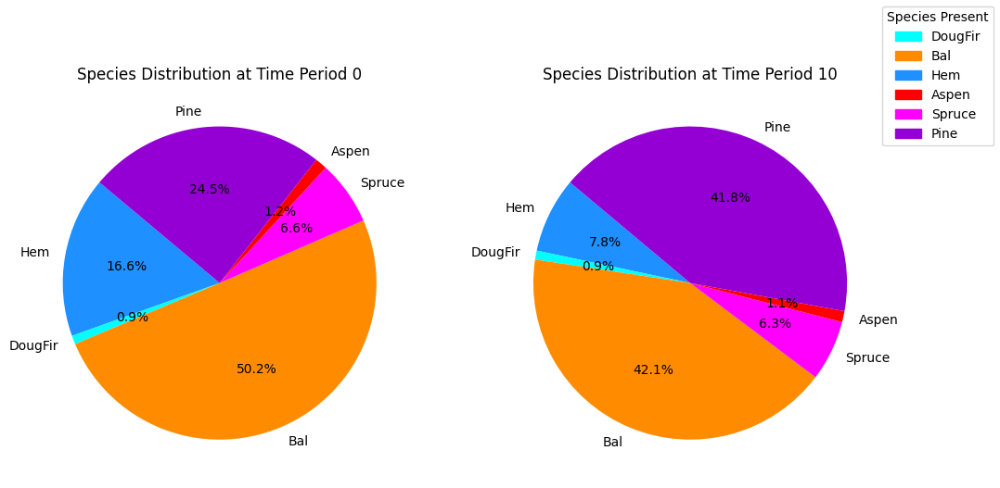

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_species_pie.pdf


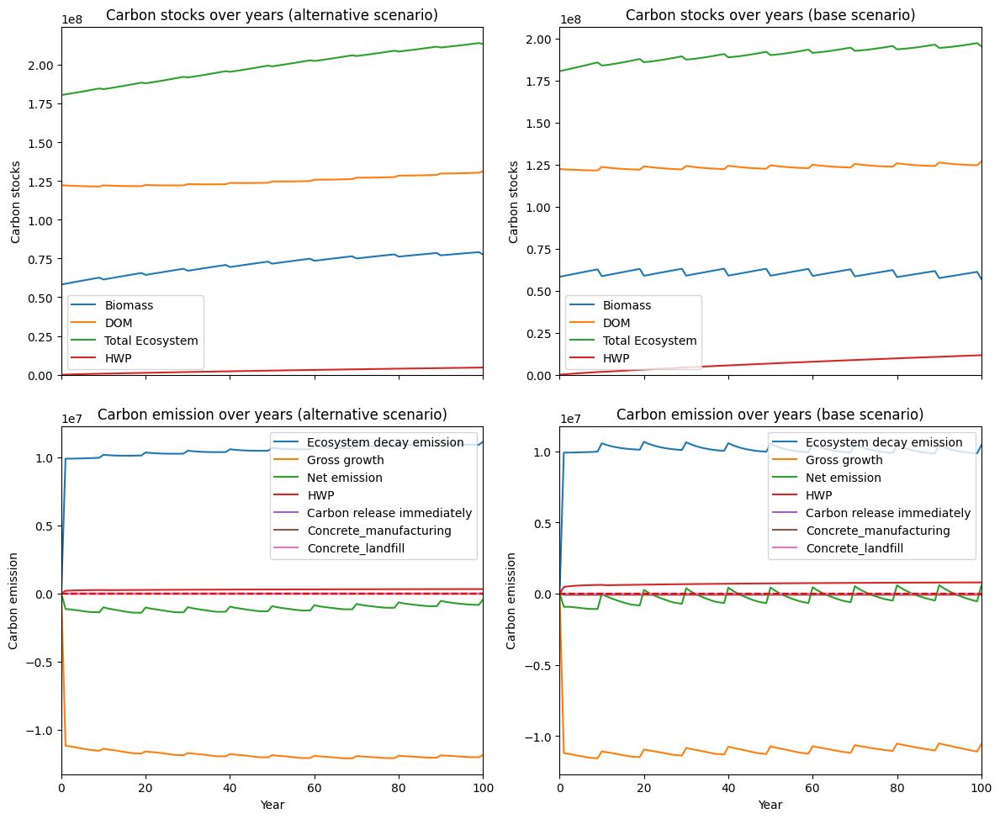

---------------------------------------------------------------------------------------
Net emission difference -15668109.403400693
Net emission base scenario -30080221.204868518
Net emission alternative scenario -14412111.801467825
dollar_per_ton is:  0.6382390971708141
Comparison of Old Growth Areas (Alternative - Base)
           0            10    Difference
Hem      0.0   6356.046851   6356.046851
DougFir  0.0    503.160513    503.160513
Bal      0.0  36478.255758  36478.255758
Spruce   0.0  57111.238796  57111.238796
Aspen    0.0  46416.201432  46416.201432
Pine     0.0  28811.137056  28811.137056

Overall, the old growth area has **increased** by 175676.04 hectares in the alternative scenario compared to the base scenario.


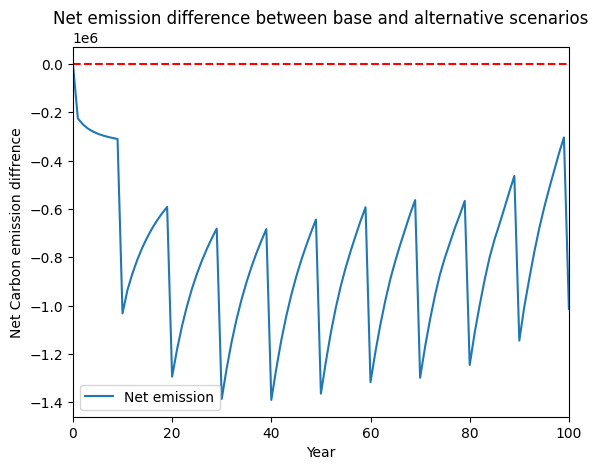

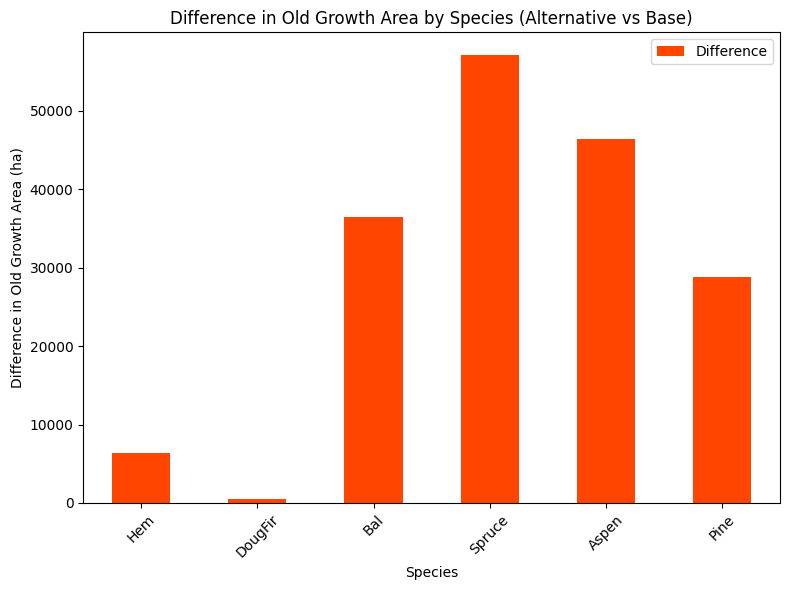

<Figure size 640x480 with 0 Axes>

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_kpi_age_difference.pdf


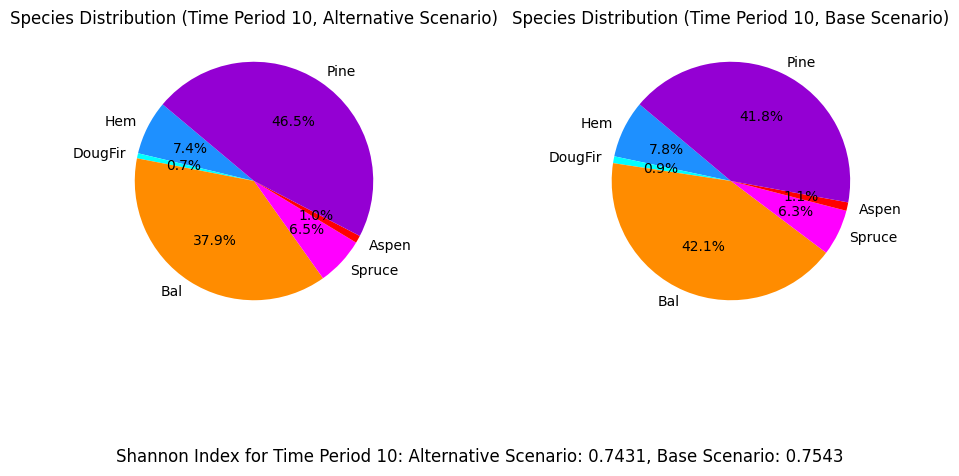

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_ha_kpi_species_difference_pie.pdf
---------------------------------------------------------------------------------------
Running for equitysilver_min_ha_eqtslvr_AAC_30%...
running the scenario for the Equity Silver mining site (30%_AAC),
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0xbf56fbc9
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [1e-01, 3e+03]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8907 columns
Presolve time: 0.32s
Presolved: 8375 r

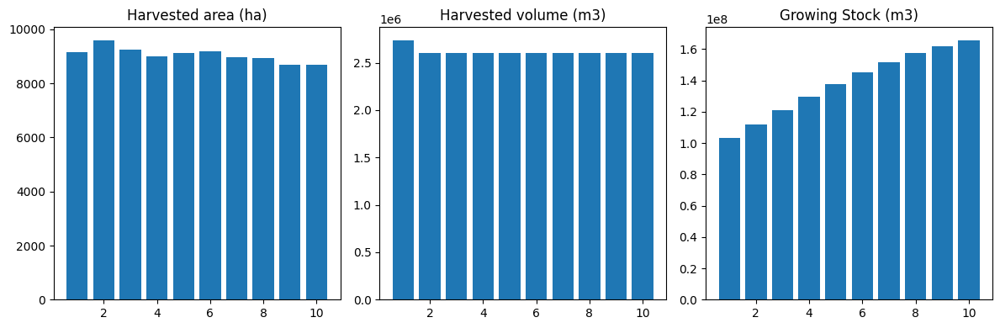

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_eqtslvr_AAC_30%_scheduling.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  27647
The economic indicator (the provincial government revenues) is:  942827
------------------------------------------------
Saved cbm_output_1 and cbm_output_2 as pickle files.


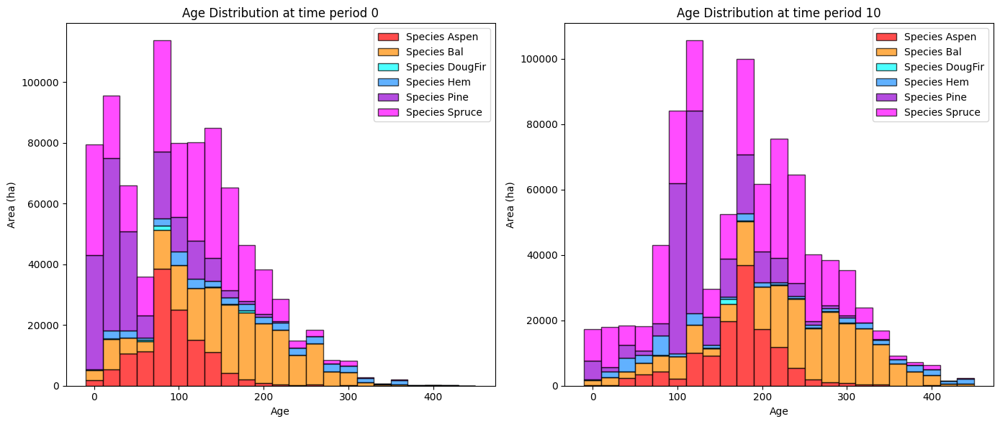

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_eqtslvr_AAC_30%_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0             10     Difference
Hem      19152.127229   18537.372391    -614.754837
DougFir    947.047810    2572.498932    1625.451122
Bal      59315.970469  145421.914561   86105.944092
Spruce   36410.744598  168457.399841  132046.655244
Aspen    29632.731169  108958.038445   79325.307276
Pine      7432.733686   61190.224563   53757.490877

Overall diversity has **increased** by 352246.09 hectares from time period 0 to time period 10.


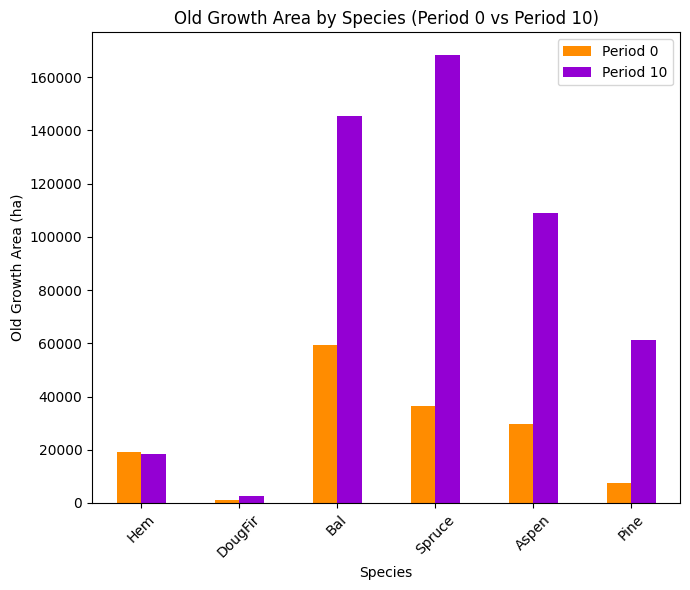

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_eqtslvr_AAC_30%_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7487

Diversity has **decreased** by 1.05% from time 0 to time 10.


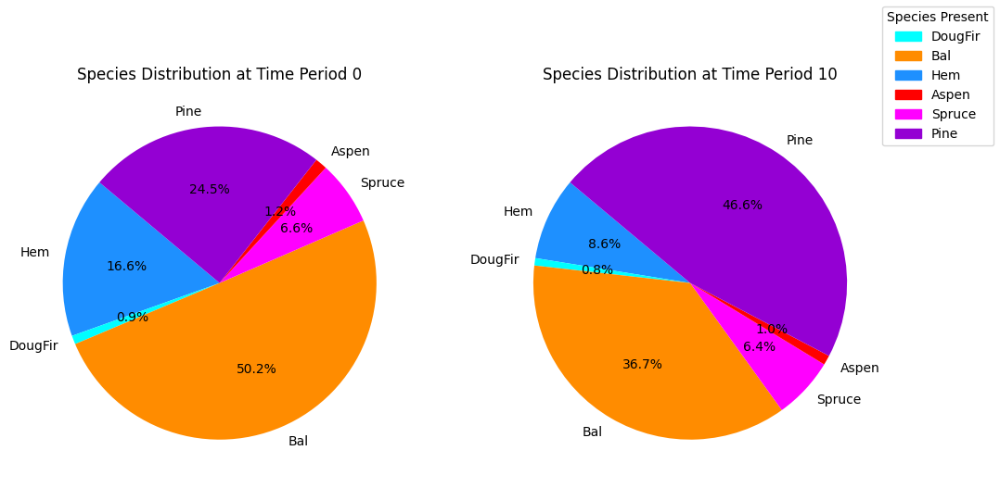

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_ha_eqtslvr_AAC_30%_species_pie.pdf
running business as usual scenario for the Equity Silver mining site
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0x1149349b
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [1e-01, 3e+03]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8907 columns
Presolve time: 0.38s
Presolved: 8375 rows, 74352 columns, 536195 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Or

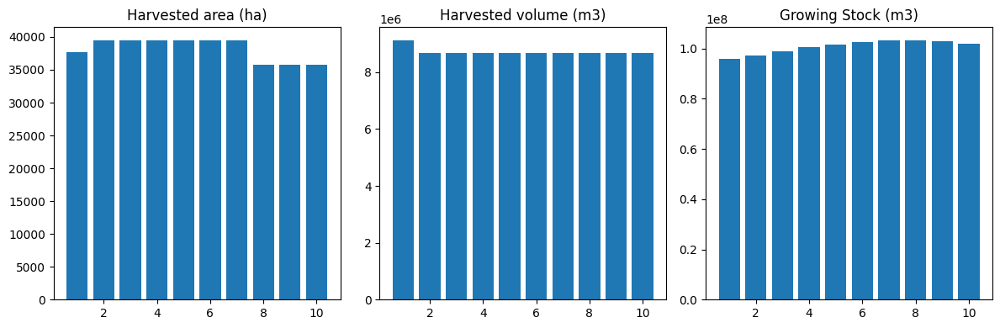

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_scheduling.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  92157
The economic indicator (the provincial government revenues) is:  3142756
------------------------------------------------
Saved cbm_output_3 and cbm_output_4 as pickle files.


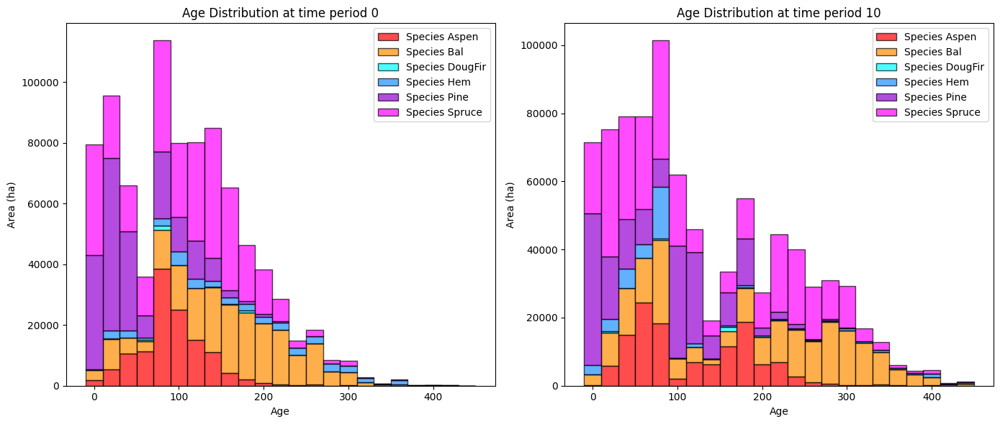

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0             10    Difference
Hem      19152.127229    6181.406415 -12970.720813
DougFir    947.047810    1826.436329    879.388519
Bal      59315.970469  103190.283054  43874.312585
Spruce   36410.744598  106090.302348  69679.557750
Aspen    29632.731169   57543.448439  27910.717270
Pine      7432.733686   28846.602045  21413.868359

Overall diversity has **increased** by 150787.12 hectares from time period 0 to time period 10.


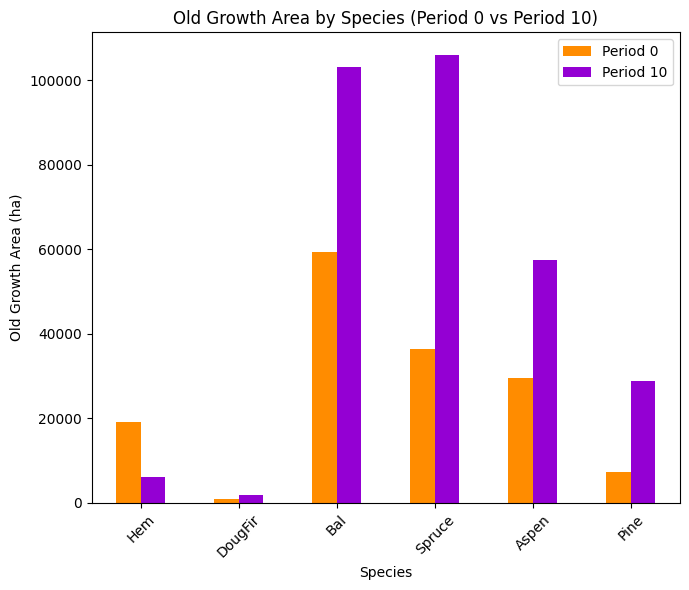

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7543

Diversity has **decreased** by 0.49% from time 0 to time 10.


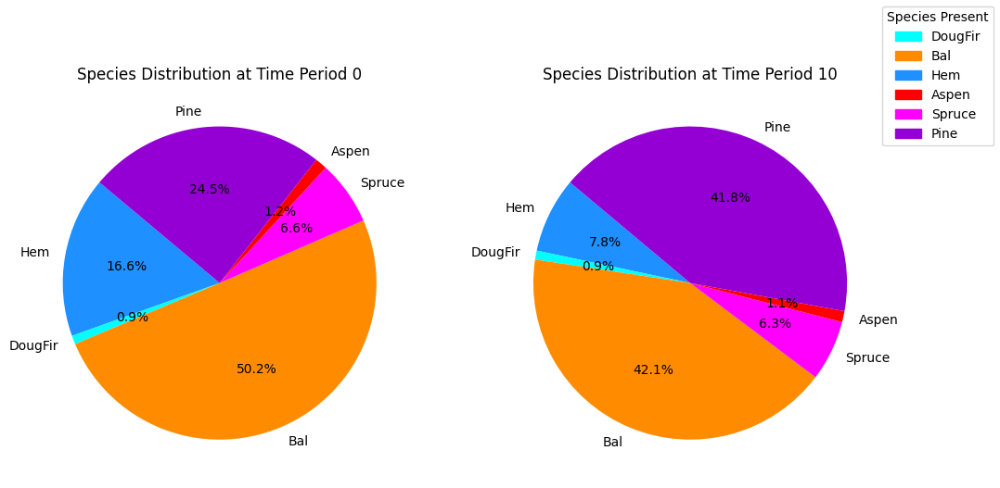

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_species_pie.pdf


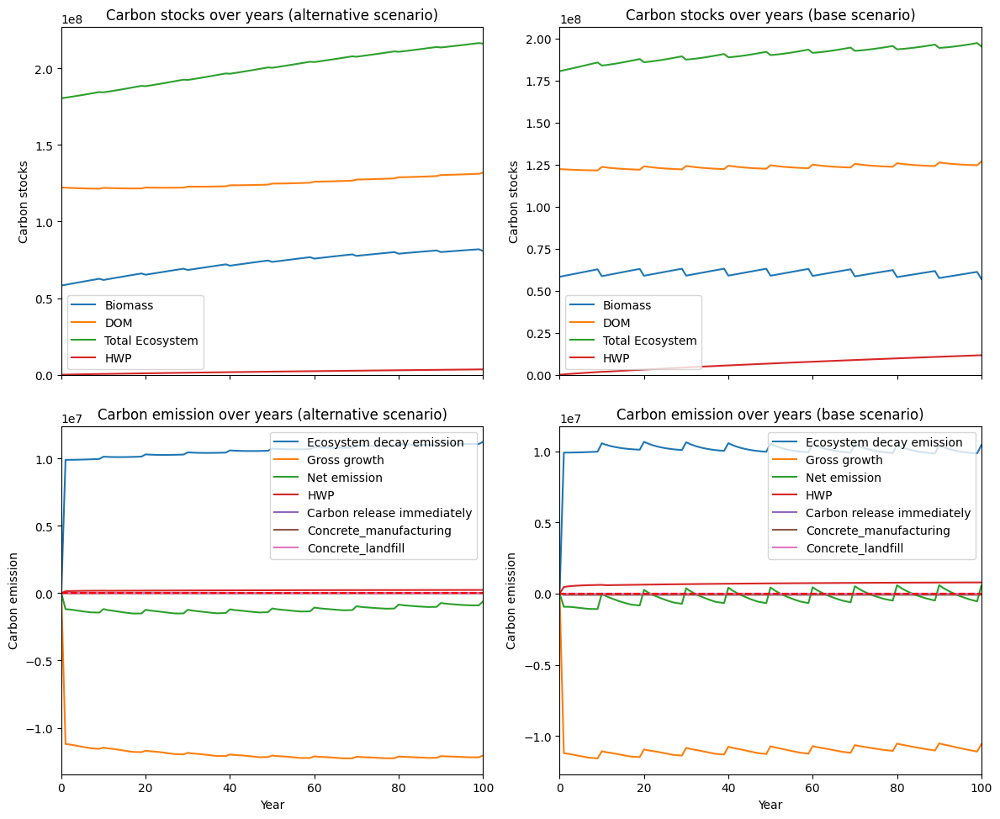

---------------------------------------------------------------------------------------
Net emission difference -18096953.568573814
Net emission base scenario -32509065.37004164
Net emission alternative scenario -14412111.801467825
dollar_per_ton is:  0.5525791930728858
Comparison of Old Growth Areas (Alternative - Base)
           0            10    Difference
Hem      0.0  12355.965976  12355.965976
DougFir  0.0    746.062603    746.062603
Bal      0.0  42231.631506  42231.631506
Spruce   0.0  62367.097494  62367.097494
Aspen    0.0  51414.590006  51414.590006
Pine     0.0  32343.622518  32343.622518

Overall, the old growth area has **increased** by 201458.97 hectares in the alternative scenario compared to the base scenario.


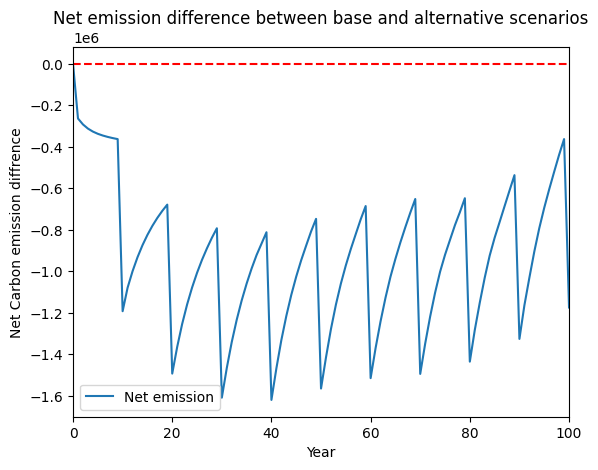

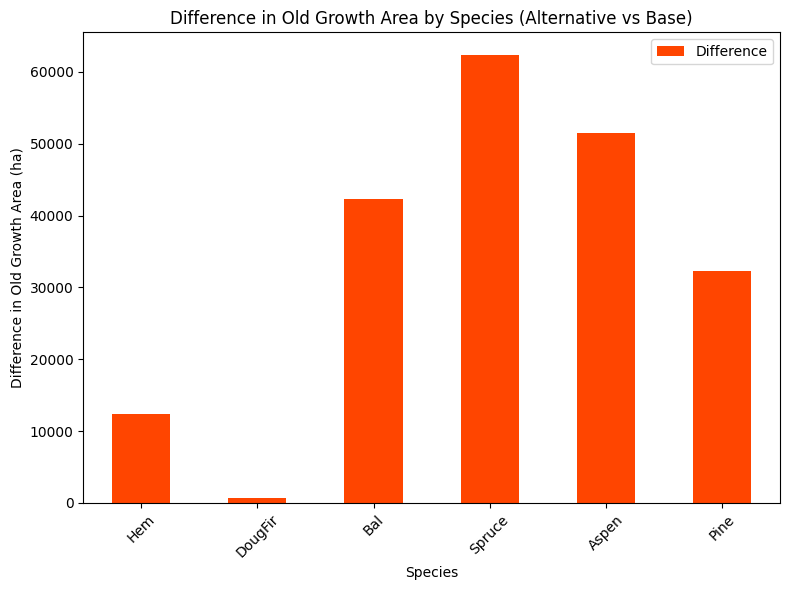

<Figure size 640x480 with 0 Axes>

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_kpi_age_difference.pdf


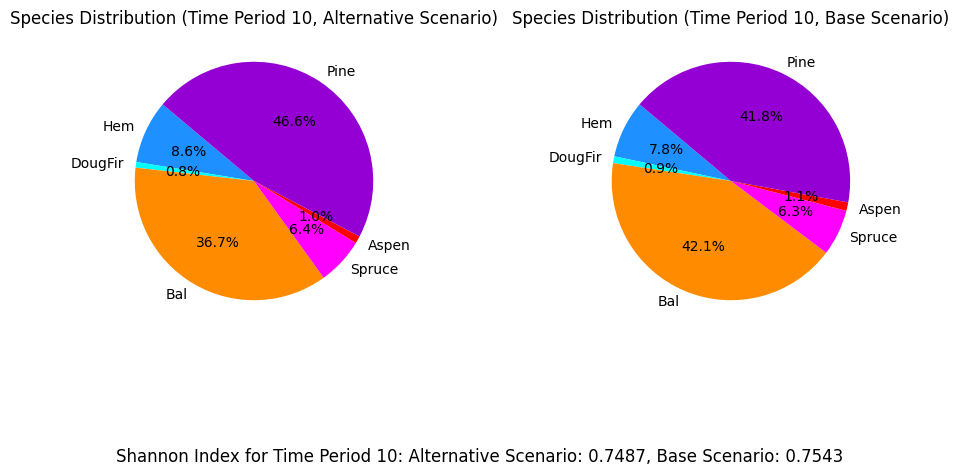

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_ha_kpi_species_difference_pie.pdf
---------------------------------------------------------------------------------------
Running for equitysilver_min_ha_eqtslvr_AAC_20%...
running the scenario for the Equity Silver mining site (20%_AAC),
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0x202e9659
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [1e-01, 3e+03]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8907 columns
Presolve time: 0.30s
Presolved: 8375 r

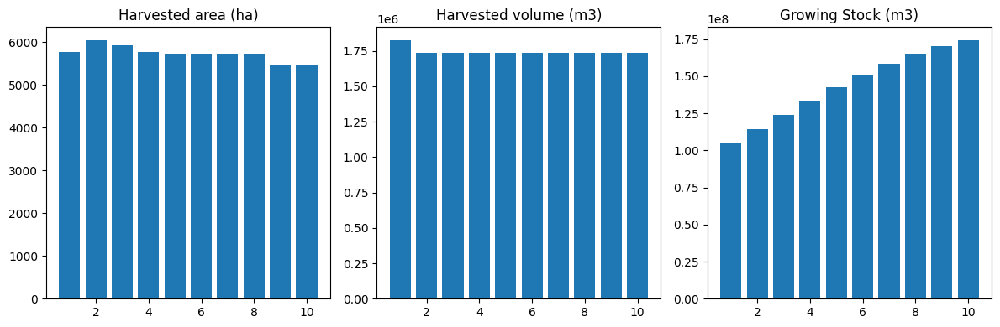

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_eqtslvr_AAC_20%_scheduling.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  18431
The economic indicator (the provincial government revenues) is:  628551
------------------------------------------------
Saved cbm_output_1 and cbm_output_2 as pickle files.


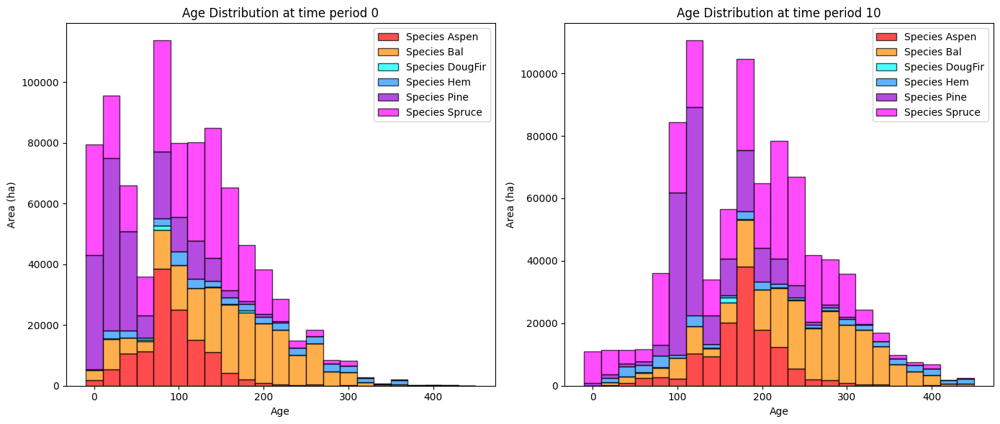

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_eqtslvr_AAC_20%_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0             10     Difference
Hem      19152.127229   22278.610474    3126.483245
DougFir    947.047810    2607.841586    1660.793776
Bal      59315.970469  150803.731682   91487.761213
Spruce   36410.744598  175216.589031  138805.844433
Aspen    29632.731169  113210.933660   83578.202490
Pine      7432.733686   66172.191757   58739.458070

Overall diversity has **increased** by 377398.54 hectares from time period 0 to time period 10.


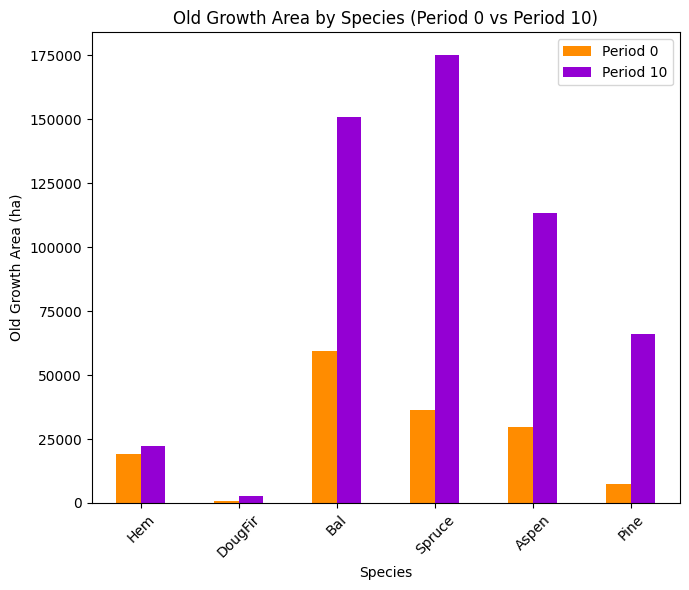

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_eqtslvr_AAC_20%_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7489

Diversity has **decreased** by 1.03% from time 0 to time 10.


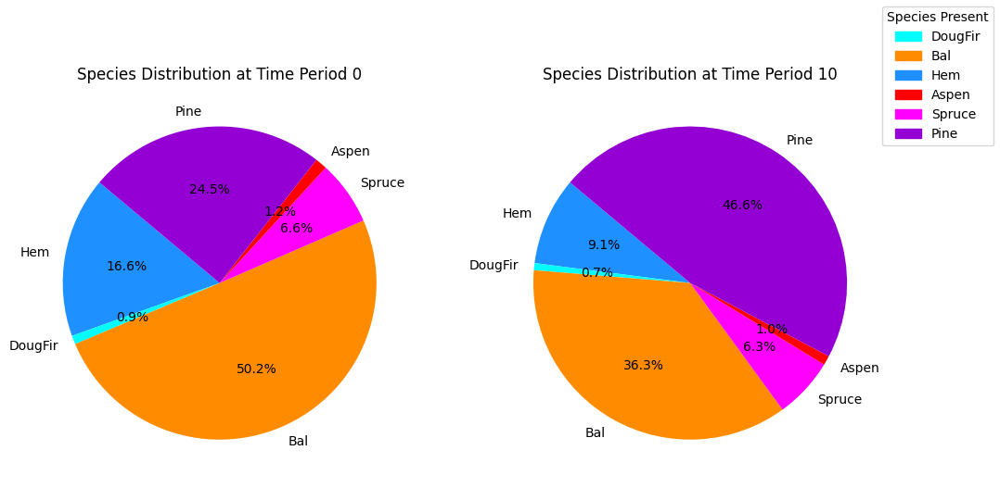

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_ha_eqtslvr_AAC_20%_species_pie.pdf
running business as usual scenario for the Equity Silver mining site
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0x1149349b
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [1e-01, 3e+03]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8907 columns
Presolve time: 0.35s
Presolved: 8375 rows, 74352 columns, 536195 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Or

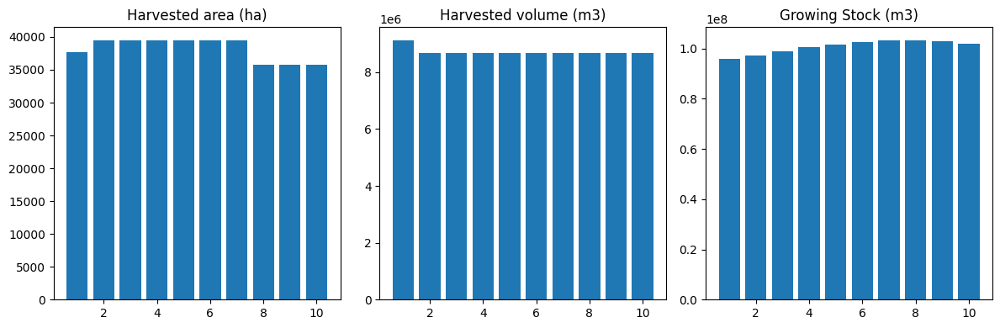

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_scheduling.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  92157
The economic indicator (the provincial government revenues) is:  3142756
------------------------------------------------
Saved cbm_output_3 and cbm_output_4 as pickle files.


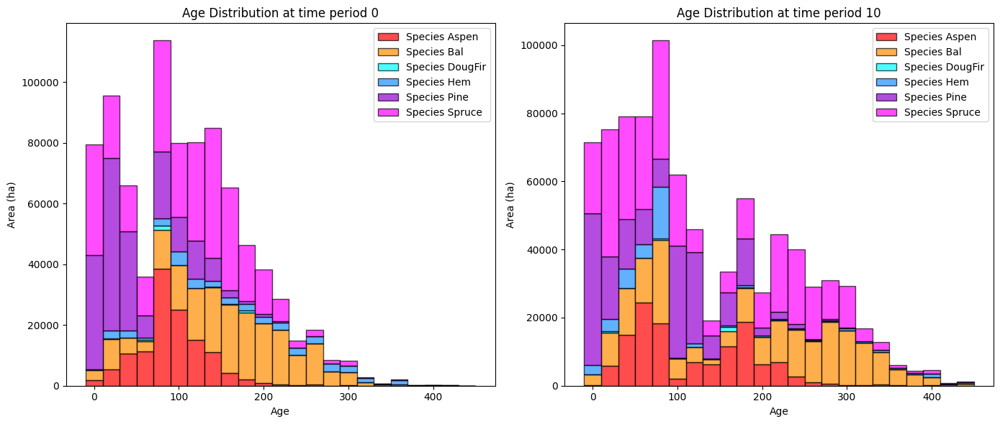

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0             10    Difference
Hem      19152.127229    6181.406415 -12970.720813
DougFir    947.047810    1826.436329    879.388519
Bal      59315.970469  103190.283054  43874.312585
Spruce   36410.744598  106090.302348  69679.557750
Aspen    29632.731169   57543.448439  27910.717270
Pine      7432.733686   28846.602045  21413.868359

Overall diversity has **increased** by 150787.12 hectares from time period 0 to time period 10.


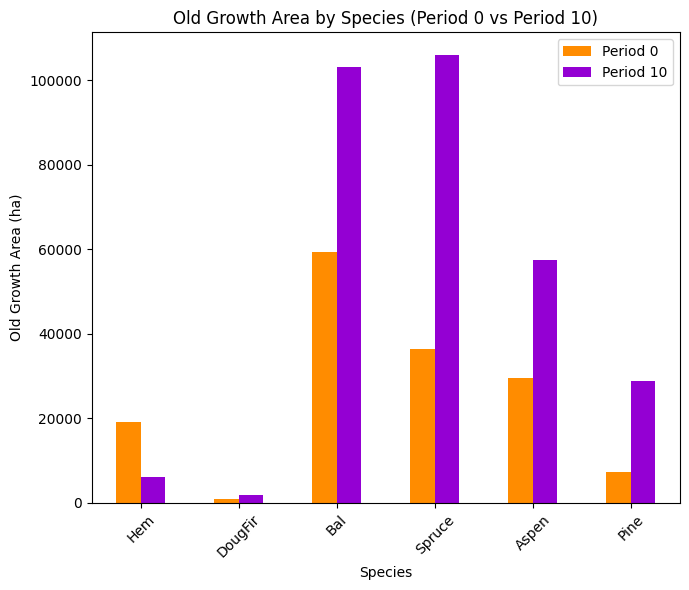

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7543

Diversity has **decreased** by 0.49% from time 0 to time 10.


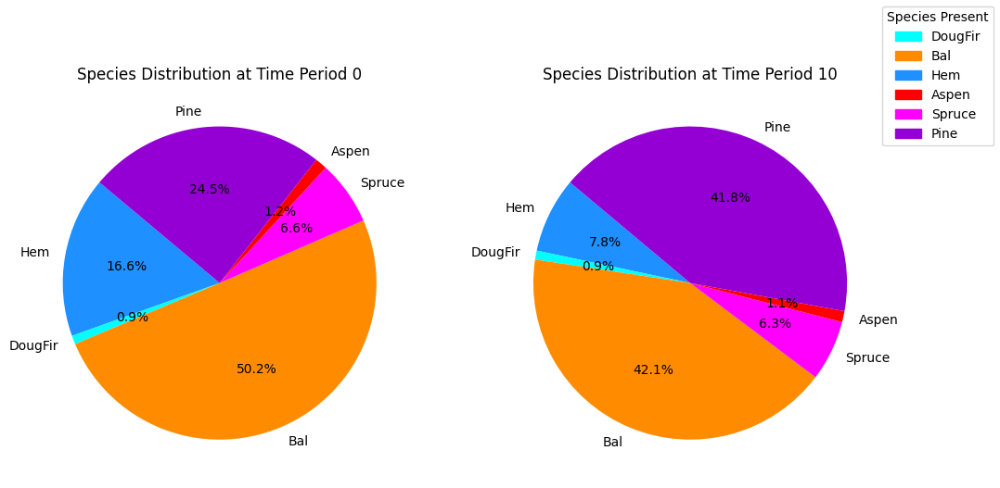

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_species_pie.pdf


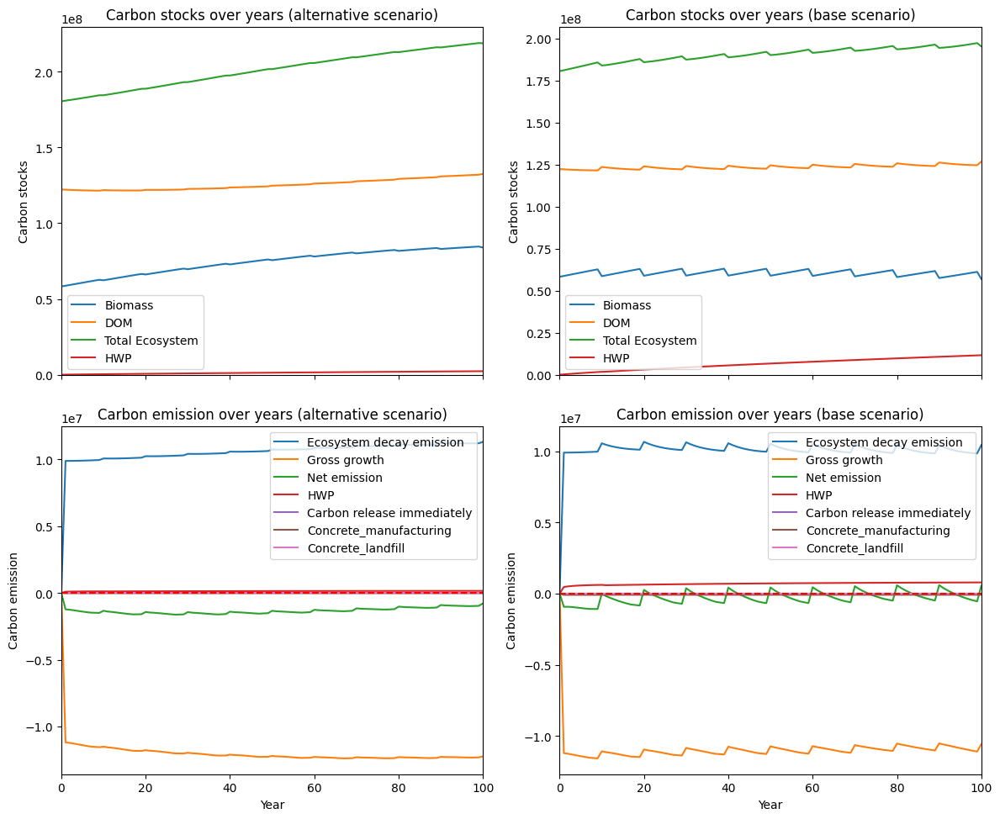

---------------------------------------------------------------------------------------
Net emission difference -20457709.92010603
Net emission base scenario -34869821.72157386
Net emission alternative scenario -14412111.801467825
dollar_per_ton is:  0.4888132659546563
Comparison of Old Growth Areas (Alternative - Base)
           0            10    Difference
Hem      0.0  16097.204059  16097.204059
DougFir  0.0    781.405257    781.405257
Bal      0.0  47613.448628  47613.448628
Spruce   0.0  69126.286683  69126.286683
Aspen    0.0  55667.485221  55667.485221
Pine     0.0  37325.589711  37325.589711

Overall, the old growth area has **increased** by 226611.42 hectares in the alternative scenario compared to the base scenario.


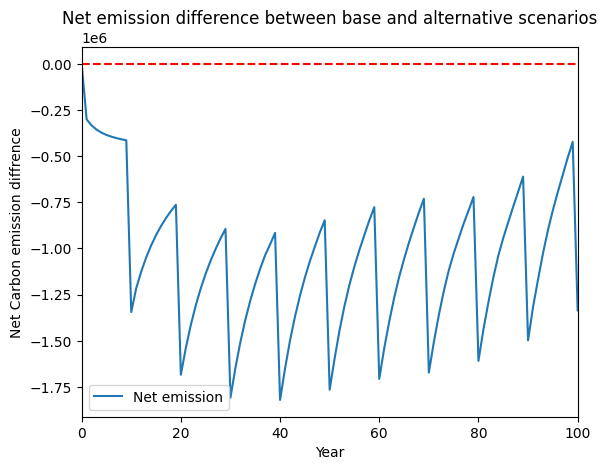

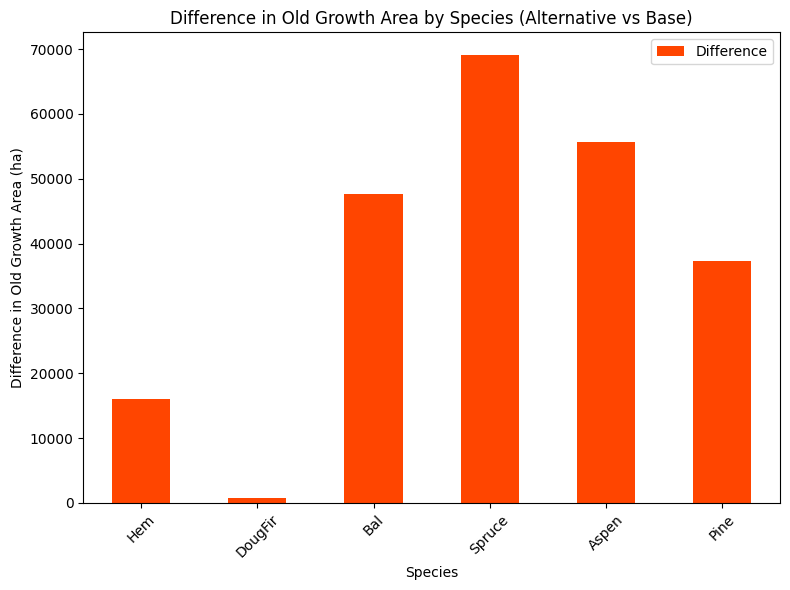

<Figure size 640x480 with 0 Axes>

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_kpi_age_difference.pdf


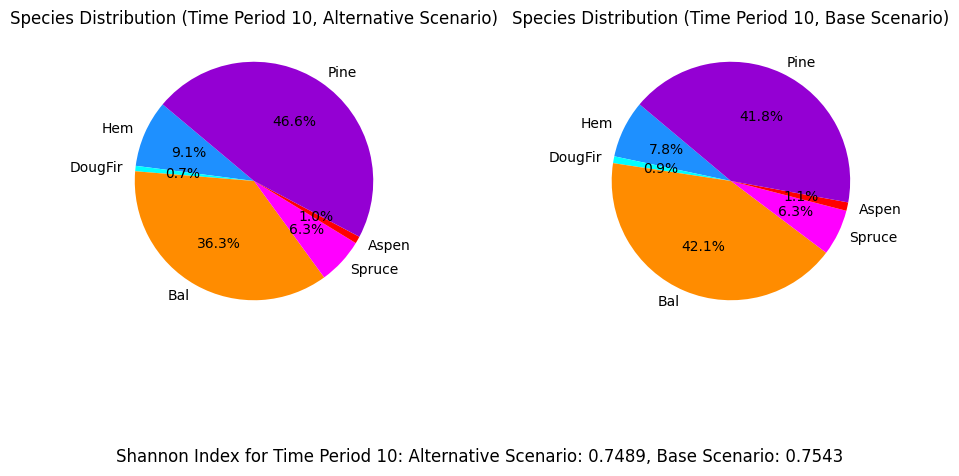

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_ha_kpi_species_difference_pie.pdf
---------------------------------------------------------------------------------------
Running for equitysilver_min_ha_eqtslvr_AAC_10%...
running the scenario for the Equity Silver mining site (10%_AAC),
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0x59c6748c
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [1e-01, 3e+03]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8907 columns
Presolve time: 0.34s
Presolved: 8375 r

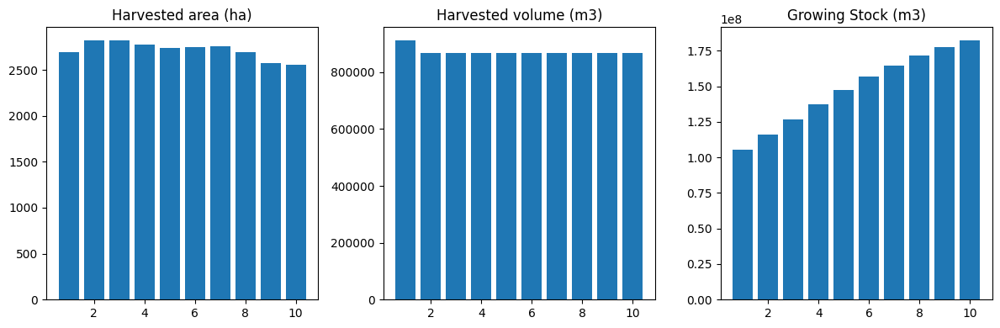

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_eqtslvr_AAC_10%_scheduling.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  9215
The economic indicator (the provincial government revenues) is:  314275
------------------------------------------------
Saved cbm_output_1 and cbm_output_2 as pickle files.


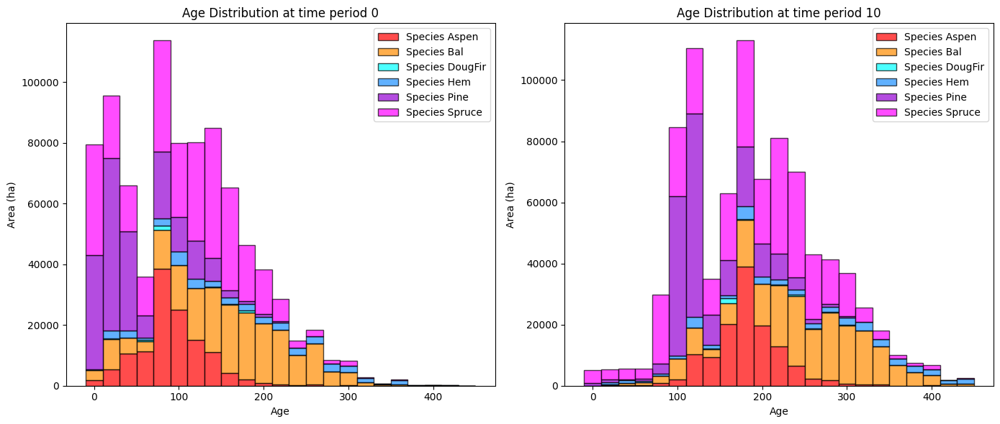

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_eqtslvr_AAC_10%_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0             10     Difference
Hem      19152.127229   29683.917331   10531.790102
DougFir    947.047810    2749.298212    1802.250402
Bal      59315.970469  154753.825236   95437.854767
Spruce   36410.744598  183918.583740  147507.839142
Aspen    29632.731169  117876.300747   88243.569578
Pine      7432.733686   67652.005498   60219.271812

Overall diversity has **increased** by 403742.58 hectares from time period 0 to time period 10.


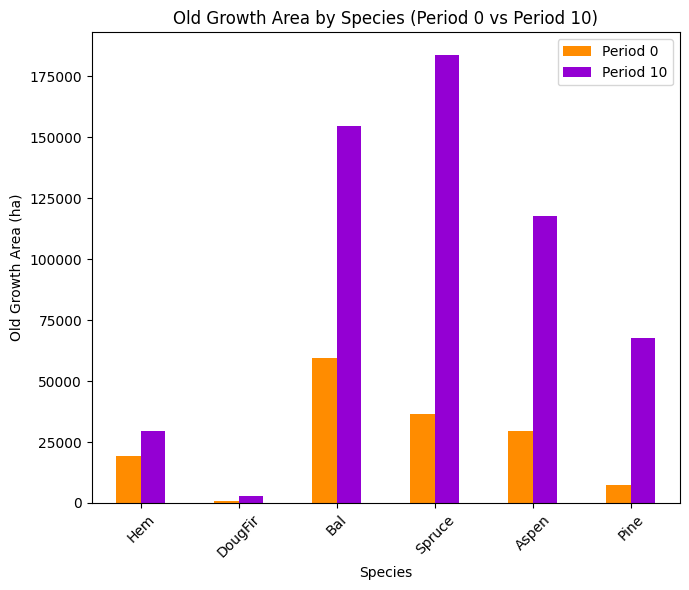

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_eqtslvr_AAC_10%_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7502

Diversity has **decreased** by 0.89% from time 0 to time 10.


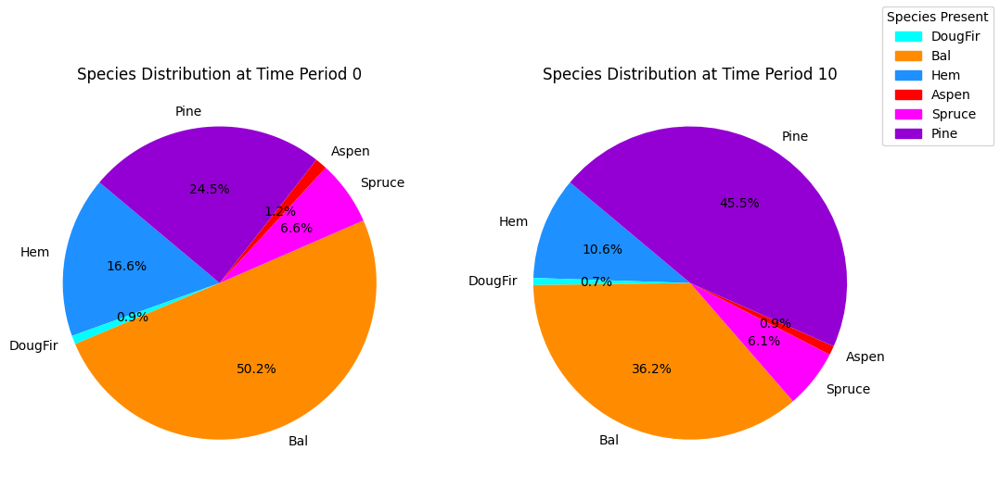

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_ha_eqtslvr_AAC_10%_species_pie.pdf
running business as usual scenario for the Equity Silver mining site
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 17067 rows, 83258 columns and 631504 nonzeros
Model fingerprint: 0x1149349b
Coefficient statistics:
  Matrix range     [5e-03, 7e+05]
  Objective range  [1e-01, 3e+03]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+11]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 8692 rows and 8907 columns
Presolve time: 0.31s
Presolved: 8375 rows, 74352 columns, 536195 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Or

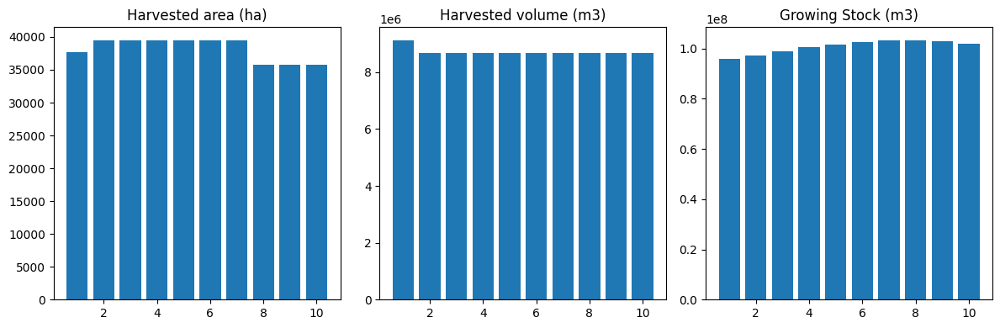

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_scheduling.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  92157
The economic indicator (the provincial government revenues) is:  3142756
------------------------------------------------
Saved cbm_output_3 and cbm_output_4 as pickle files.


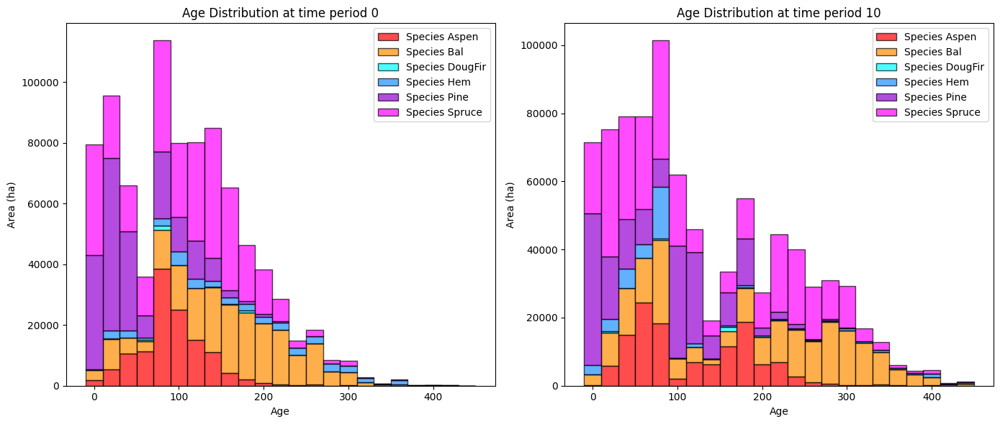

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                    0             10    Difference
Hem      19152.127229    6181.406415 -12970.720813
DougFir    947.047810    1826.436329    879.388519
Bal      59315.970469  103190.283054  43874.312585
Spruce   36410.744598  106090.302348  69679.557750
Aspen    29632.731169   57543.448439  27910.717270
Pine      7432.733686   28846.602045  21413.868359

Overall diversity has **increased** by 150787.12 hectares from time period 0 to time period 10.


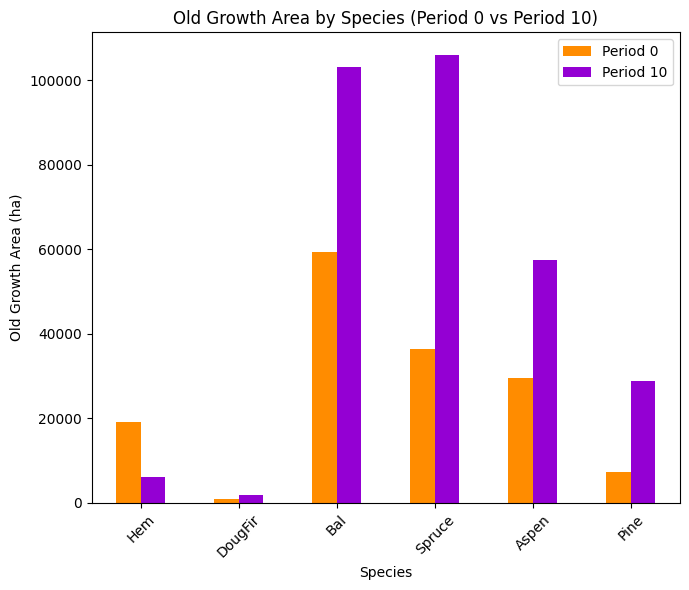

Clustered column plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.7592
Shannon Evenness Index for time period 10: 0.7543

Diversity has **decreased** by 0.49% from time 0 to time 10.


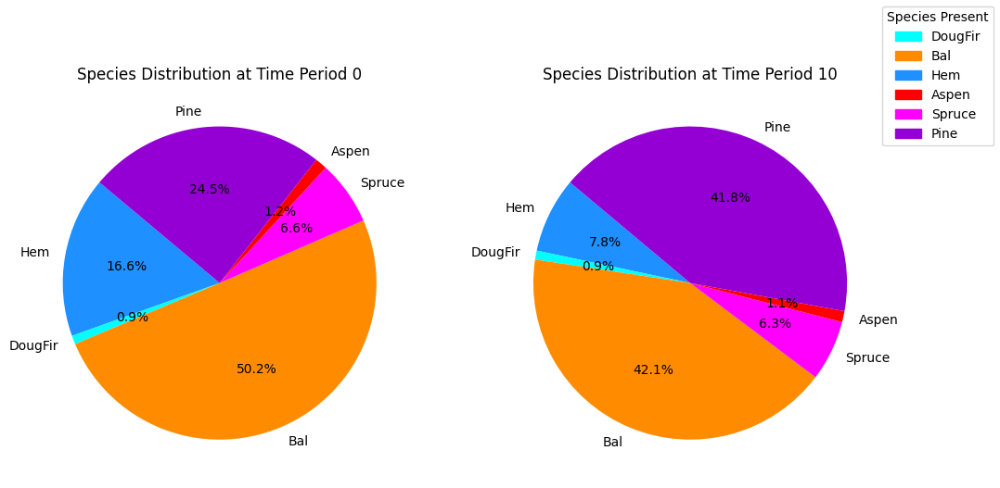

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_ha_bau_eqtslvr_species_pie.pdf


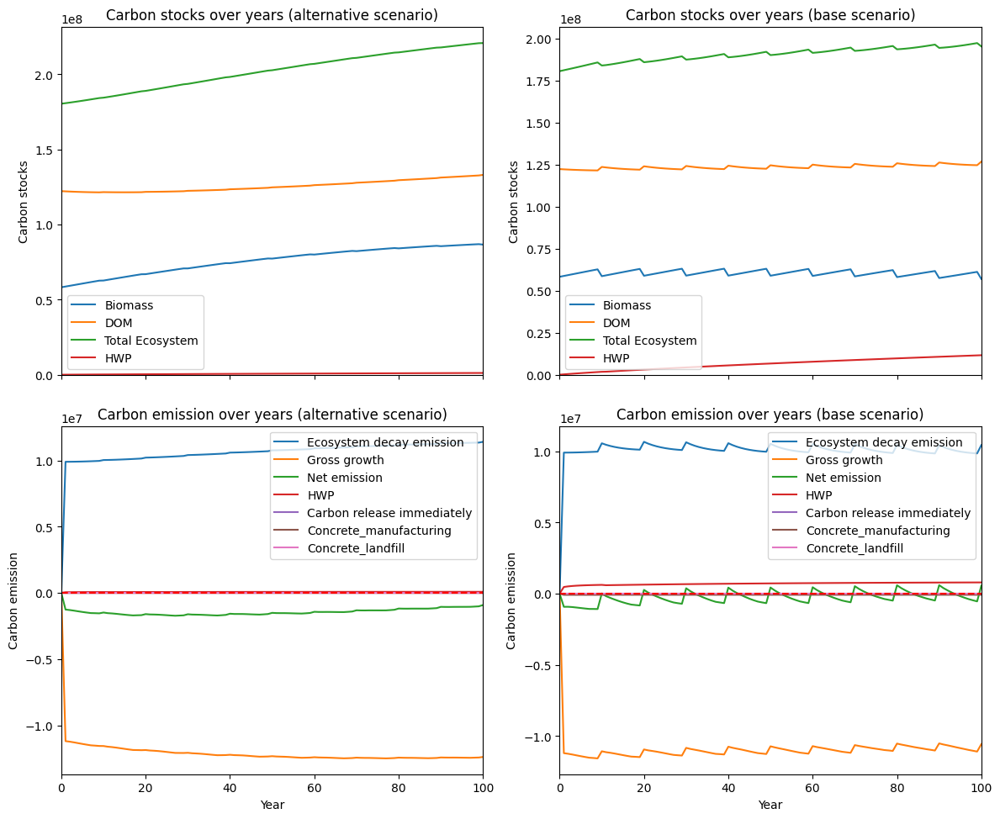

---------------------------------------------------------------------------------------
Net emission difference -22800055.11485461
Net emission base scenario -37212166.91632243
Net emission alternative scenario -14412111.801467825
dollar_per_ton is:  0.43859543100335907
Comparison of Old Growth Areas (Alternative - Base)
           0            10    Difference
Hem      0.0  23502.510915  23502.510915
DougFir  0.0    922.861883    922.861883
Bal      0.0  51563.542182  51563.542182
Spruce   0.0  77828.281392  77828.281392
Aspen    0.0  60332.852308  60332.852308
Pine     0.0  38805.403452  38805.403452

Overall, the old growth area has **increased** by 252955.45 hectares in the alternative scenario compared to the base scenario.


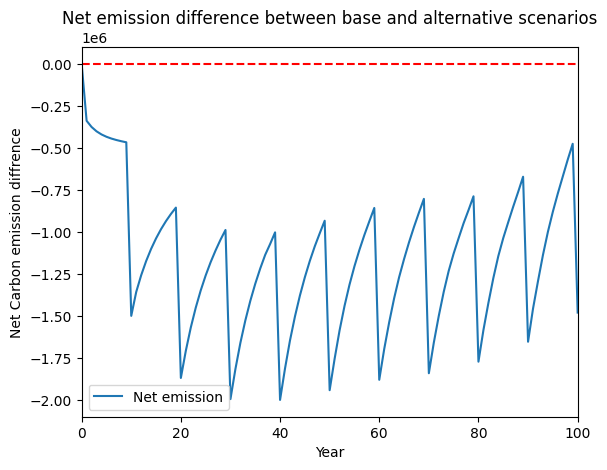

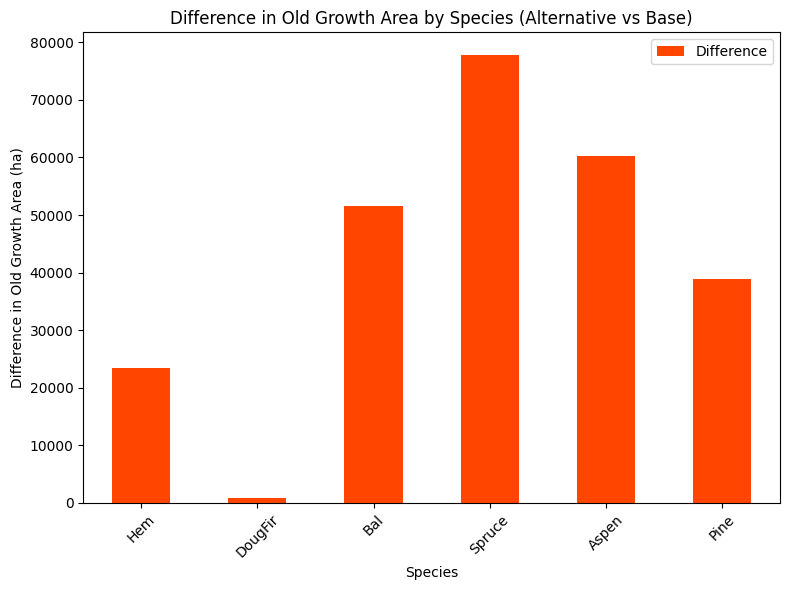

<Figure size 640x480 with 0 Axes>

Plot saved to ./outputs/fig/equitysilver/equitysilver_min_ha_kpi_age_difference.pdf


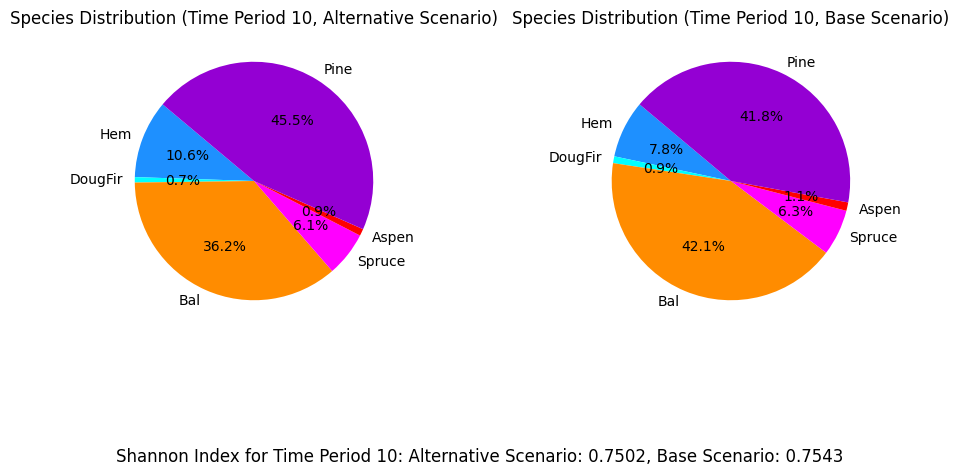

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/equitysilver/equitysilver_min_ha_kpi_species_difference_pie.pdf
---------------------------------------------------------------------------------------
It took 149.5 minutes to run all scenarios.


In [12]:
Start = time.time()
scenario_names = ['eqtslvr_AAC_50%', 'eqtslvr_AAC_40%', 'eqtslvr_AAC_30%', 'eqtslvr_AAC_20%', 'eqtslvr_AAC_10%']
for scenario_name in scenario_names:
    print(f"Running for {case_study}_{obj_mode}_{scenario_name}...")
    results_scenarios(fm, 
                      clt_percentage, 
                      credibility, 
                      budget_input, 
                      n_steps, 
                      max_harvest, 
                      scenario_name, 
                      displacement_effect, 
                      hwp_pool_effect_value, 
                      release_immediately_value, 
                      case_study, 
                      obj_mode,                   
                      pickle_output_base=False, 
                      pickle_output_alter=False)
print('It took', round((time.time() - Start) / 60, 1), "minutes to run all scenarios.")

In [13]:
print('It took', round((time.time() - Start) / 60, 1), "minutes to run this script.")

It took 149.5 minutes to run this script.
